In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

# Streaming ASR
In this tutorial, we will look at one way to use one of NeMo's pretrained Conformer-CTC models for streaming inference. We will first look at some use cases where we may need streaming inference and then we will work towards developing a method for transcribing a long audio file using streaming.

# Why Stream?
Streaming inference may be needed in one of the following scenarios:
* Real-time or close to real-time inference for live transcriptions
* Offline transcriptions of very long audio

In this tutorial, we will mainly focus on streaming for handling long form audio and close to real-time inference with CTC based models. For training ASR models we usually use short segments of audio (<20s) that may be smaller chunks of a long audio that is aligned with the transcriptions and segmented into smaller chunks (see [tools/](https://github.com/NVIDIA/NeMo/tree/main/tools) for some great tools to do this). For running inference on long audio files we are restricted by the available GPU memory that dictates the maximum length of audio that can be transcribed in one inference call. We will take a look at one of the ways to overcome this restriction using NeMo's Conformer-CTC ASR model.

# Conformer-CTC
Conformer-CTC models distributed with NeMo use a combination of self-attention and convolution modules to achieve the best of the two approaches, the self-attention layers can learn the global interaction while the convolutions efficiently capture the local correlations. Use of self-attention layers comes with a cost of increased memory usage at a quadratic rate with the sequence length. That means that transcribing long audio files with Conformer-CTC models needs streaming inference to break up the audio into smaller chunks. We will develop one method to do such inference through the course of this tutorial.

# Data
To demonstrate transcribing a long audio file we will use utterances from the dev-clean set of the [mini Librispeech corpus](https://www.openslr.org/31/).  

In [2]:
# manifest = "datasets/mini-dev-clean/dev_clean_2.json"
# manifest = "chris-manifest.json"
# manifest = "/mnt/data/GTC2019/GTC2019-keynote-parts.json"
manifest = "/home/fjia/data/hub5/manifest_hub5.json"
# manifest = "/mnt/data/vad_sd/ch120/audio/en_4092"

In [ ]:
# concat_audio_path = "/mnt/data/vad_sd/ch120/audio/en_4092.wav"

In [3]:
# you can ignore this if you don't have ref_transcription
import json
all_parts = []
with open(manifest, "r") as mfst_f:
        for l in mfst_f:
            row = json.loads(l.strip())
            all_parts.append(row)
            
row = all_parts[10]
ref_transcript = row['text']
concat_audio_path = row['audio_filepath']
new_duration = row['duration']

Let's create a long audio that is about 15 minutes long by concatenating audio from dev-clean  and also create the corresponding concatenated transcript.

In [4]:
ref_transcript

'mhm right mhm uh mhm right mhm an interesting observation uh uh mhm mhm uhhuh right oh mhm mhm yeah oh yes yeah uh yeah mhm yeah uh right yeah and uh well now will you check out the thermostat first mhm and uh so preferably that will be all it all it needs alright did i bring my torsion wrench up to you okay oh oh mhm maybe you can trade off for it then trade uh trade the one i brought up uh into the dial one yeah and uh yeah mhm so mhm right'

# Streaming with CTC based models
Now let's try to transcribe the long audio file created above using a conformer-large model.

In [5]:
import torch
import nemo.collections.asr as nemo_asr
import contextlib
import gc

[NeMo W 2021-09-28 19:55:26 nmse_clustering:54] Using eigen decomposition from scipy, upgrade torch to 1.9 or higher for faster clustering
################################################################################
### WARNING, path does not exist: KALDI_ROOT=/mnt/matylda5/iveselyk/Tools/kaldi-trunk
###          (please add 'export KALDI_ROOT=<your_path>' in your $HOME/.profile)
###          (or run as: KALDI_ROOT=<your_path> python <your_script>.py)
################################################################################

[NeMo W 2021-09-28 19:55:26 nemo_logging:349] /home/fjia/anaconda3/envs/vad/lib/python3.7/site-packages/torchaudio/backend/utils.py:54: UserWarning: "sox" backend is being deprecated. The default backend will be changed to "sox_io" backend in 0.8.0 and "sox" backend will be removed in 0.9.0. Please migrate to "sox_io" backend. Please refer to https://github.com/pytorch/audio/issues/903 for the detail.
      '"sox" backend is being deprecated. '
    
[NeM

In [6]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

We are mainly concerned about decoding on the GPU in this tutorial. CPU decoding may be able to handle longer files but would also not be as fast as GPU decoding. Let's check if we can run transcribe() on the long audio file that we created above.

In [7]:
# Clear up memory
torch.cuda.empty_cache()
gc.collect()
# model = nemo_asr.models.EncDecCTCModelBPE.from_pretrained("stt_en_conformer_ctc_large", map_location=device)
model = nemo_asr.models.EncDecCTCModelBPE.restore_from("./deployed/CitriNet-1024-8x-Stride-Gamma-0.25.nemo", map_location=device)
device = 'cuda' if torch.cuda.is_available() else 'cpu'
# device = 'cpu'  # You can transcribe even longer samples on the CPU, though it will take much longer !
model = model.to(device)
# vad_model = nemo_asr.models.EncDecClassificationModel.from_pretrained('vad_marblenet')
# vad_model = nemo_asr.models.EncDecClassificationModel.restore_from("/home/fjia/code/NeMo-fei/examples/asr/nemo_experiments/lr0.02_200_1/2021-09-10_16-54-52/checkpoints/lr0.02_200_1.nemo",  map_location=device)
# vad_model = nemo_asr.models.EncDecClassificationModel.restore_from("/home/fjia/code/NeMo-fei/examples/asr/nemo_experiments/lr0.01_50/2021-09-20_13-41-32/checkpoints/lr0.01_50.nemo",  map_location=device)
# vad_model = nemo_asr.models.EncDecClassificationModel.restore_from("/home/fjia/code/NeMo-fei/examples/asr/nemo_experiments/lr0.02_50/2021-09-20_21-59-22/checkpoints/lr0.02_50.nemo",  map_location=device)
vad_model = nemo_asr.models.EncDecClassificationModel.restore_from("/home/fjia/code/NeMo-fei/examples/asr/nemo_experiments/lr0.02_200_default_normPertu/2021-09-21_20-58-34/checkpoints/lr0.02_200_default_normPertu.nemo",  map_location=device)
vad_model = vad_model.to(device)

[NeMo I 2021-09-28 19:55:30 mixins:149] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2021-09-28 19:55:31 modelPT:131] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /data/dataset/train/tarred_audio_manifest.json
    sample_rate: 16000
    batch_size: 16
    trim_silence: false
    max_duration: 20.0
    shuffle: true
    is_tarred: true
    tarred_audio_filepaths: /data/dataset/train/audio__OP_0..4095_CL_.tar
    use_start_end_token: false
    num_workers: 16
    pin_memory: true
    
[NeMo W 2021-09-28 19:55:31 modelPT:138] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath:
    - /data/librispeech/LibriSpeech/librivox-test-other.json
    - /data/librispeech/LibriSpeech/librivox-dev-other.json
 

[NeMo I 2021-09-28 19:55:31 features:262] PADDING: 16
[NeMo I 2021-09-28 19:55:31 features:279] STFT using torch
[NeMo I 2021-09-28 19:55:35 save_restore_connector:143] Model EncDecCTCModelBPE was successfully restored from /home/fjia/code/NeMo-fei/tutorials/asr/deployed/CitriNet-1024-8x-Stride-Gamma-0.25.nemo.


[NeMo W 2021-09-28 19:55:35 modelPT:131] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /home/fjia/data/0_vad_manifest/manifest/ami_train_0.63.json,/home/fjia/data/0_vad_manifest/manifest/background_train_manifest.json,/home/fjia/data/0_vad_manifest/manifest/fisher_2004_background.json,/home/fjia/data/0_vad_manifest/manifest/fisher_2004_speech_sampled.json,/home/fjia/data/0_vad_manifest/manifest/google_train_manifest.json,/home/fjia/data/0_vad_manifest/manifest/icsi_all_0.63.json,/home/fjia/data/0_vad_manifest/manifest/musan_freesound_train.json,/home/fjia/data/0_vad_manifest/manifest/musan_music_train.json,/home/fjia/data/0_vad_manifest/manifest/musan_soundbible_train.json,/home/fjia/data/0_vad_manifest/manifest/freesound_0917_train.json
    sample_rate: 16000
    labels:
    - background
    - speech
    batch_size: 128
 

[NeMo I 2021-09-28 19:55:35 features:262] PADDING: 16
[NeMo I 2021-09-28 19:55:35 features:279] STFT using torch
[NeMo I 2021-09-28 19:55:36 save_restore_connector:143] Model EncDecClassificationModel was successfully restored from /home/fjia/code/NeMo-fei/examples/asr/nemo_experiments/lr0.02_200_default_normPertu/2021-09-21_20-58-34/checkpoints/lr0.02_200_default_normPertu.nemo.


In [8]:
vad_model.eval()

EncDecClassificationModel(
  (preprocessor): AudioToMelSpectrogramPreprocessor(
    (featurizer): FilterbankFeatures()
  )
  (encoder): ConvASREncoder(
    (encoder): Sequential(
      (0): JasperBlock(
        (mconv): ModuleList(
          (0): MaskedConv1d(
            (conv): Conv1d(64, 64, kernel_size=[11], stride=[1], padding=(5,), dilation=[1], groups=64, bias=False)
          )
          (1): MaskedConv1d(
            (conv): Conv1d(64, 128, kernel_size=(1,), stride=(1,), bias=False)
          )
          (2): BatchNorm1d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
        )
        (mout): Sequential(
          (0): ReLU(inplace=True)
          (1): Dropout(p=0.0, inplace=False)
        )
      )
      (1): JasperBlock(
        (mconv): ModuleList(
          (0): MaskedConv1d(
            (conv): Conv1d(128, 128, kernel_size=[13], stride=[1], padding=(6,), dilation=[1], groups=128, bias=False)
          )
          (1): MaskedConv1d(
            (conv)

In [9]:
# Helper for torch amp autocast
if torch.cuda.is_available():
    autocast = torch.cuda.amp.autocast
else:
    @contextlib.contextmanager
    def autocast():
        print("AMP was not available, using FP32!")
        yield

The call to transcribe() below should fail with a "CUDA out of memory" error when run on a GPU with 32 GB memory.

In [10]:
with autocast():
    transcript = model.transcribe([concat_audio_path], batch_size=1)[0]

Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo W 2021-09-28 19:55:36 patch_utils:50] torch.stft() signature has been updated for PyTorch 1.7+
    Please update PyTorch to remain compatible with later versions of NeMo.
[NeMo W 2021-09-28 19:55:36 nemo_logging:349] /home/fjia/anaconda3/envs/vad/lib/python3.7/site-packages/torch/functional.py:516: UserWarning: The function torch.rfft is deprecated and will be removed in a future PyTorch release. Use the new torch.fft module functions, instead, by importing torch.fft and calling torch.fft.fft or torch.fft.rfft. (Triggered internally at  /pytorch/aten/src/ATen/native/SpectralOps.cpp:590.)
      normalized, onesided, return_complex)
    


In [11]:
transcript

"m hm right mhm uh mhm right mhm it's an interesting observationhuh mhm h mhm uhhuh right oh mhm mhm yeah oh yes yeah hm yeah mhm yeah hm right yeah and well now would you check out the form sta first mhm and uh so powerly that will be all all it needs oh did i bring my tors and ranch up to you okay oh oh m maybe you can trade off for it then try to try the one i brought up uh into the dial one yeah and uh yeah mhm so mhm right"

In [12]:
ref_transcript

'mhm right mhm uh mhm right mhm an interesting observation uh uh mhm mhm uhhuh right oh mhm mhm yeah oh yes yeah uh yeah mhm yeah uh right yeah and uh well now will you check out the thermostat first mhm and uh so preferably that will be all it all it needs alright did i bring my torsion wrench up to you okay oh oh mhm maybe you can trade off for it then trade uh trade the one i brought up uh into the dial one yeah and uh yeah mhm so mhm right'

In [13]:
# # WER calculation
from nemo.collections.asr.metrics.wer import word_error_rate
wer = word_error_rate(hypotheses=[transcript], references=[ref_transcript])

print(f"WER: {round(wer*100,2)}%")

WER: 23.71%


In [14]:
# Clear up memory
torch.cuda.empty_cache()
gc.collect()

40698

# Buffer mechanism for streaming long audio files
One way to transcribe long audio with a Conformer-CTC model would be to split the audio into consecutive smaller chunks and running inference on each chunk. Care should be taken to have enough context for audio at either edges for accurate transcription. Let's introduce some terminology here to help us navigate the rest of this tutorial. 

* Buffer size is the length of audio on which inference is run
* Chunk size is the length of new audio that is added to the buffer.

An audio buffer is made up of a chunk of audio with some padded audio from previous chunk. In order to make the best predictions with enough context for the beginning and end portions of the buffer, we only collect tokens for the middle portion of the buffer of length equal to the size of each chunk.  

Let's suppose that the maximum length of audio that can be transcribed with conformer-large model is 20s, then we can use 20s as the buffer size and use 15s (for example) as the chunk size, so one hour of audio is broken into 240 chunks of 15s each. Let's take a look at a few audio buffers that may be created for this audio.

In [15]:
# A simple iterator class to return successive chunks of samples
class AudioChunkIterator():
    def __init__(self, samples, frame_len, sample_rate):
        self._samples = samples
        self._chunk_len = chunk_len_in_secs*sample_rate
        self._start = 0
        self.output=True
   
    def __iter__(self):
        return self
    
    def __next__(self):
        if not self.output:
            raise StopIteration
        last = int(self._start + self._chunk_len)
        if last <= len(self._samples):
            chunk = self._samples[self._start: last]
            self._start = last
        else:
            chunk = np.zeros([int(self._chunk_len)], dtype='float32')
            samp_len = len(self._samples) - self._start
            chunk[0:samp_len] = self._samples[self._start:len(self._samples)]
            self.output = False
   
        return chunk

In [16]:
# a helper function for extracting samples as a numpy array from the audio file
import soundfile as sf
def get_samples(audio_file, target_sr=16000):
    with sf.SoundFile(audio_file, 'r') as f:
        dtype = 'int16'
        sample_rate = f.samplerate
        samples = f.read(dtype=dtype)
        if sample_rate != target_sr:
            samples = librosa.core.resample(samples, sample_rate, target_sr)
        samples=samples.astype('float32')/32768
        samples = samples.transpose()
        return samples

Let's take a look at each chunk of speech that is used for decoding.

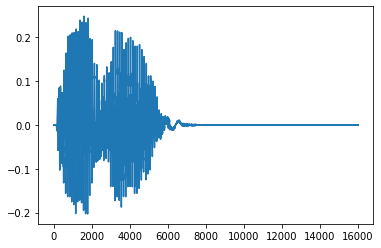

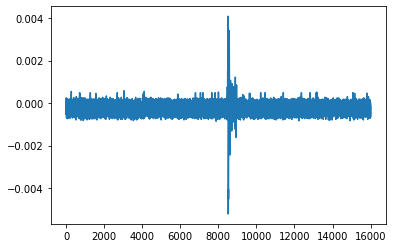

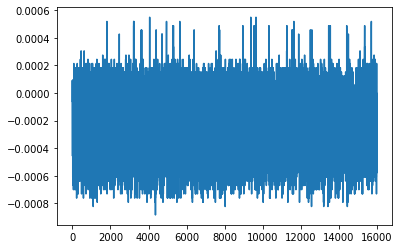

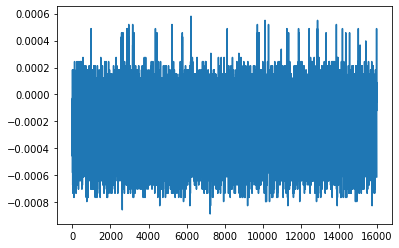

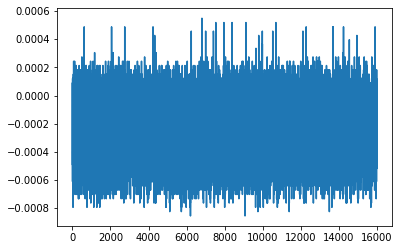

In [17]:
import matplotlib.pyplot as plt
samples = get_samples(concat_audio_path)
sample_rate  = model.preprocessor._cfg['sample_rate'] 
chunk_len_in_secs = 1            
chunk_reader = AudioChunkIterator(samples, chunk_len_in_secs, sample_rate)
count = 0
for chunk in chunk_reader:
    count +=1
    plt.plot(chunk)
    plt.show()
    if count >= 5:
        break


Now, let's plot the actual buffers at each stage after a new chunk is added to the buffer. Audio buffer can be thought of as a fixed size queue with each incoming chunk added at the end of the buffer and the oldest samples removed from the beginning.

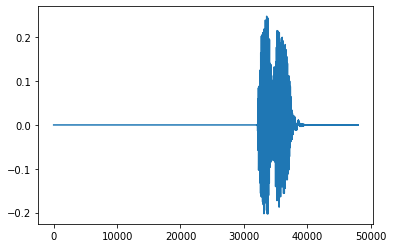

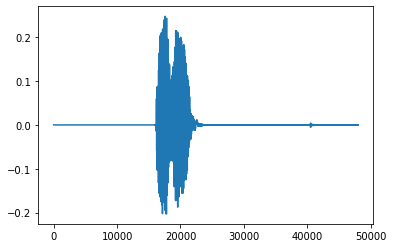

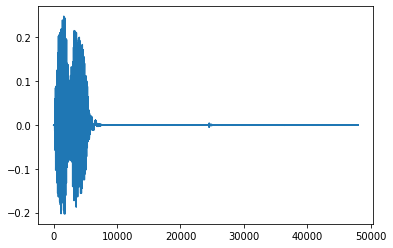

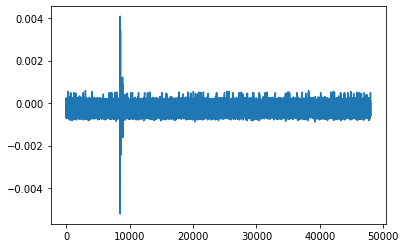

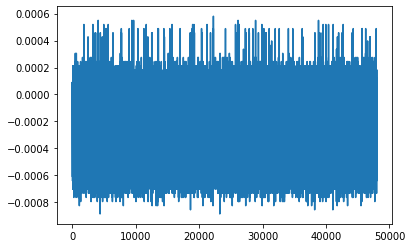

In [18]:
import numpy as np
context_len_in_secs = 1

buffer_len_in_secs = chunk_len_in_secs + 2* context_len_in_secs

buffer_len = sample_rate*buffer_len_in_secs
sampbuffer = np.zeros([buffer_len], dtype=np.float32)

chunk_reader = AudioChunkIterator(samples, chunk_len_in_secs, sample_rate)
chunk_len = sample_rate*chunk_len_in_secs
count = 0
for chunk in chunk_reader:
    count +=1
    sampbuffer[:-chunk_len] = sampbuffer[chunk_len:]
    sampbuffer[-chunk_len:] = chunk
    plt.plot(sampbuffer)
    plt.show()
    if count >= 5:
        break

Now that we have a method to split the long audio into smaller chunks, we can now work on transcribing the individual buffers and merging the outputs to get the transcription of the whole audio.
First, we implement some helper functions to help load the buffers into the data layer.

In [19]:
from nemo.core.classes import IterableDataset

def speech_collate_fn(batch):
    """collate batch of audio sig, audio len
    Args:
        batch (FloatTensor, LongTensor):  A tuple of tuples of signal, signal lengths.
        This collate func assumes the signals are 1d torch tensors (i.e. mono audio).
    """

    _, audio_lengths = zip(*batch)

    max_audio_len = 0
    has_audio = audio_lengths[0] is not None
    if has_audio:
        max_audio_len = max(audio_lengths).item()
   
    
    audio_signal= []
    for sig, sig_len in batch:
        if has_audio:
            sig_len = sig_len.item()
            if sig_len < max_audio_len:
                pad = (0, max_audio_len - sig_len)
                sig = torch.nn.functional.pad(sig, pad)
            audio_signal.append(sig)
        
    if has_audio:
        audio_signal = torch.stack(audio_signal)
        audio_lengths = torch.stack(audio_lengths)
    else:
        audio_signal, audio_lengths = None, None

    return audio_signal, audio_lengths

# simple data layer to pass audio signal
class AudioBuffersDataLayer(IterableDataset):
    

    def __init__(self):
        super().__init__()

        
    def __iter__(self):
        return self
    
    def __next__(self):
        if self._buf_count == len(self.signal) :
            raise StopIteration
        self._buf_count +=1
        return torch.as_tensor(self.signal[self._buf_count-1], dtype=torch.float32), \
               torch.as_tensor(self.signal_shape[0], dtype=torch.int64)
        
    def set_signal(self, signals):
        self.signal = signals
        self.signal_shape = self.signal[0].shape
        self._buf_count = 0

    def __len__(self):
        return 1
    

Next we implement a class that implements transcribing audio buffers and merging the tokens corresponding to a chunk of audio within each buffer. 

For each buffer, we pick tokens corresponding to one chunk length of audio. The chunk within each buffer is chosen such that there is equal left and right context available to the audio within the chunk.

For example, if the chunk size is 1s and buffer size is 3s, we collect tokens corresponding to audio starting from 1s to 2s within each buffer. Conformer-CTC models have a model stride of 4, i.e., a token is produced for every 4 feature vectors in the time domain. MelSpectrogram features are generated once every 10 ms, so a token is produced for every 40 ms of audio.

**Note:** The inherent assumption here is that the output tokens from the model are well aligned with corresponding audio segments. This may not always be true for models trained with CTC loss, so this method of streaming inference may not always work with CTC based models. 

In [20]:
int(16000*0.63)

10080

In [21]:
from torch.utils.data import DataLoader
import math
import numpy as np
class ChunkBufferDecoder:

    def __init__(self,asr_model, vad_model, stride, chunk_len_in_secs=1, buffer_len_in_secs=3, vad_context_window_len_in_secs=0.63):
        self.vad_model = vad_model
        self.asr_model = asr_model
        self.asr_model.eval()
        self.data_layer = AudioBuffersDataLayer()
        self.data_loader = DataLoader(self.data_layer, batch_size=128, collate_fn=speech_collate_fn)
        self.buffers = []
        self.all_preds = []
        self.all_vad_preds = []
        self.vad_buffer = [0] * 25
        self.vad_buffer_output = [0] * 25
        self.chunk_len = chunk_len_in_secs
        self.buffer_len = buffer_len_in_secs
        self.vad_context_window_len_in_secs = vad_context_window_len_in_secs
        assert(chunk_len_in_secs<=buffer_len_in_secs)
        
        feature_stride = asr_model._cfg.preprocessor['window_stride']
        self.model_stride_in_secs = feature_stride * stride
        self.n_tokens_per_chunk = math.ceil(self.chunk_len / self.model_stride_in_secs)
        self.blank_id = len(asr_model.decoder.vocabulary)
        self.plot=False
        
    @torch.no_grad()    
    def transcribe_buffers(self, buffers, merge=True, vad_gate=False, plot=False, threshold=0.4, last_k=25):
        self.plot = plot
        self.buffers = buffers
        self.data_layer.set_signal(buffers[:])
        self._get_batch_preds()      
        return self.decode_final(merge, vad_gate, threshold, last_k=last_k)
    
    def _postprocessing_gate_vad(self, vad_pred, threshold=0.4, min_num_speech=0, last_k=25):
        """
        simpliest case. if at least ONE 1 in the buffer, this buffer is speech
        need to find better decision method, this is just an example here

        """
        self.vad_buffer = self.vad_buffer[1:]
        self.vad_buffer.append(vad_pred.cpu().numpy().item())
        
        # place to perform filter/postprocessing

        self.vad_buffer_output = [1 if i > threshold else 0 for i in self.vad_buffer]

        if 1 in self.vad_buffer_output[-last_k:]:
             buffer_vad_decision = 1
        else:
             buffer_vad_decision = 0

        return buffer_vad_decision

    
    def _get_batch_preds(self):
        # TODO clean batch
        
        vad_segment = int(16000 * self.vad_context_window_len_in_secs)
        device = self.asr_model.device
        
        for batch in iter(self.data_loader):

            audio_signal, audio_signal_len = batch
            audio_signal, audio_signal_len = audio_signal.to(device), audio_signal_len.to(device)
           
            vad_audio_signal, vad_audio_signal_len = audio_signal[:, -vad_segment:], torch.full_like(audio_signal_len, vad_segment) 
            vad_audio_signal, vad_audio_signal_len = vad_audio_signal.to(device), vad_audio_signal_len.to(device)
            
            # ASR batch inference
            log_probs, encoded_len, predictions = self.asr_model(input_signal=audio_signal, input_signal_length=audio_signal_len)
            preds = torch.unbind(predictions)
            for pred in preds:
                self.all_preds.append(pred.cpu().numpy())
                

            # VAD batch inference
            logits = self.vad_model(input_signal=vad_audio_signal, input_signal_length=vad_audio_signal_len)
            vad_probs = torch.softmax(logits, dim=-1)
            vad_pred = vad_probs[:, 1] 
            self.all_vad_preds.extend(vad_pred)
     
    
    def decode_final(self, merge=True, vad_gate=False, threshold=0.4, last_k=25, extra=0):
        self.unmerged = []
        self.toks_unmerged = []
        # index for the first token corresponding to a chunk of audio would be len(decoded) - 1 - delay
        delay = math.ceil((self.chunk_len + (self.buffer_len - self.chunk_len) / 2) / self.model_stride_in_secs)

        decoded_frames = []
        all_toks = []
        """
        for pred in self.all_preds:
            ids, toks = self._greedy_decoder(pred, self.asr_model.tokenizer)
            decoded_frames.append(ids)
            all_toks.append(toks)
        """
        
        
        for i in range(len(self.all_preds)):
            buffer_vad_decision = self._postprocessing_gate_vad(self.all_vad_preds[i], 
                                                                      threshold=threshold, 
                                                                      last_k=last_k)
            # print(self.vad_buffer, self.all_vad_preds[i])
            # decide whether to add this buffer's result based on VAD decision
            if vad_gate:
                if buffer_vad_decision > 0:
                    ids, toks = self._greedy_decoder(self.all_preds[i], self.asr_model.tokenizer)
                    decoded_frames.append(ids)
                    all_toks.append(toks)
                else:
                    if self.plot:
                        all_toks.append(-1)
                    continue
            else:
                ids, toks = self._greedy_decoder(self.all_preds[i], self.asr_model.tokenizer)
                decoded_frames.append(ids)
                all_toks.append(toks)
                
        print("length of decoded frame",  len(decoded_frames))
                
        for decoded in decoded_frames:
            self.unmerged += decoded[len(decoded) - 1 - delay:len(decoded) - 1 - delay + self.n_tokens_per_chunk]
            
        if self.plot:
            print("Note the plot is based on collected all_toks")

            for i, tok in enumerate(all_toks):
                if tok == -1:
                    print("======= filtered_out ======")
                    continue
                
                plt.figure(figsize=[10, 2])
                ax1 = plt.subplot()
                ax1.plot(np.arange(len(self.buffers[i])), self.buffers[i], 'gray')
                ax1.tick_params(axis='y', labelcolor='b')
                ax1.set_ylabel('Signal')
                ax1.set_ylim([-1, 1])
#                 ax1.set_xlim(0, )
                ax2 = ax1.twinx()
                ax2.plot(np.arange(len(self.vad_buffer_output))*2560 , self.vad_buffer_output, 'b', label='pred')
                ax2.plot(np.arange(len(self.vad_buffer))*2560 , self.vad_buffer, 'g--', label='prob')
#                 ax2.plot(np.arange(len_pred) * FRAME_LEN, prob, 'g--', label='speech prob')
#                 ax2.set_xlim(0, )
                ax2.tick_params(axis='y', labelcolor='r')
                ax2.set_ylabel('Preds')
                ax2.set_ylim([-0.1, 1.1])
                plt.show()
                
                print("\nGreedy labels collected from this buffer")
                print(tok[len(tok) - 1 - delay:len(tok) - 1 - delay + self.n_tokens_per_chunk])                
                self.toks_unmerged += tok[len(tok) - 1 - delay:len(tok) - 1 - delay + self.n_tokens_per_chunk]
                
                
                buffer_vad_decision = self._postprocessing_gate_vad(self.all_vad_preds[i], threshold=0.4)
#                 print("\n VAD prediction for this buffer", self.vad_buffer)
                print("\n VAD output for this buffer", self.vad_buffer_output)
        
                print("\n VAD gate decision for this buffer", buffer_vad_decision)
                print("\n VAD preds from this frame", self.all_vad_preds[i])
                
            # TODO it's not succesive anymore 
            print("\nTokens collected from succesive buffers before CTC merge")
            print(self.toks_unmerged)

        if not merge:
            return self.unmerged
        return self.greedy_merge(self.unmerged)
    
    
    def _greedy_decoder(self, preds, tokenizer):
        s = []
        ids = []
        for i in range(preds.shape[0]):
            if preds[i] == self.blank_id:
                s.append("_")
            else:
                pred = preds[i]
                s.append(tokenizer.ids_to_tokens([pred.item()])[0])
            ids.append(preds[i])
        return ids, s
         
    def greedy_merge(self, preds):
        decoded_prediction = []
        previous = self.blank_id
        for p in preds:
            if (p != previous or previous == self.blank_id) and p != self.blank_id:
                decoded_prediction.append(p.item())
            previous = p
        hypothesis = self.asr_model.tokenizer.ids_to_text(decoded_prediction)
        return hypothesis


To see how this chunk based decoder comes together, let's call the decoder with a few buffers we create from our long audio file.
Some interesting experiments to try would be to see how changing sizes of the chunk and the context affects transcription accuracy.  

In [22]:

# chunk_len_in_secs = 4
# context_len_in_secs = 2

# buffer_len_in_secs = chunk_len_in_secs + 2* context_len_in_secs


chunk_len_in_secs = 0.16
buffer_len_in_secs = 4



n_buffers = 200 #5

buffer_len = sample_rate*buffer_len_in_secs

sampbuffer = np.zeros([buffer_len], dtype=np.float32)

chunk_reader = AudioChunkIterator(samples, chunk_len_in_secs, sample_rate)

chunk_len = int(sample_rate*chunk_len_in_secs)
count = 0
buffer_list = []
for chunk in chunk_reader:
    count +=1
    sampbuffer[:-chunk_len] = sampbuffer[chunk_len:]
    sampbuffer[-chunk_len:] = chunk
    buffer_list.append(np.array(sampbuffer))
   
    if count >= n_buffers:
        break


length of decoded frame 90
Note the plot is based on collected all_toks


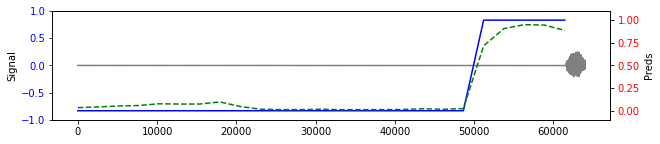


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.7387, device='cuda:0')


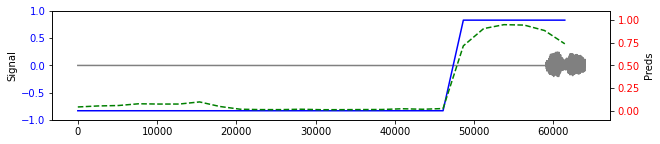


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.8999, device='cuda:0')


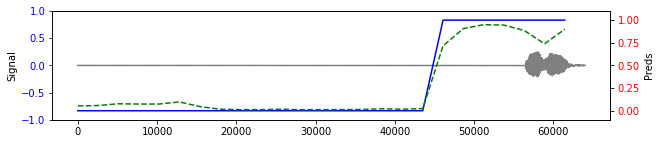


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.8946, device='cuda:0')


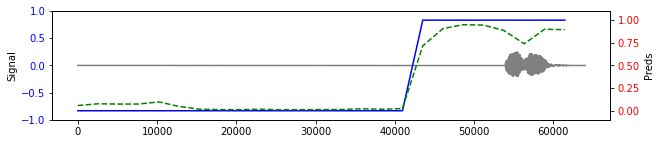


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.8929, device='cuda:0')


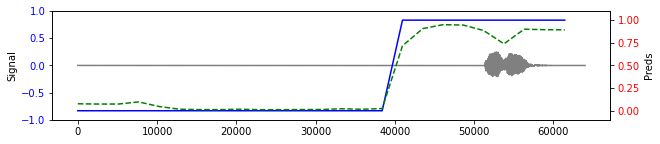


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.8172, device='cuda:0')


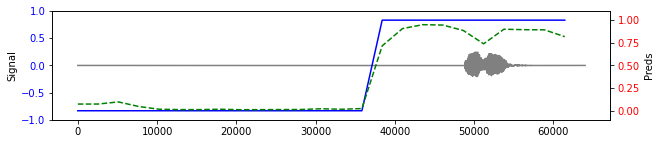


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.3110, device='cuda:0')


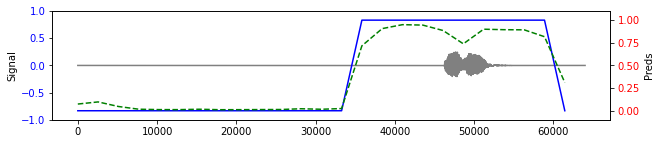


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0117, device='cuda:0')


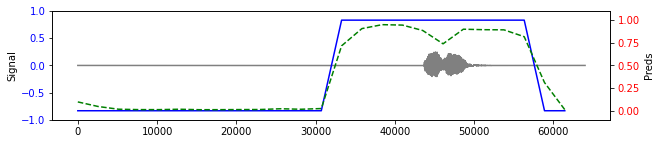


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0114, device='cuda:0')


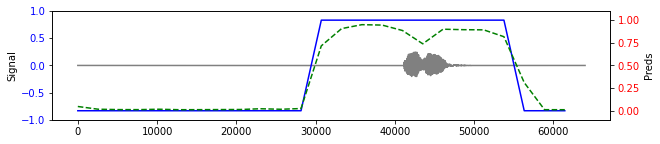


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0116, device='cuda:0')


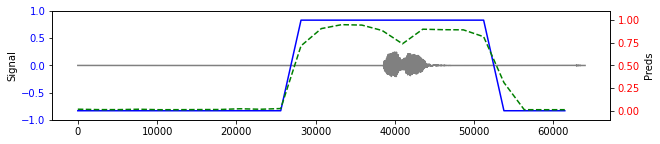


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0124, device='cuda:0')


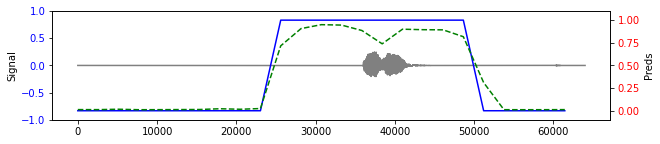


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0104, device='cuda:0')


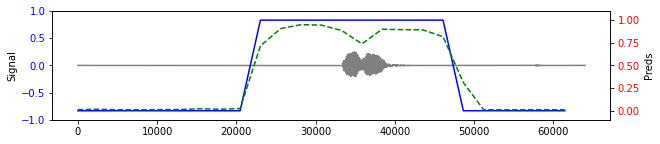


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0083, device='cuda:0')


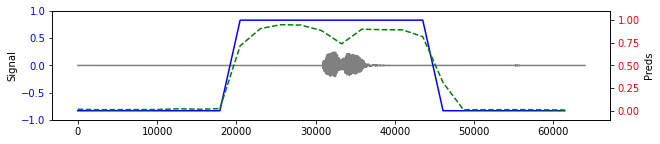


Greedy labels collected from this buffer
['▁mhm', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0160, device='cuda:0')


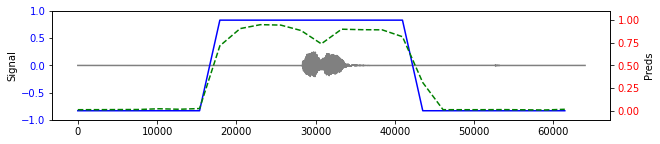


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0128, device='cuda:0')


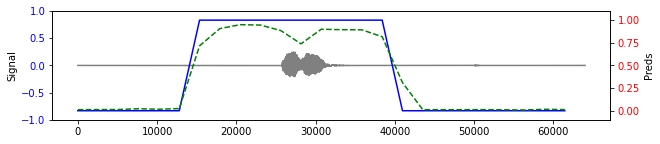


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0107, device='cuda:0')


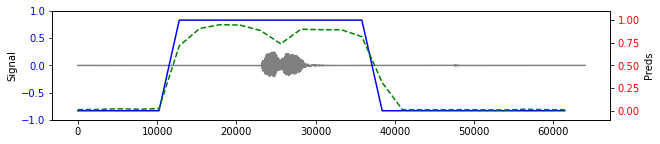


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0121, device='cuda:0')


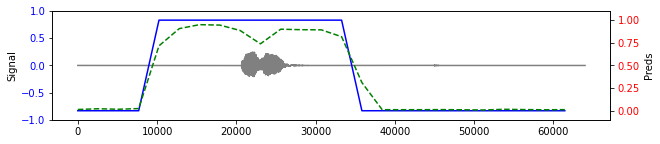


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0120, device='cuda:0')


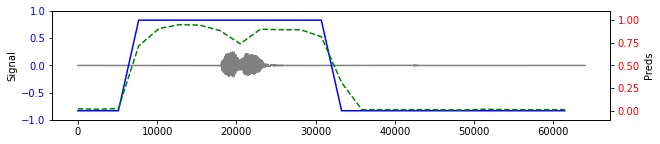


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0150, device='cuda:0')


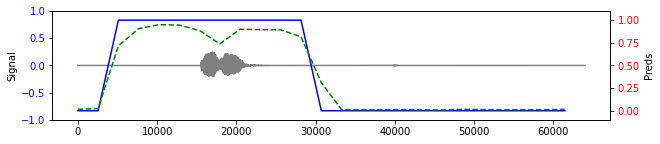


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0132, device='cuda:0')


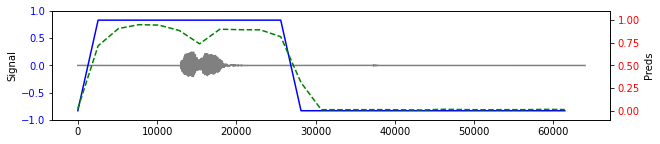


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0142, device='cuda:0')


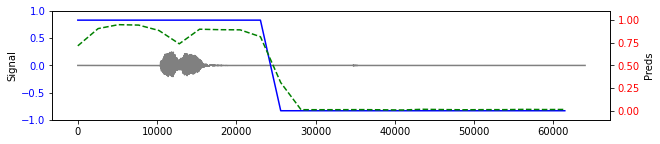


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0118, device='cuda:0')


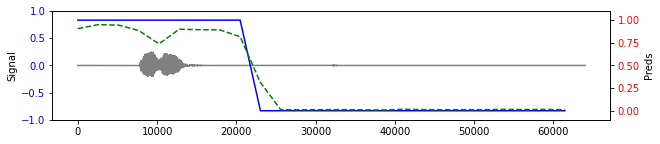


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0145, device='cuda:0')


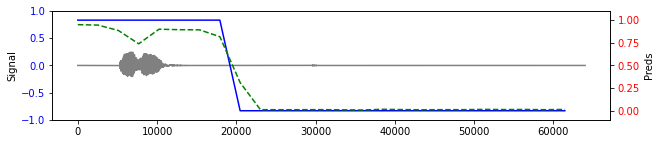


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0115, device='cuda:0')


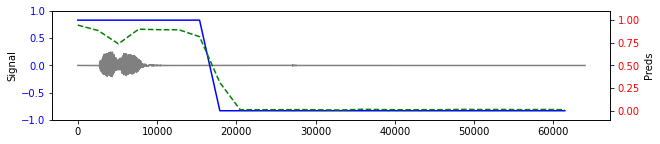


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0118, device='cuda:0')


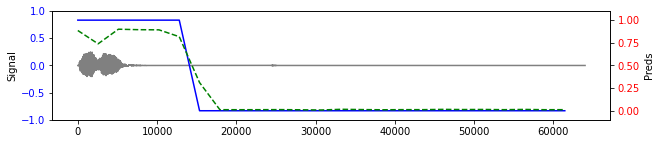


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0110, device='cuda:0')


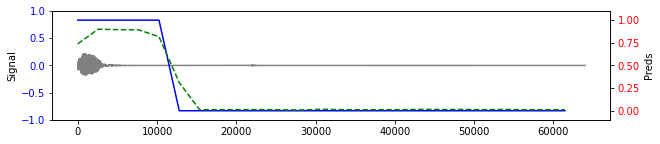


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0109, device='cuda:0')


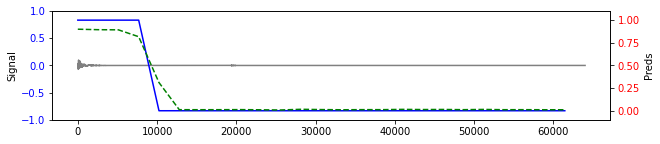


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0119, device='cuda:0')


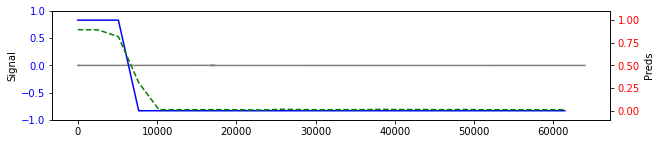


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0121, device='cuda:0')


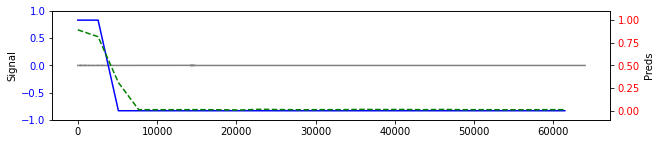


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0120, device='cuda:0')
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered

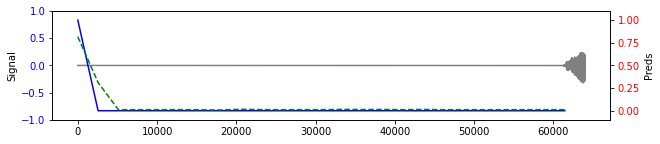


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.8485, device='cuda:0')


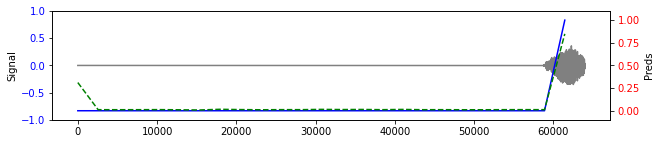


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9735, device='cuda:0')


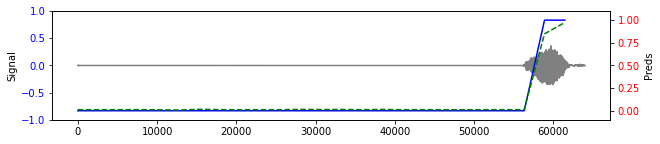


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9438, device='cuda:0')


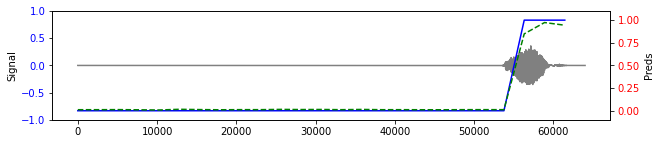


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9534, device='cuda:0')


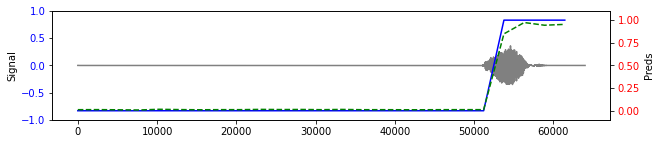


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.8914, device='cuda:0')


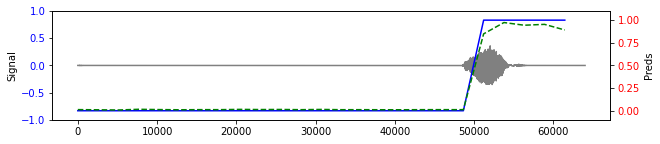


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1962, device='cuda:0')


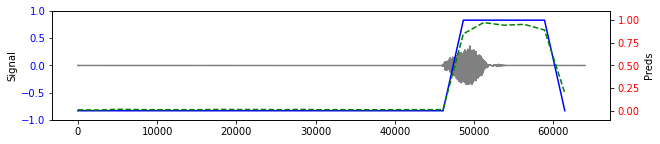


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0124, device='cuda:0')


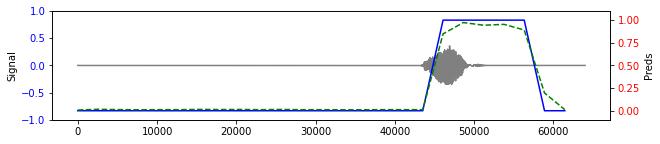


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0221, device='cuda:0')


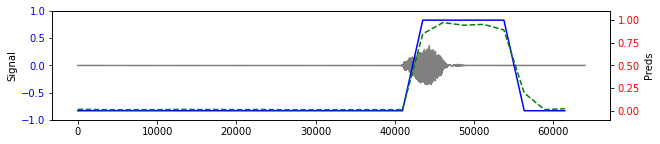


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0251, device='cuda:0')


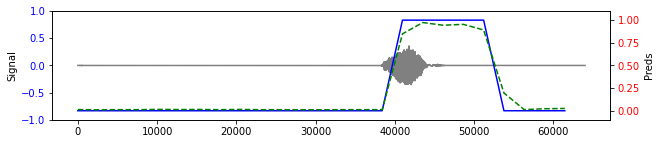


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0261, device='cuda:0')


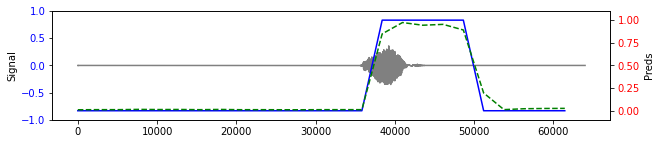


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0213, device='cuda:0')


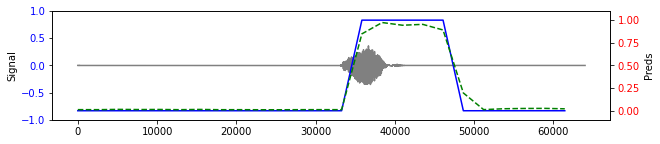


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0122, device='cuda:0')


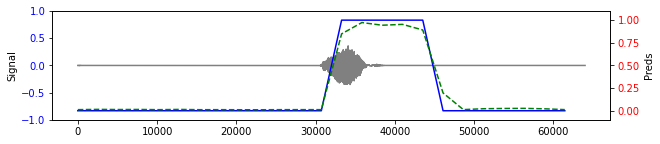


Greedy labels collected from this buffer
['▁right', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0121, device='cuda:0')


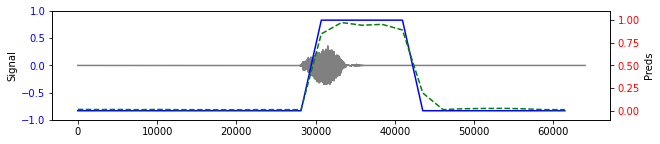


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0127, device='cuda:0')


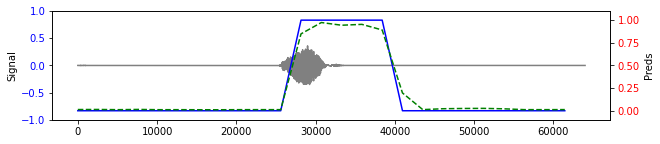


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0105, device='cuda:0')


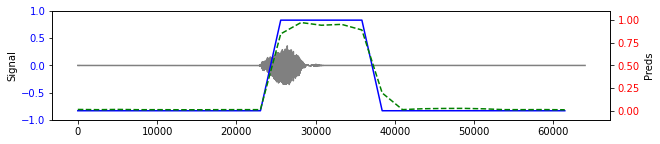


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0124, device='cuda:0')


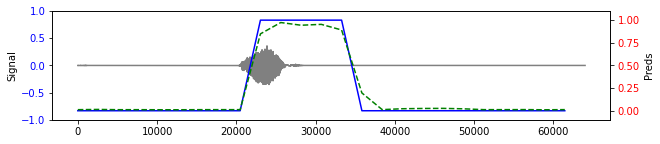


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0110, device='cuda:0')


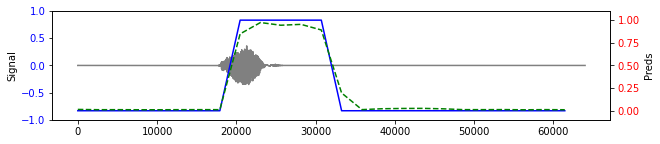


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0122, device='cuda:0')


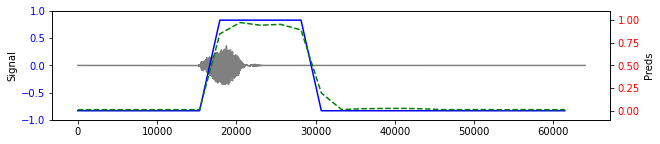


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0126, device='cuda:0')


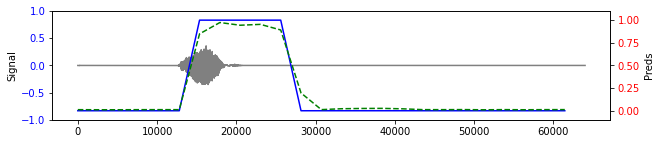


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0114, device='cuda:0')


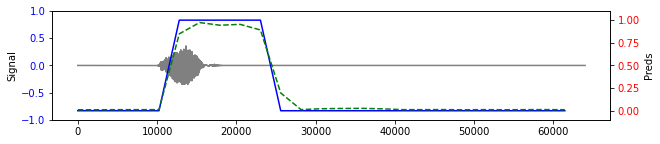


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0116, device='cuda:0')


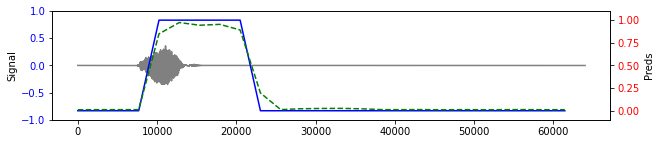


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0121, device='cuda:0')


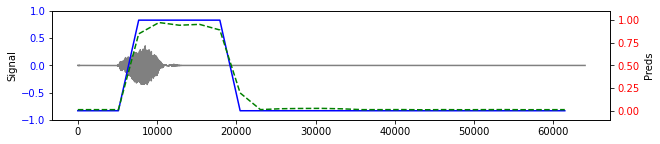


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0115, device='cuda:0')


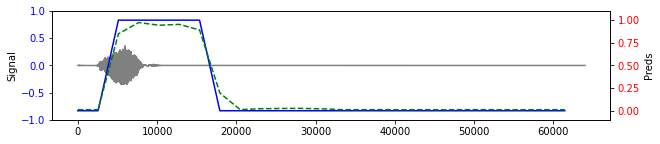


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0101, device='cuda:0')


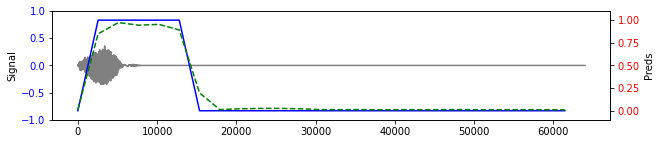


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0107, device='cuda:0')


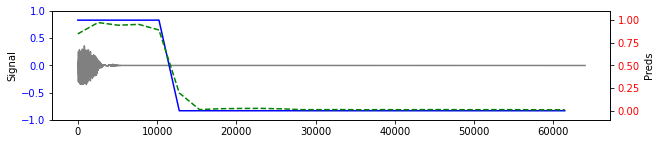


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0114, device='cuda:0')


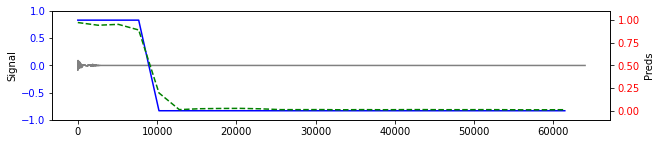


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0100, device='cuda:0')


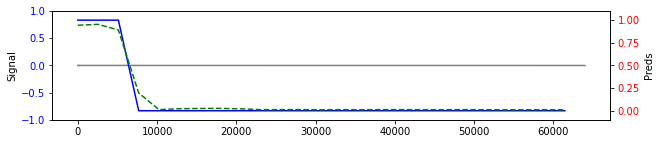


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0120, device='cuda:0')


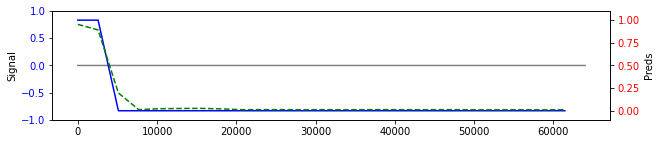


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0129, device='cuda:0')
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered

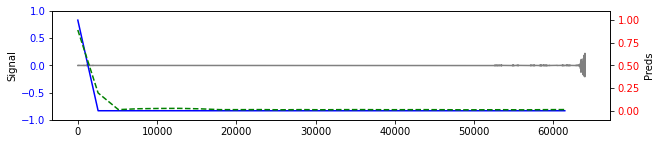


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.6663, device='cuda:0')


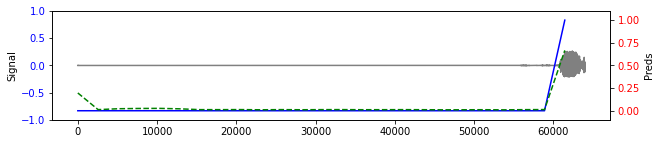


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.6837, device='cuda:0')


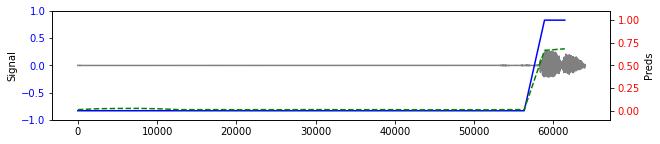


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.7366, device='cuda:0')


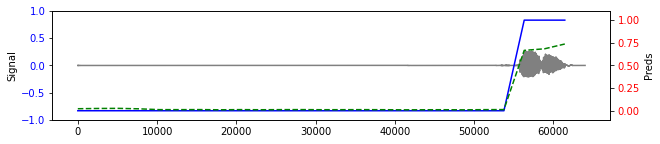


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.3806, device='cuda:0')


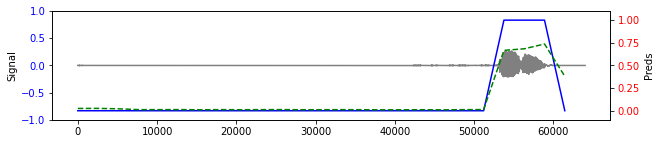


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.2212, device='cuda:0')


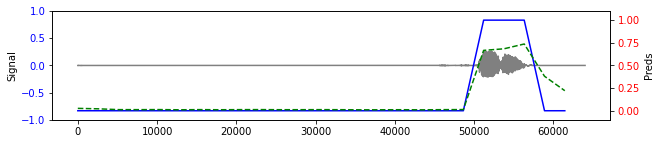


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1045, device='cuda:0')


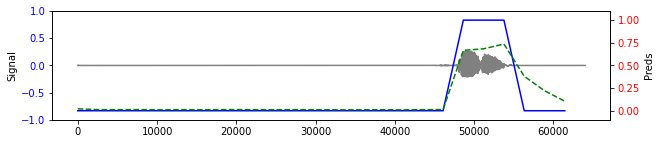


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0114, device='cuda:0')


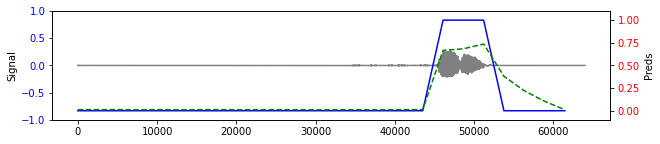


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0137, device='cuda:0')


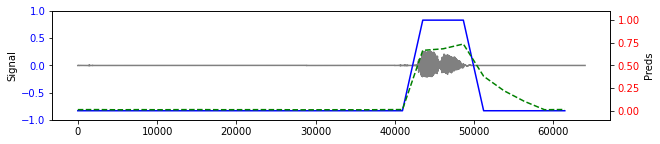


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0125, device='cuda:0')


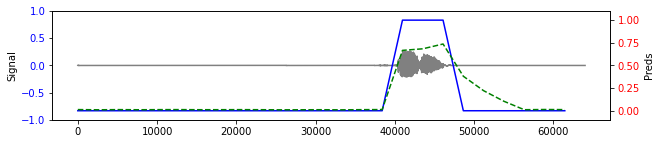


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0124, device='cuda:0')


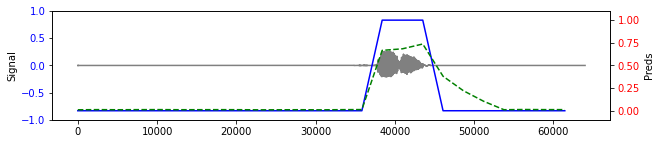


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0117, device='cuda:0')


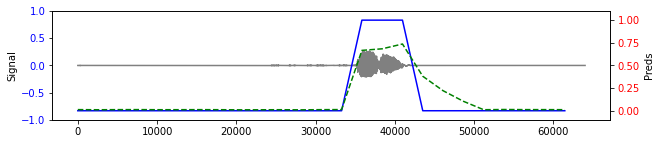


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0130, device='cuda:0')


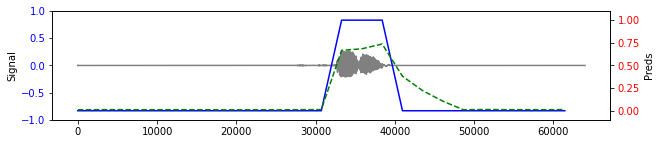


Greedy labels collected from this buffer
['_', '▁mhm']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0150, device='cuda:0')


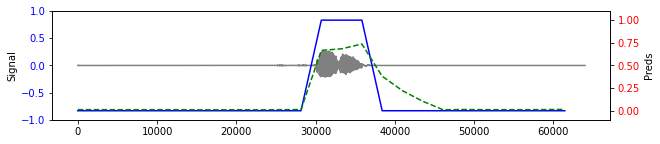


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0361, device='cuda:0')


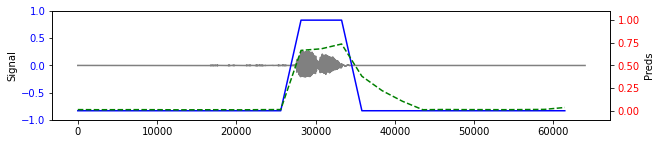


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0571, device='cuda:0')


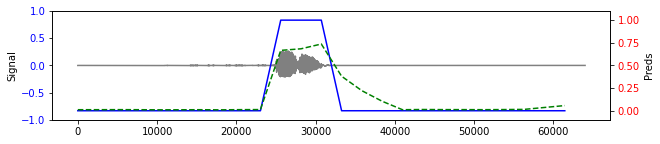


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0523, device='cuda:0')


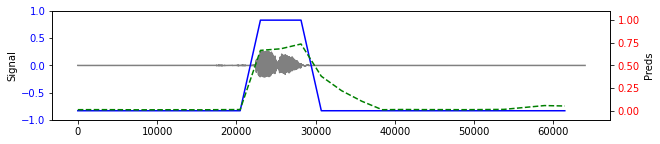


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0736, device='cuda:0')


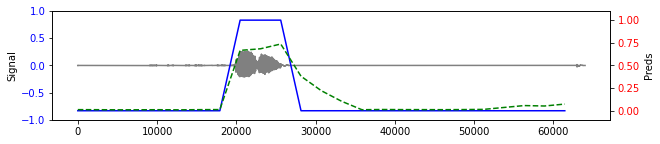


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0435, device='cuda:0')


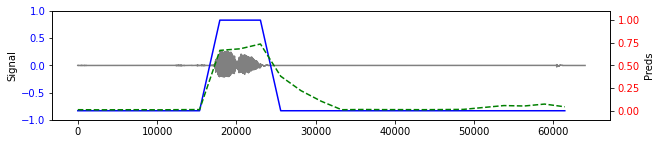


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0136, device='cuda:0')


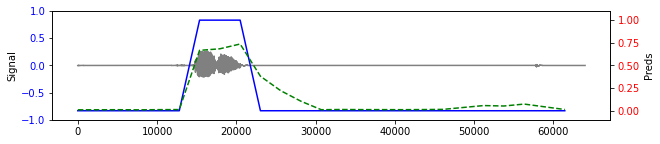


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0101, device='cuda:0')


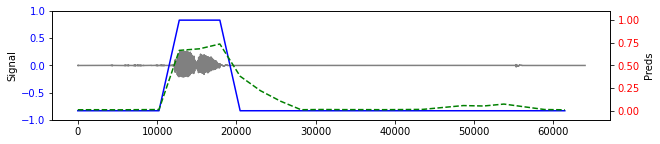


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0116, device='cuda:0')


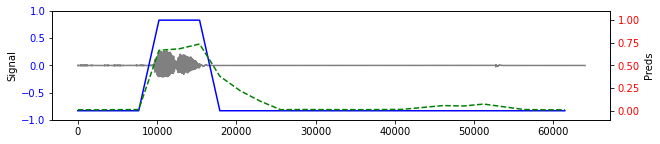


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0113, device='cuda:0')


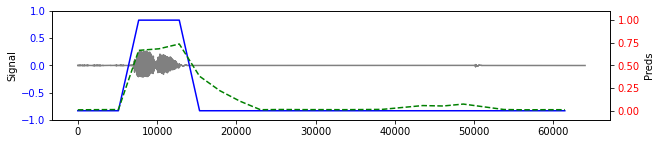


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0189, device='cuda:0')


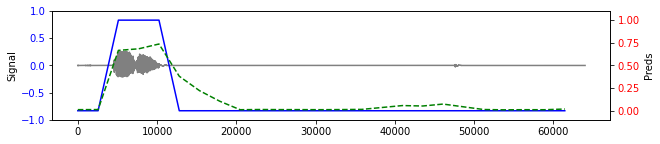


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0115, device='cuda:0')


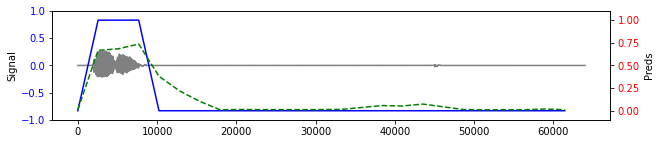


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0106, device='cuda:0')


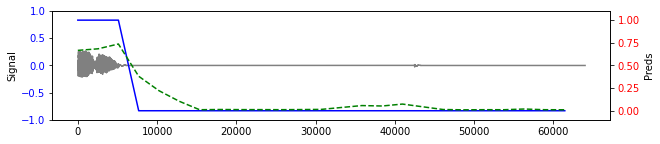


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0120, device='cuda:0')


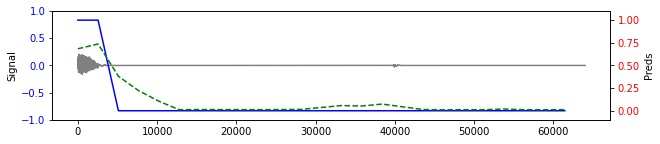


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0117, device='cuda:0')
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered

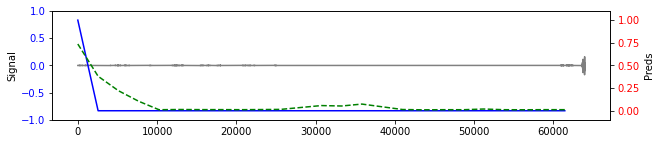


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.7164, device='cuda:0')


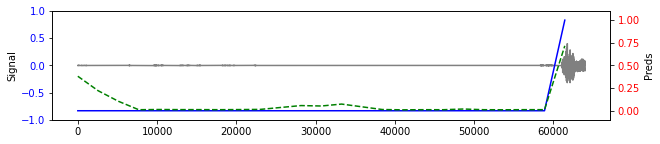


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9067, device='cuda:0')


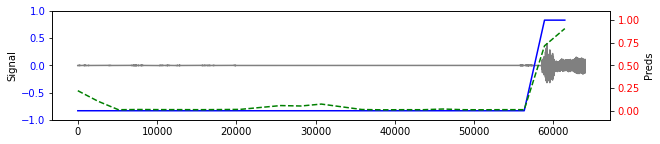


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9500, device='cuda:0')


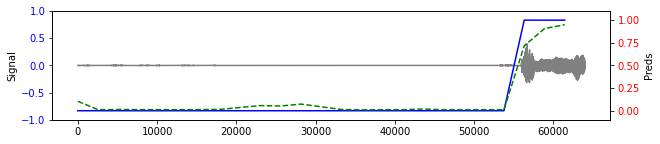


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9454, device='cuda:0')


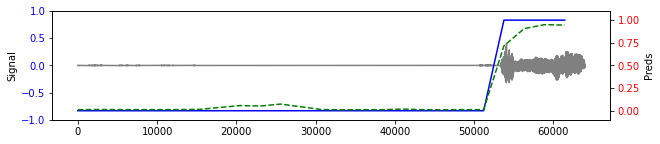


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.8855, device='cuda:0')

Tokens collected from succesive buffers before CTC merge
['_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '▁mhm', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '▁right', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_

In [23]:
stride = 8 # 8 for Citrinet | 4 for stt_en_conformer_ctc_large
# vad_context_window_len_in_secs=0.63 coarse grained
asr_decoder = ChunkBufferDecoder(model, vad_model, stride=stride, chunk_len_in_secs=chunk_len_in_secs, buffer_len_in_secs=buffer_len_in_secs)
transcription = asr_decoder.transcribe_buffers(buffer_list, vad_gate=True, plot=True, threshold=0.4)

length of decoded frame 138
Note the plot is based on collected all_toks


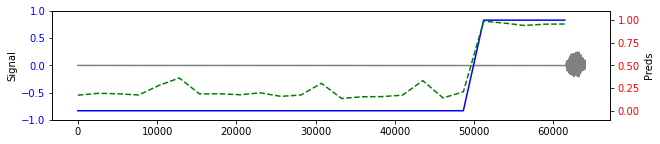


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9079, device='cuda:0')


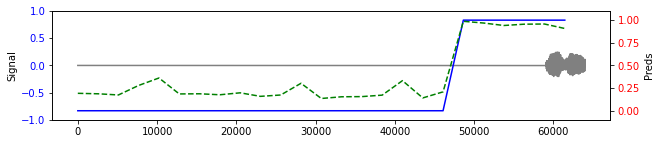


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9234, device='cuda:0')


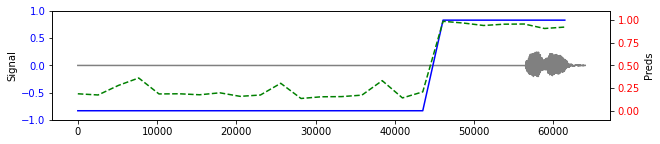


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9850, device='cuda:0')


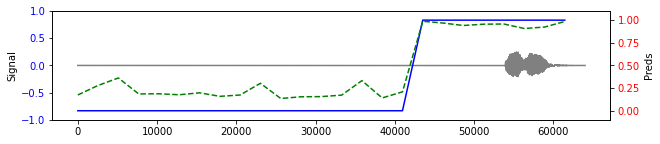


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9221, device='cuda:0')


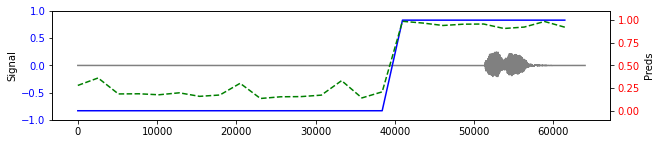


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1772, device='cuda:0')


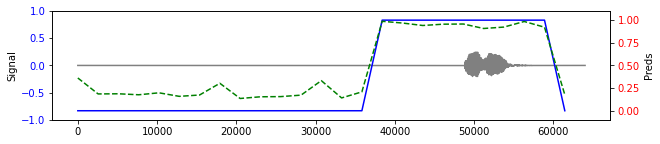


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1700, device='cuda:0')


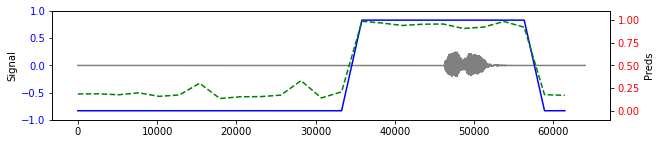


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1519, device='cuda:0')


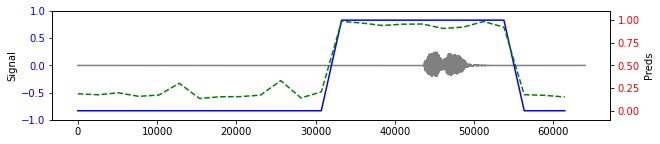


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1812, device='cuda:0')


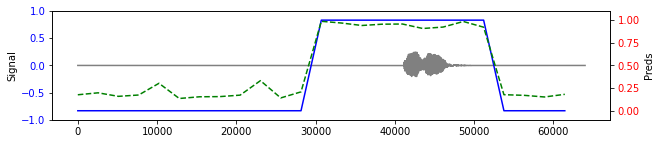


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1893, device='cuda:0')


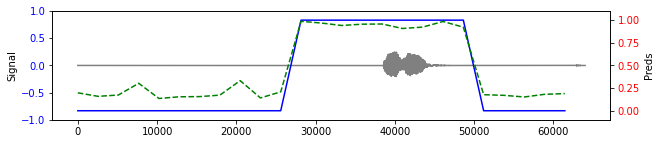


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1265, device='cuda:0')


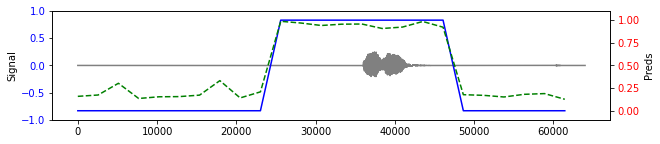


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1487, device='cuda:0')


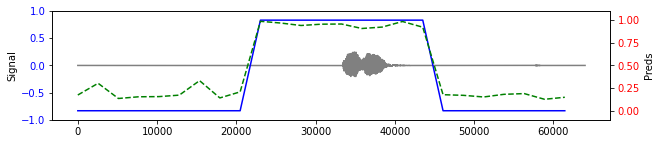


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1636, device='cuda:0')


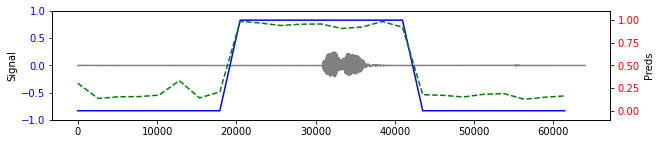


Greedy labels collected from this buffer
['▁mhm', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1557, device='cuda:0')


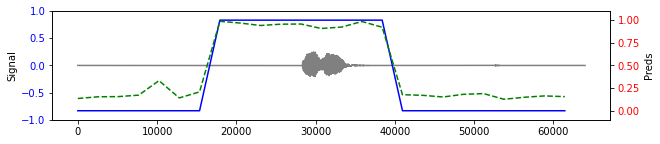


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1915, device='cuda:0')


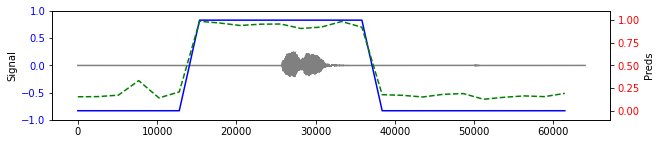


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1339, device='cuda:0')


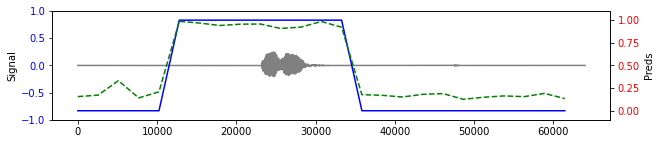


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1722, device='cuda:0')


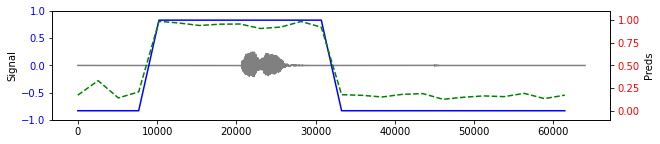


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1751, device='cuda:0')


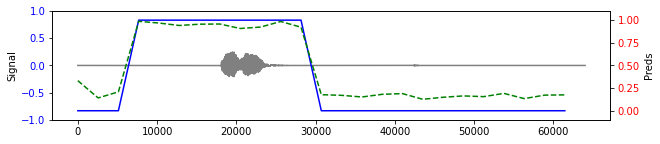


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1608, device='cuda:0')


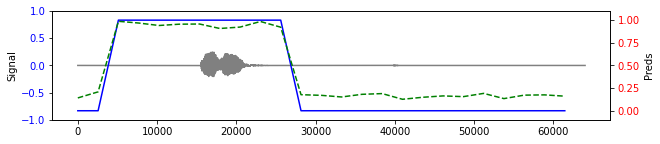


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1465, device='cuda:0')


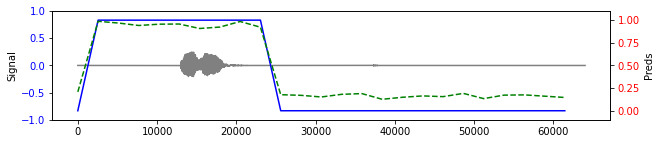


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.2018, device='cuda:0')


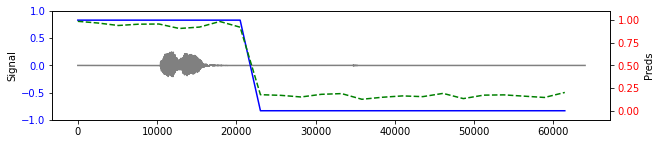


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1613, device='cuda:0')


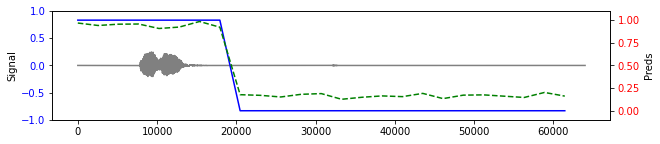


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1637, device='cuda:0')


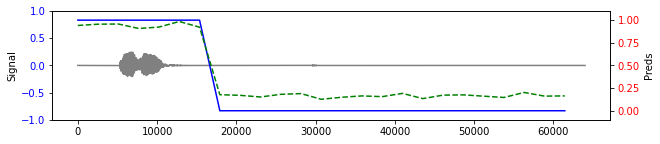


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1526, device='cuda:0')


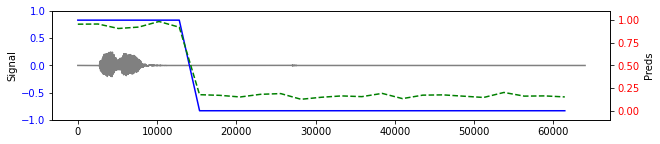


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1698, device='cuda:0')


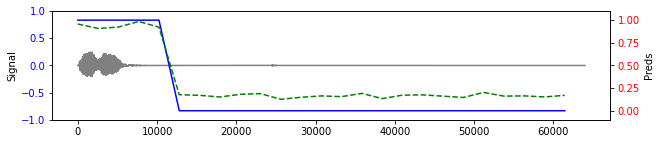


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1795, device='cuda:0')


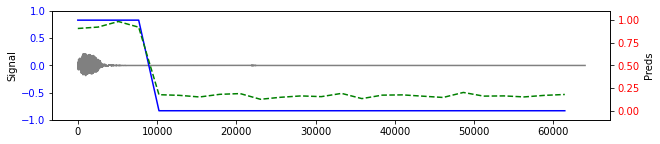


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1546, device='cuda:0')


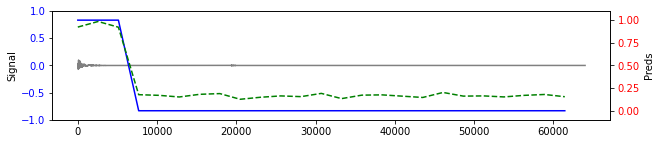


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1584, device='cuda:0')


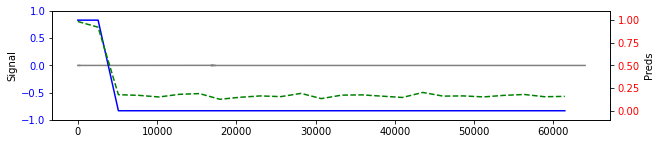


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1607, device='cuda:0')
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered

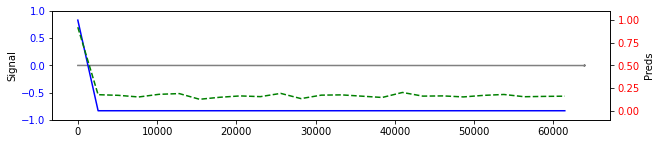


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.5861, device='cuda:0')


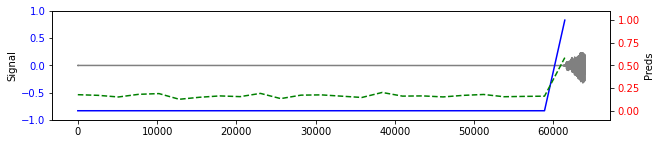


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9764, device='cuda:0')


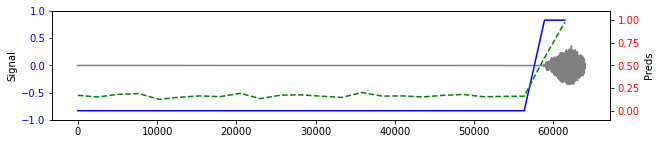


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9563, device='cuda:0')


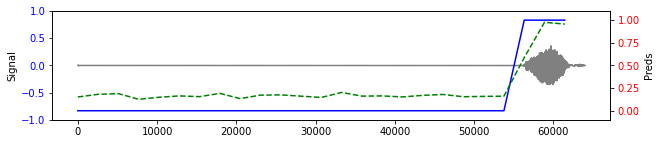


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9499, device='cuda:0')


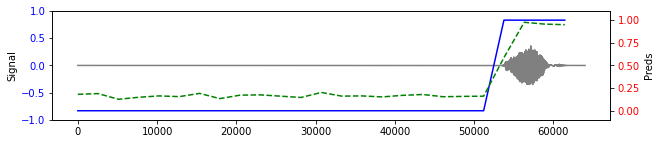


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.7815, device='cuda:0')


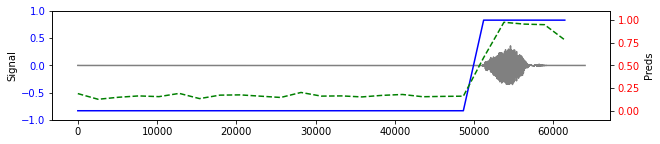


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1713, device='cuda:0')


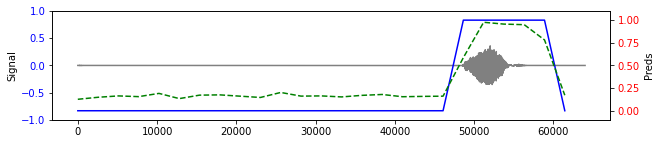


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1877, device='cuda:0')


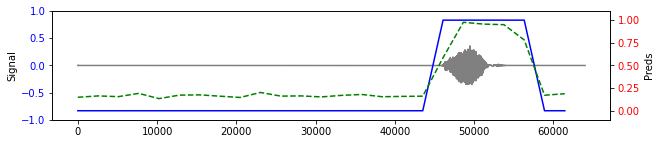


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1566, device='cuda:0')


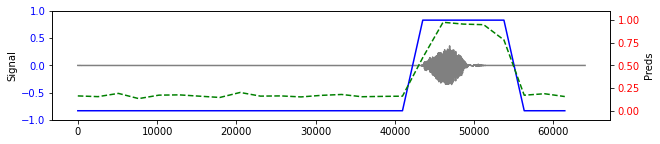


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1483, device='cuda:0')


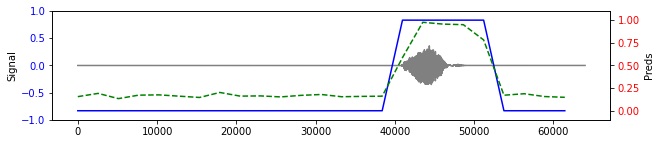


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.2277, device='cuda:0')


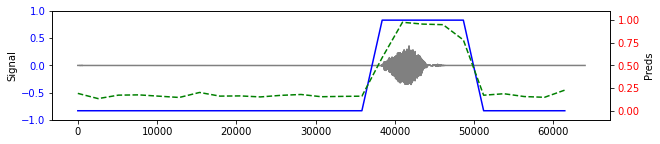


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1534, device='cuda:0')


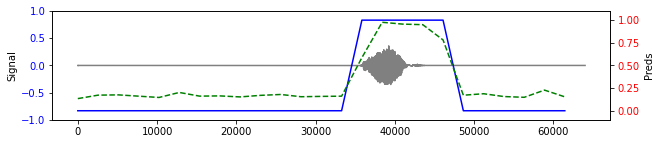


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1421, device='cuda:0')


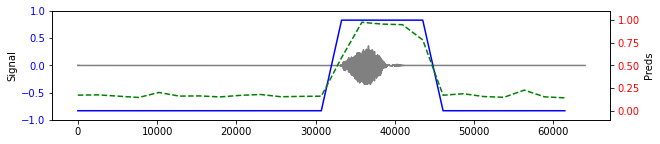


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1638, device='cuda:0')


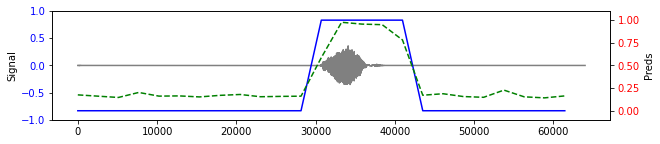


Greedy labels collected from this buffer
['▁right', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1417, device='cuda:0')


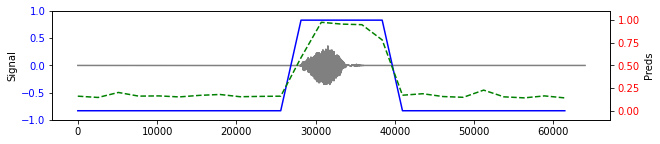


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1770, device='cuda:0')


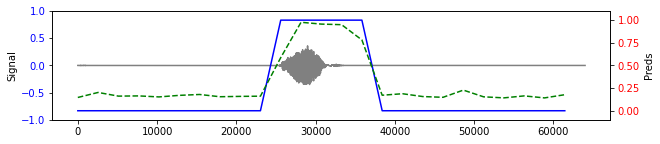


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1564, device='cuda:0')


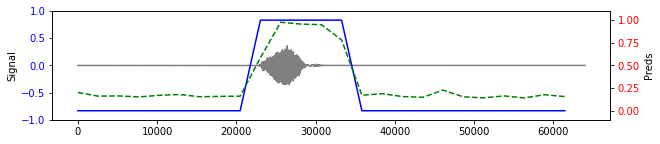


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1833, device='cuda:0')


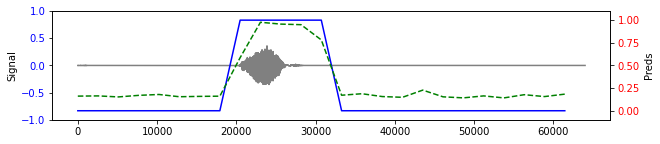


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1922, device='cuda:0')


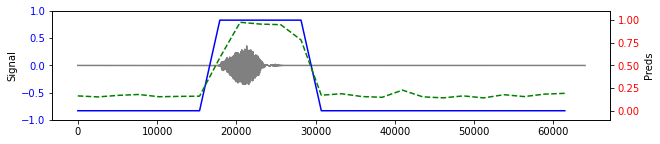


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1622, device='cuda:0')


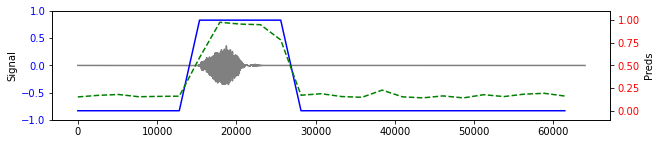


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1541, device='cuda:0')


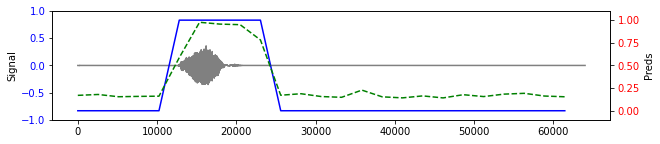


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1582, device='cuda:0')


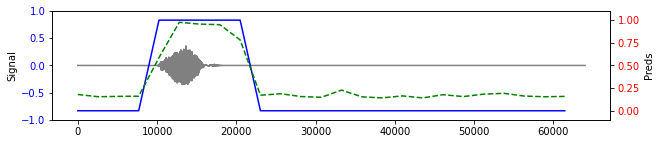


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1779, device='cuda:0')


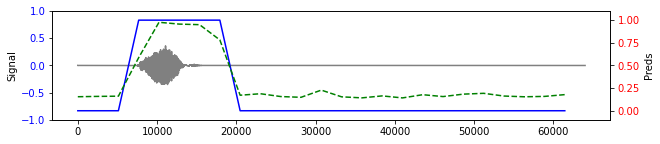


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1779, device='cuda:0')


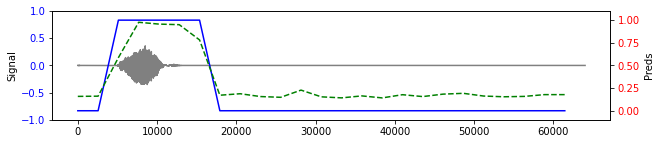


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1469, device='cuda:0')


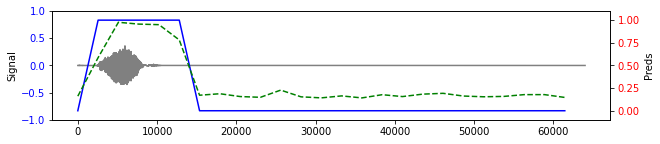


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1605, device='cuda:0')


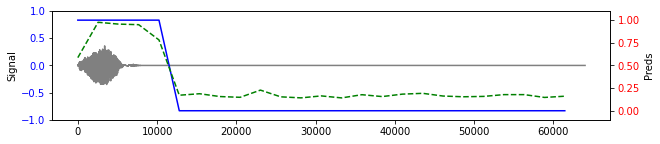


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1469, device='cuda:0')


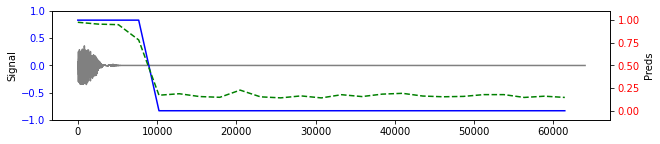


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1628, device='cuda:0')


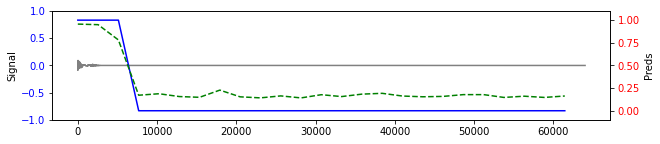


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1833, device='cuda:0')


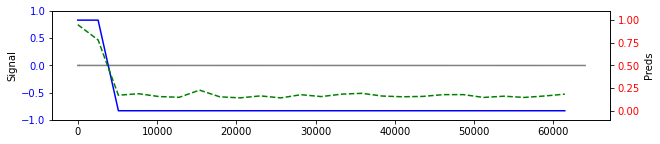


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1711, device='cuda:0')
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======


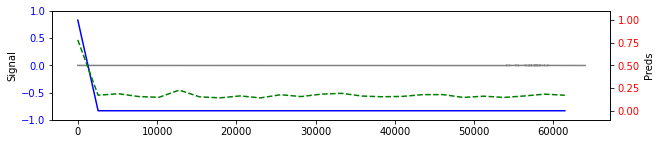


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.5883, device='cuda:0')


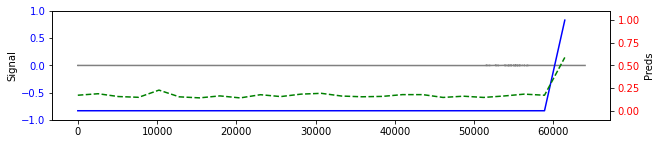


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1759, device='cuda:0')


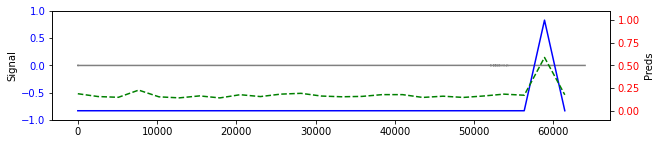


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1588, device='cuda:0')


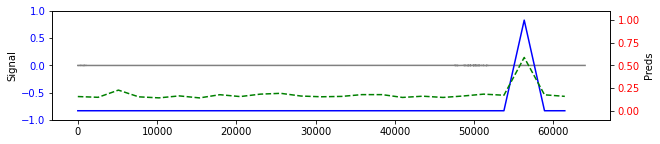


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1692, device='cuda:0')


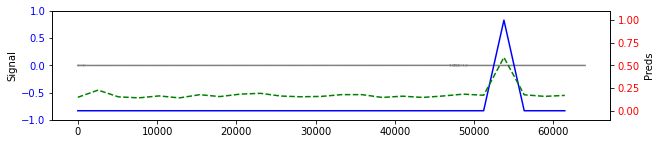


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.3573, device='cuda:0')


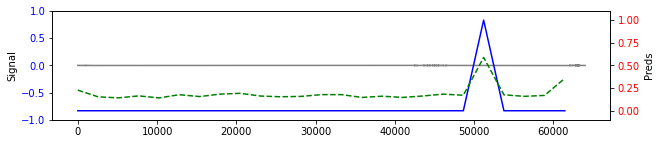


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1242, device='cuda:0')


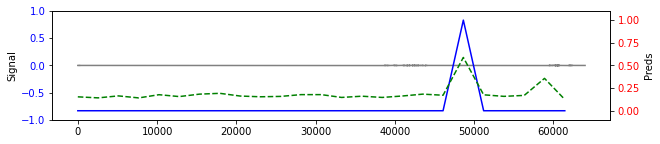


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1699, device='cuda:0')


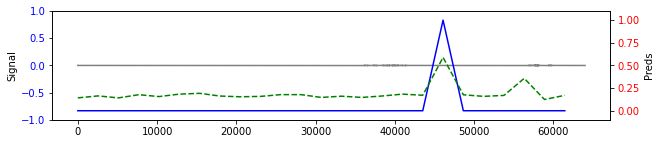


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.2261, device='cuda:0')


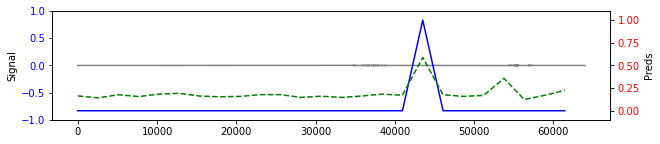


Greedy labels collected from this buffer
['_', '▁umhu']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1673, device='cuda:0')


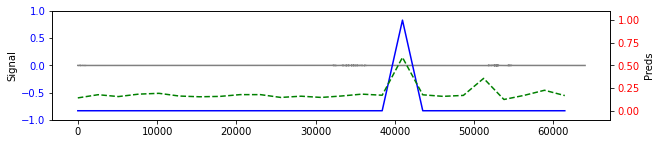


Greedy labels collected from this buffer
['_', 'm']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1655, device='cuda:0')


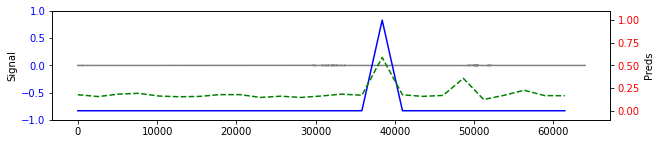


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1498, device='cuda:0')


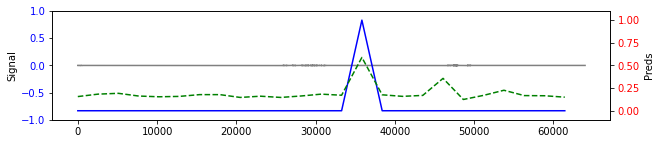


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1757, device='cuda:0')


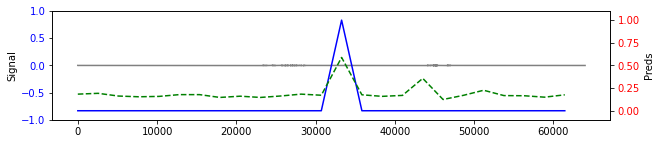


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1489, device='cuda:0')


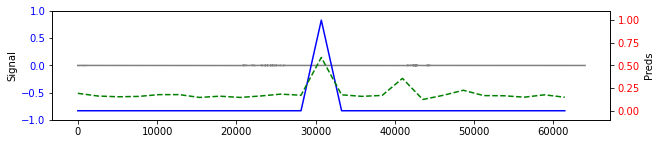


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1748, device='cuda:0')


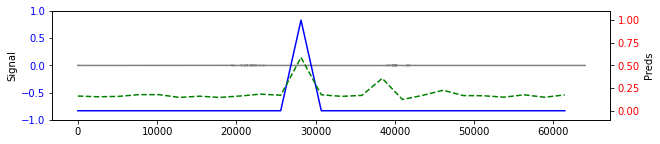


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1601, device='cuda:0')


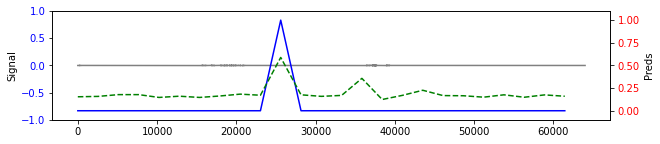


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1743, device='cuda:0')


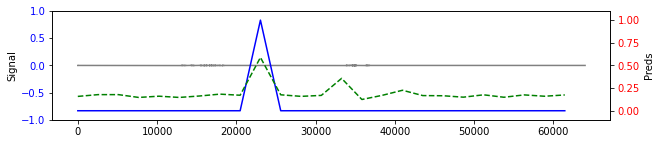


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1522, device='cuda:0')


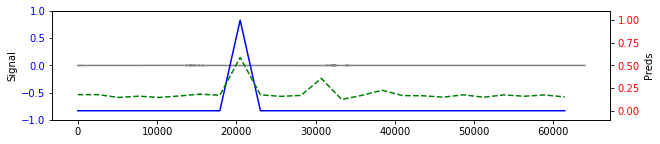


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1500, device='cuda:0')


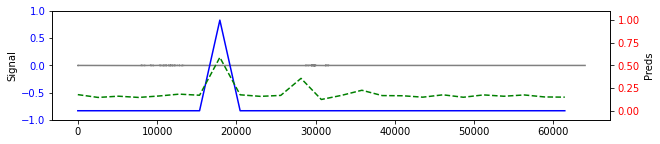


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1882, device='cuda:0')


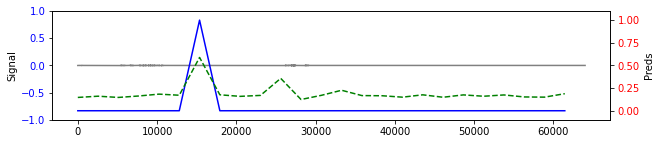


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1522, device='cuda:0')


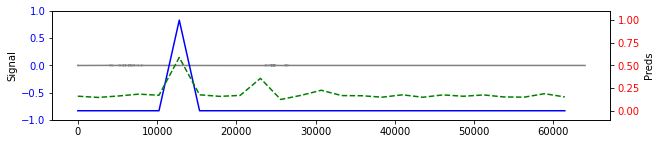


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1546, device='cuda:0')


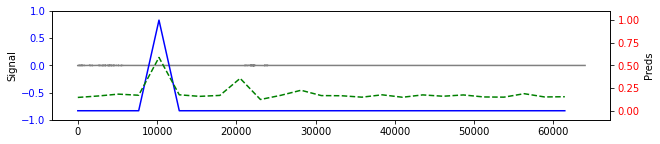


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1531, device='cuda:0')


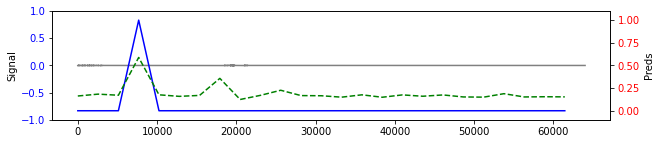


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1918, device='cuda:0')


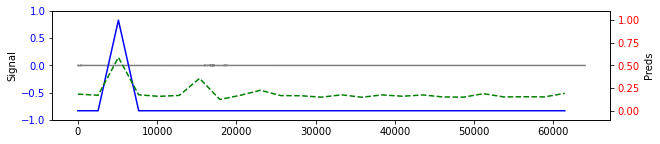


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1500, device='cuda:0')


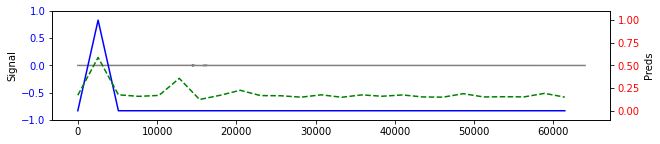


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1214, device='cuda:0')
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======


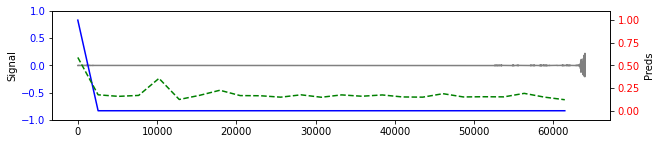


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9720, device='cuda:0')


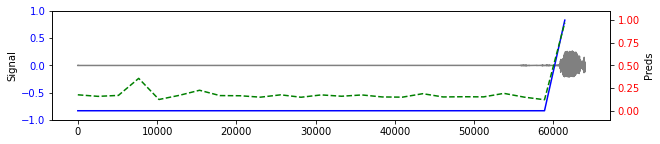


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.8915, device='cuda:0')


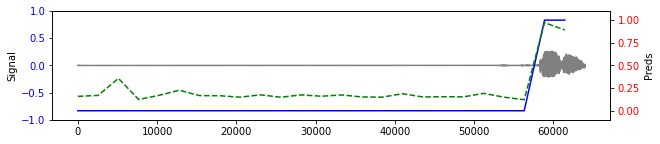


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9030, device='cuda:0')


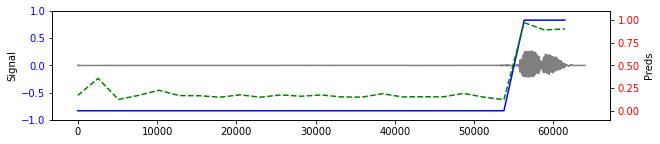


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.7689, device='cuda:0')


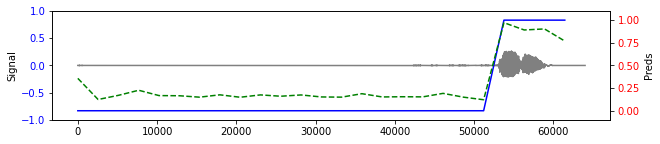


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1939, device='cuda:0')


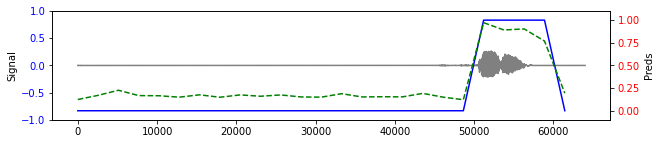


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1647, device='cuda:0')


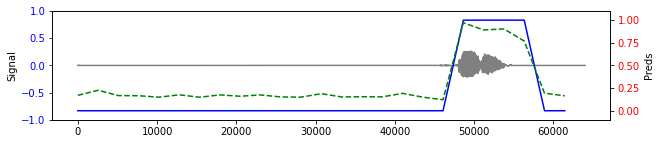


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1439, device='cuda:0')


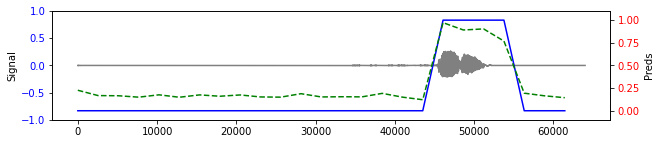


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1609, device='cuda:0')


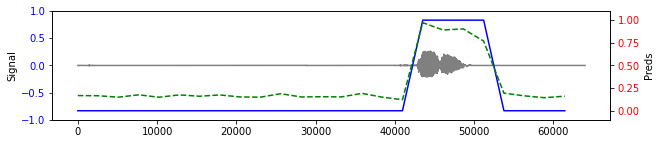


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1559, device='cuda:0')


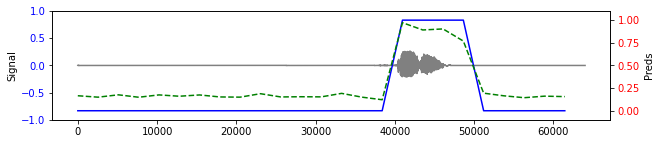


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1984, device='cuda:0')


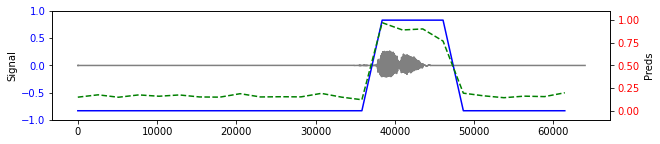


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1504, device='cuda:0')


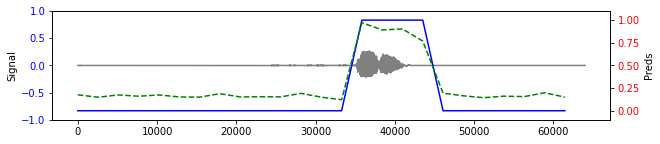


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1779, device='cuda:0')


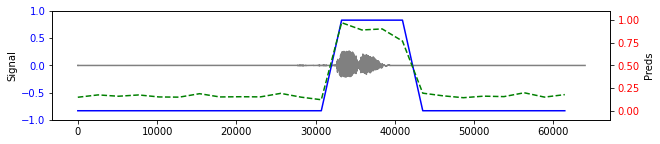


Greedy labels collected from this buffer
['_', '▁mhm']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1177, device='cuda:0')


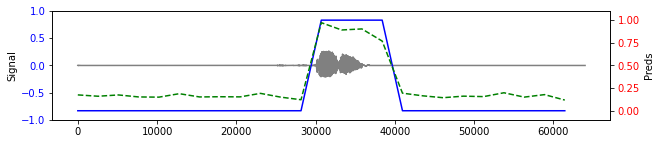


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1561, device='cuda:0')


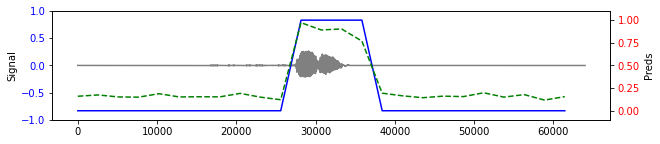


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.3234, device='cuda:0')


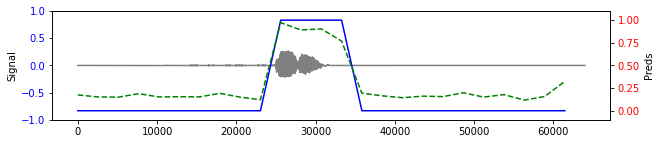


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1438, device='cuda:0')


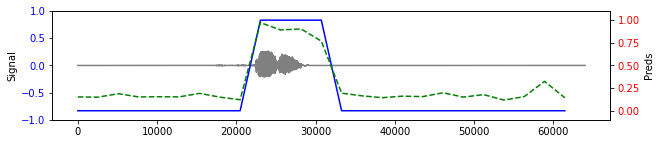


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.2456, device='cuda:0')


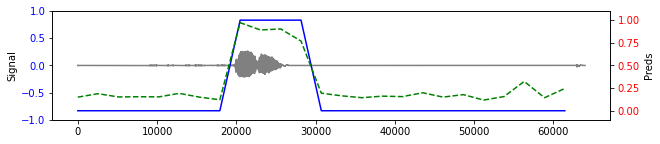


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.3004, device='cuda:0')


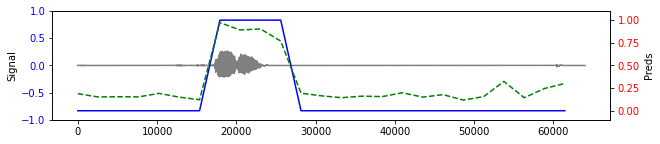


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1692, device='cuda:0')


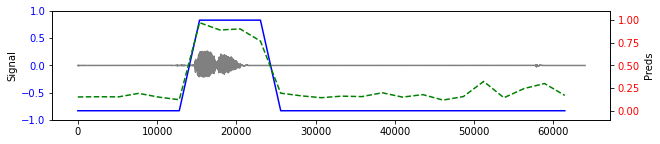


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1644, device='cuda:0')


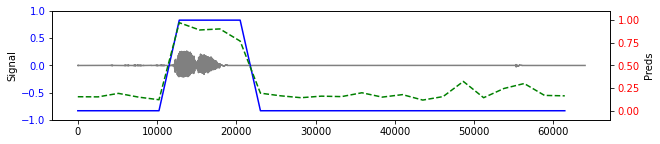


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1833, device='cuda:0')


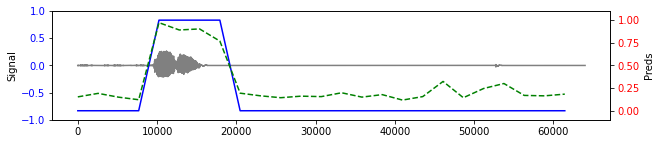


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1637, device='cuda:0')


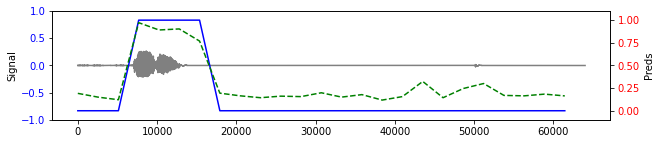


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.3084, device='cuda:0')


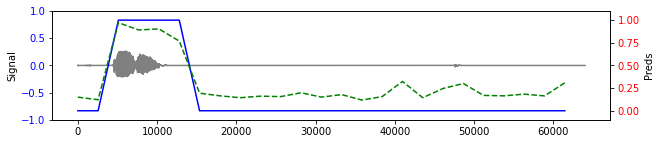


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1166, device='cuda:0')


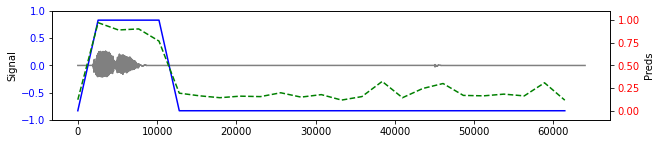


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1723, device='cuda:0')


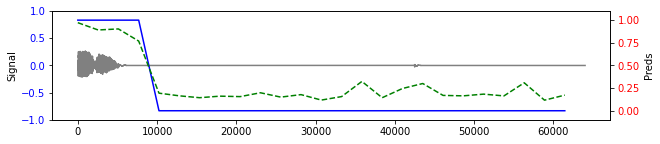


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1624, device='cuda:0')


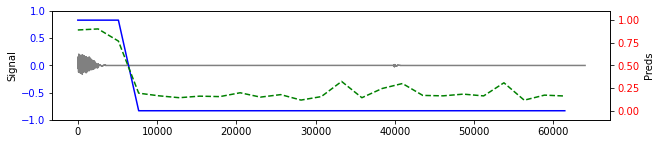


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1542, device='cuda:0')


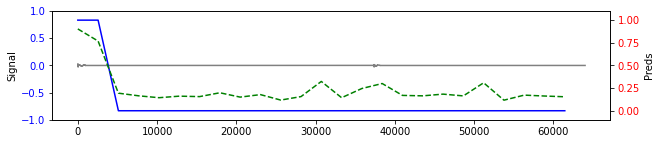


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1492, device='cuda:0')
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======


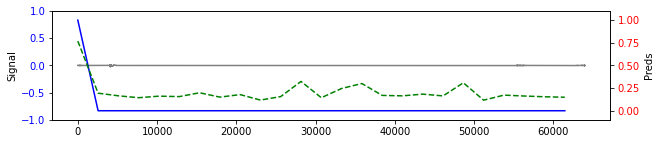


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.4387, device='cuda:0')


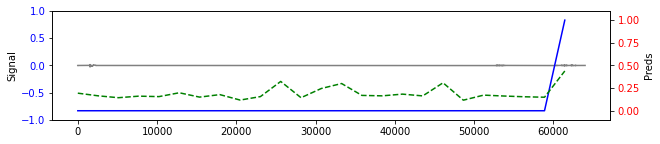


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1821, device='cuda:0')


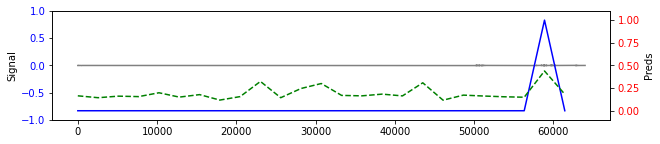


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1671, device='cuda:0')


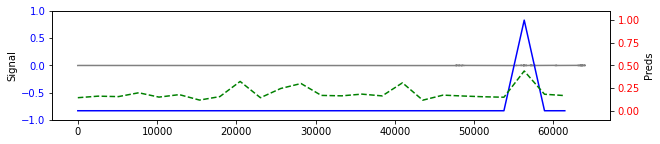


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1714, device='cuda:0')


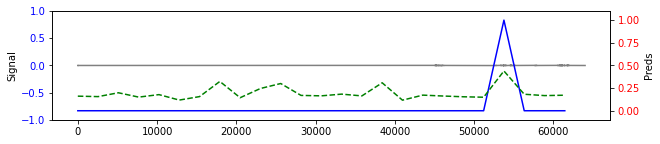


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1923, device='cuda:0')


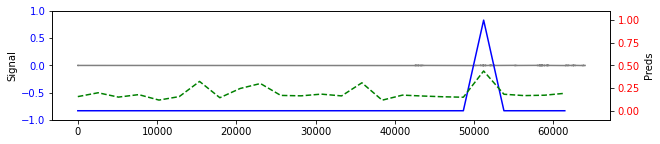


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1871, device='cuda:0')


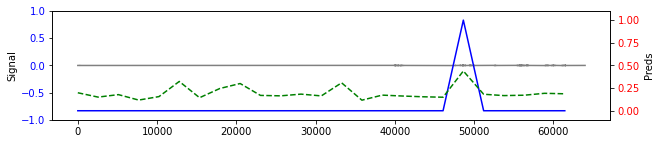


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1741, device='cuda:0')


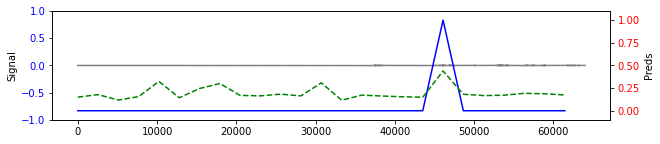


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.2794, device='cuda:0')


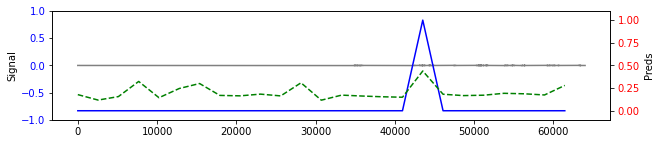


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.3616, device='cuda:0')


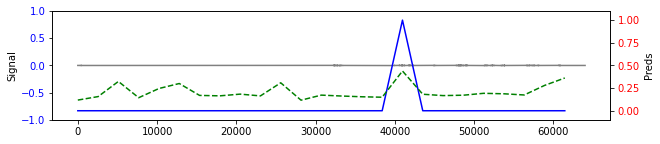


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1855, device='cuda:0')


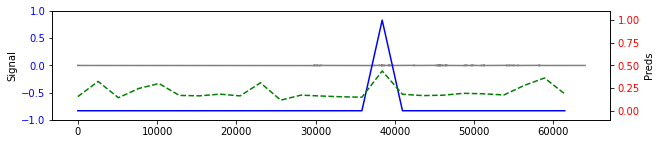


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1872, device='cuda:0')


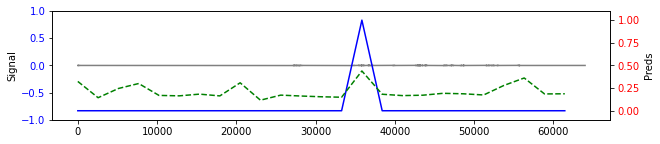


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1763, device='cuda:0')


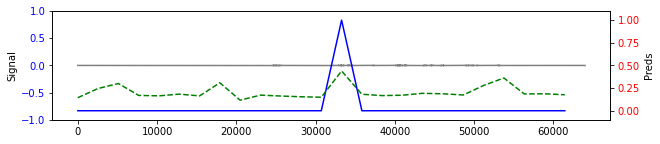


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1978, device='cuda:0')


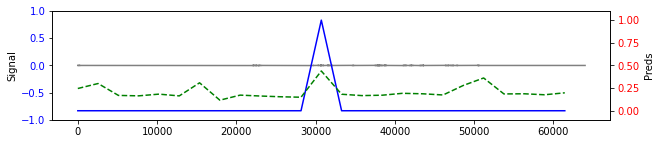


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1588, device='cuda:0')


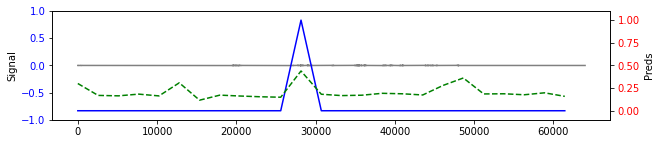


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1737, device='cuda:0')


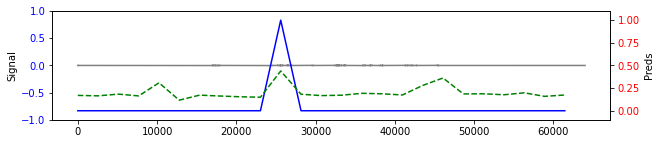


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.3030, device='cuda:0')


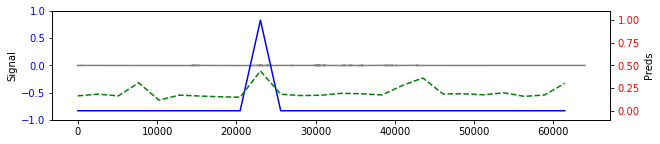


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1353, device='cuda:0')


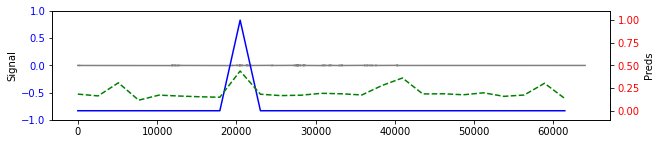


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1541, device='cuda:0')


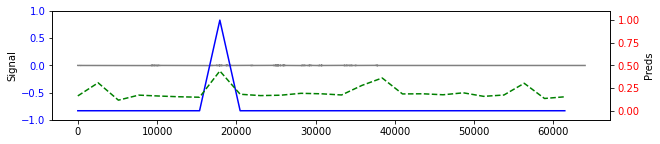


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1560, device='cuda:0')


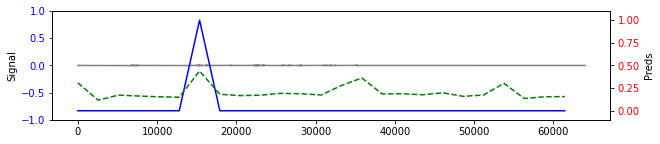


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1722, device='cuda:0')


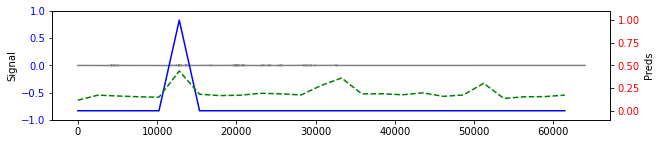


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.3322, device='cuda:0')


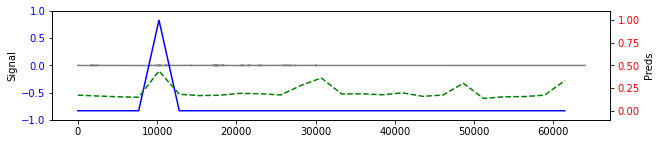


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1414, device='cuda:0')


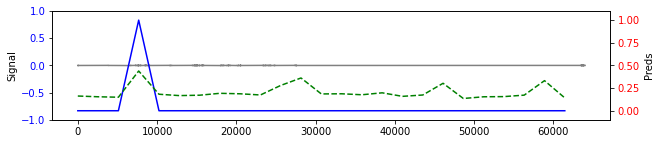


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.2083, device='cuda:0')


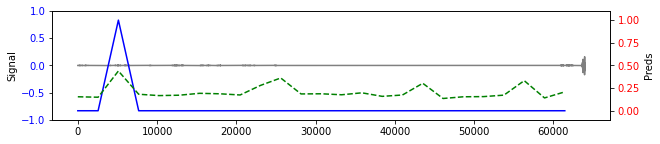


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9871, device='cuda:0')


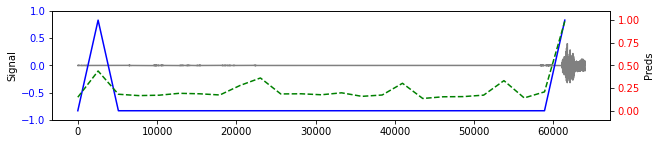


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9680, device='cuda:0')


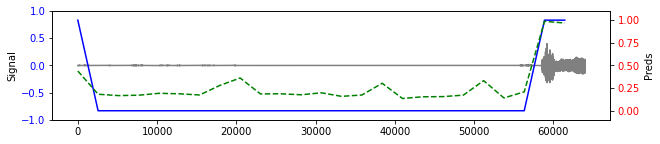


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9410, device='cuda:0')


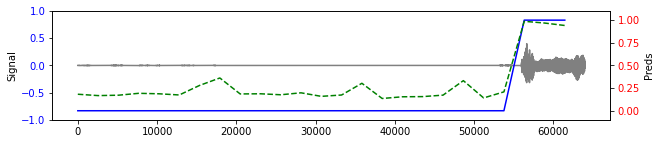


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9553, device='cuda:0')


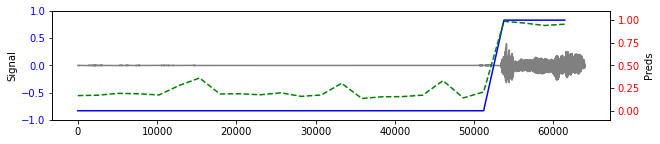


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9572, device='cuda:0')

Tokens collected from succesive buffers before CTC merge
['_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '▁mhm', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '▁right', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '▁umhu', '_', 'm', '_'

In [24]:
stride = 8 # 8 for Citrinet | 4 for stt_en_conformer_ctc_large
asr_decoder = ChunkBufferDecoder(model, vad_model, stride=stride, chunk_len_in_secs=chunk_len_in_secs, buffer_len_in_secs=buffer_len_in_secs,
                                vad_context_window_len_in_secs=0.31)
transcription = asr_decoder.transcribe_buffers(buffer_list, vad_gate=True, plot=True, threshold=0.4)

length of decoded frame 86
Note the plot is based on collected all_toks


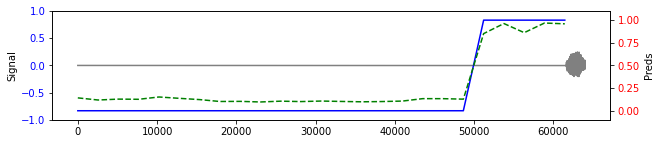


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9242, device='cuda:0')


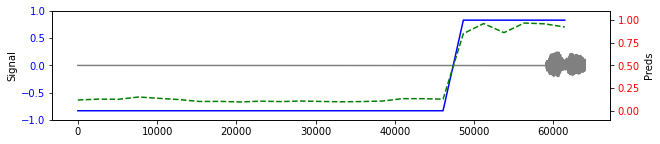


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9268, device='cuda:0')


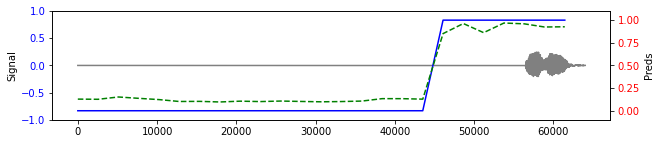


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.7321, device='cuda:0')


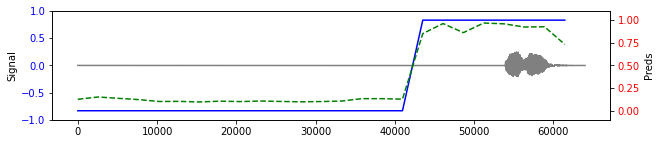


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1020, device='cuda:0')


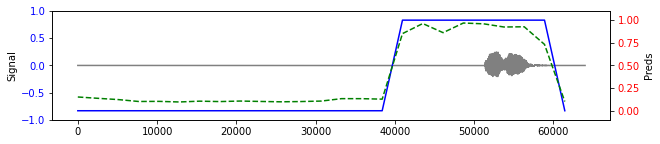


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1025, device='cuda:0')


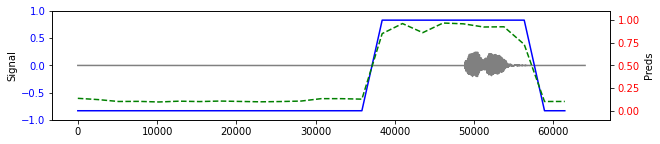


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0999, device='cuda:0')


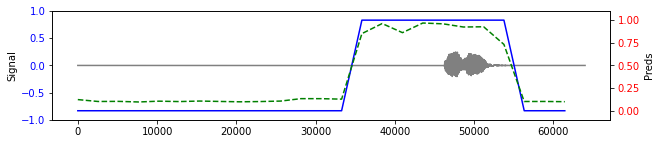


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0999, device='cuda:0')


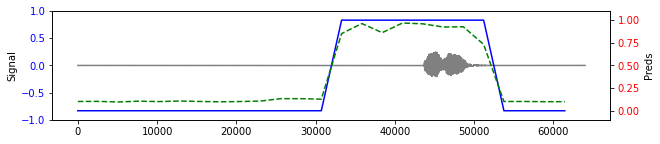


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1039, device='cuda:0')


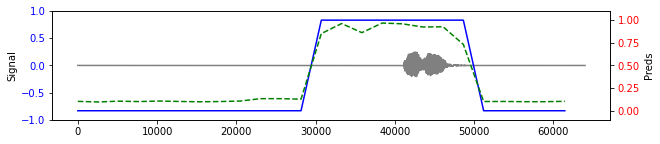


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0935, device='cuda:0')


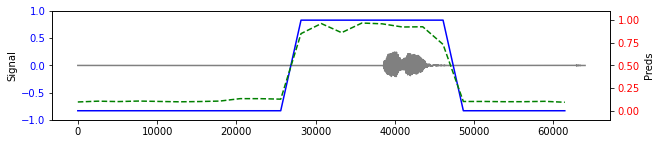


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1204, device='cuda:0')


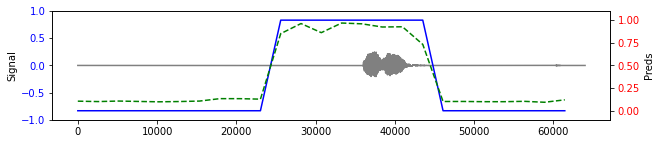


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0975, device='cuda:0')


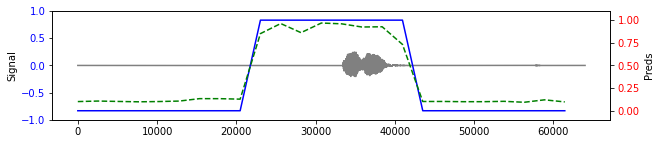


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0998, device='cuda:0')


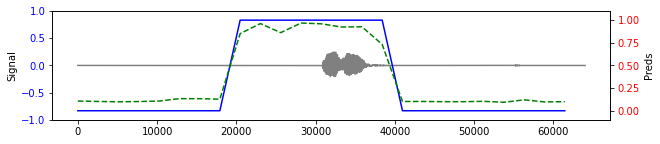


Greedy labels collected from this buffer
['▁mhm', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1004, device='cuda:0')


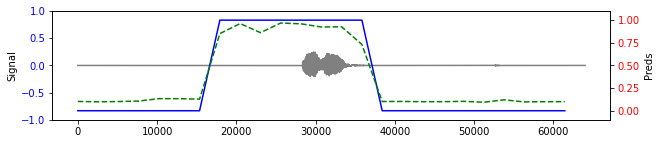


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0908, device='cuda:0')


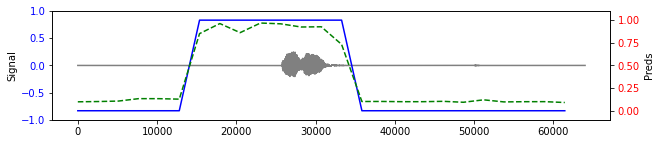


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1065, device='cuda:0')


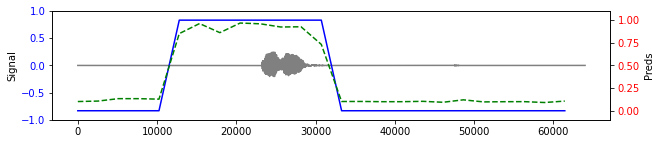


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0958, device='cuda:0')


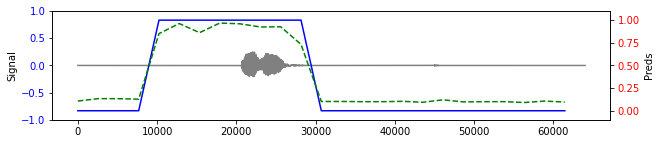


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1008, device='cuda:0')


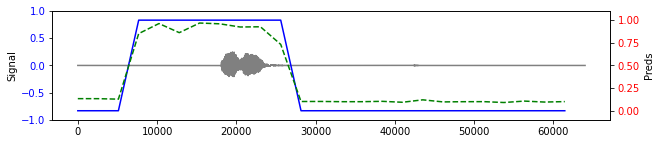


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1050, device='cuda:0')


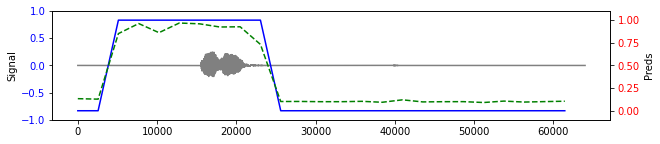


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1044, device='cuda:0')


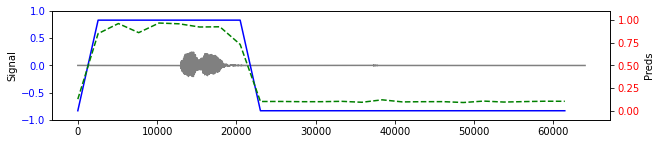


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1023, device='cuda:0')


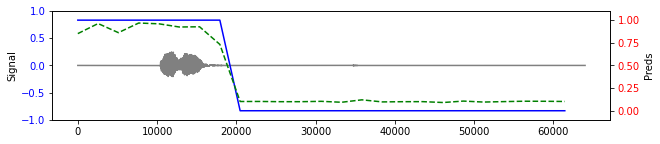


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0952, device='cuda:0')


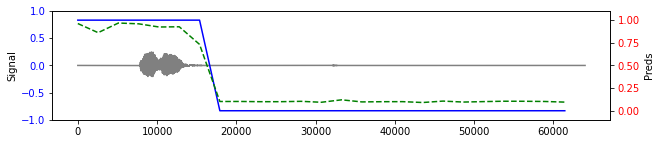


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0966, device='cuda:0')


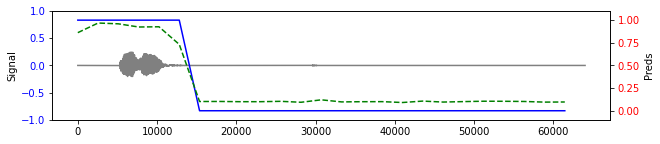


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0957, device='cuda:0')


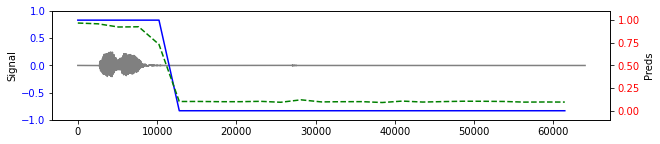


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1004, device='cuda:0')


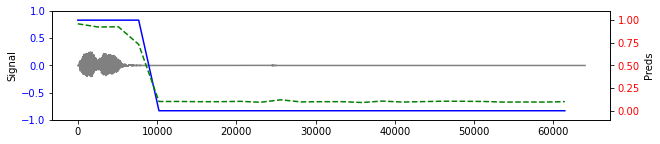


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0978, device='cuda:0')


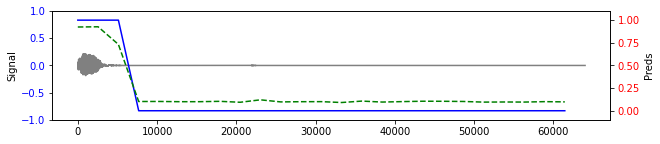


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0967, device='cuda:0')


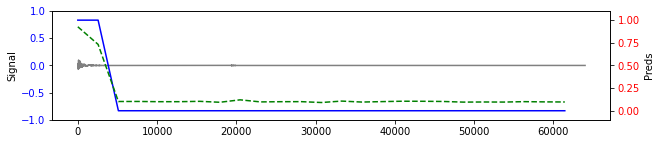


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1010, device='cuda:0')
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered

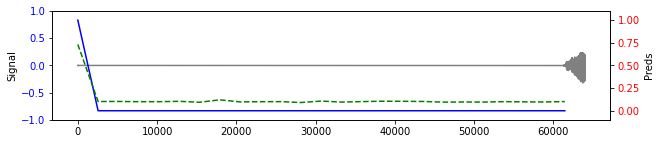


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9656, device='cuda:0')


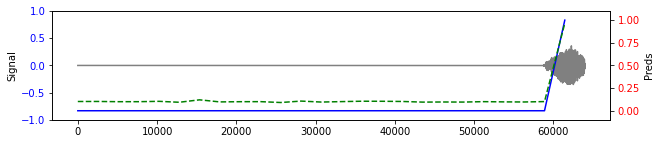


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9365, device='cuda:0')


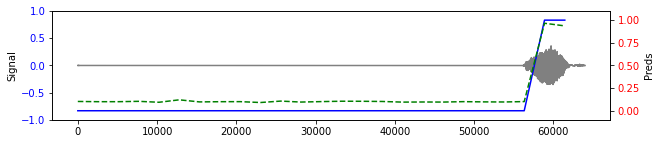


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.4777, device='cuda:0')


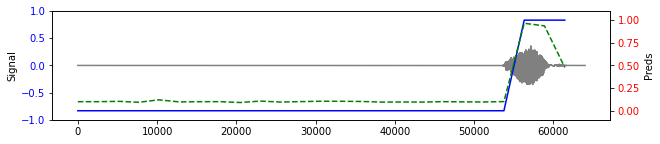


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1027, device='cuda:0')


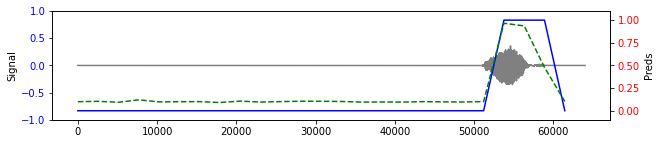


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1029, device='cuda:0')


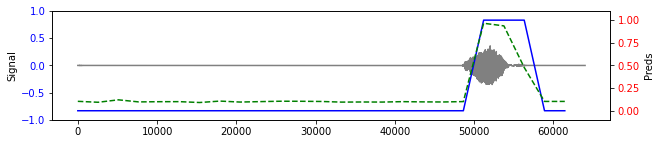


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0986, device='cuda:0')


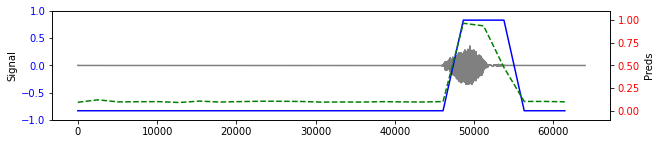


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1074, device='cuda:0')


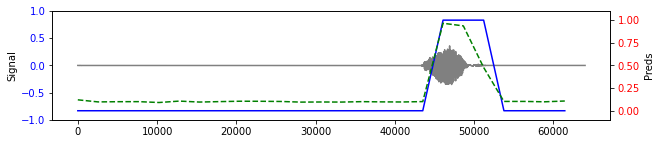


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1260, device='cuda:0')


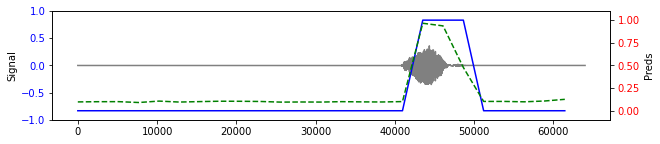


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0971, device='cuda:0')


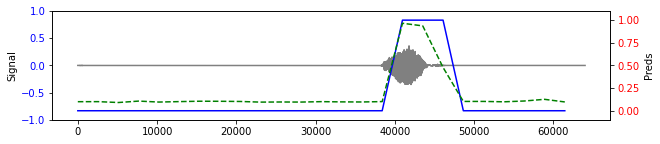


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0969, device='cuda:0')


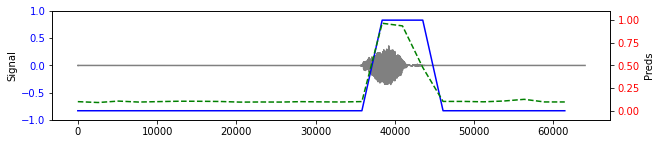


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1028, device='cuda:0')


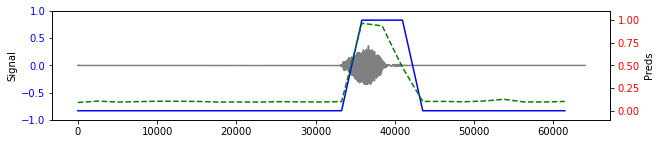


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0922, device='cuda:0')


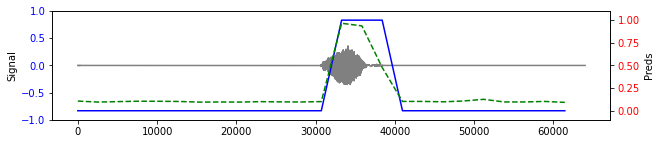


Greedy labels collected from this buffer
['▁right', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0974, device='cuda:0')


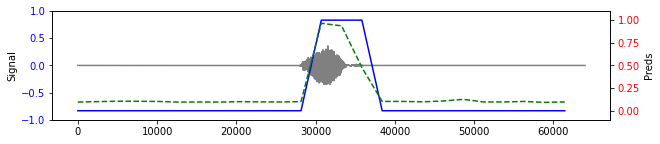


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0924, device='cuda:0')


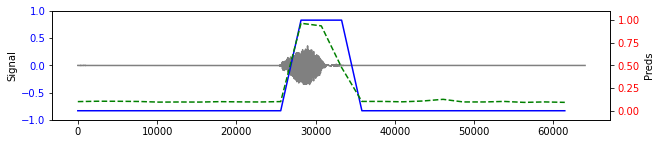


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1000, device='cuda:0')


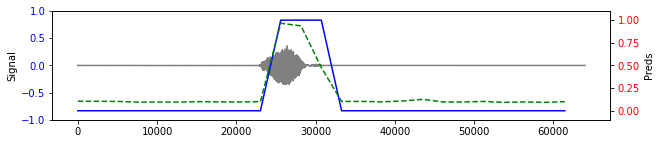


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1049, device='cuda:0')


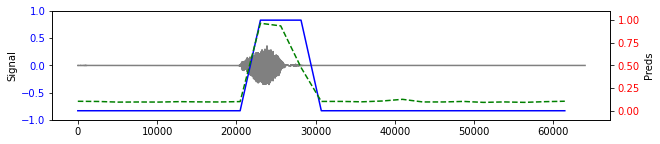


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0941, device='cuda:0')


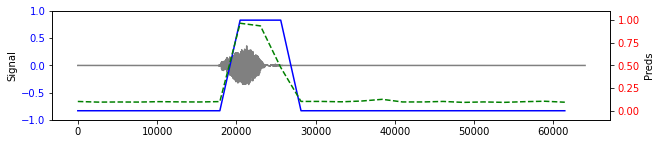


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0975, device='cuda:0')


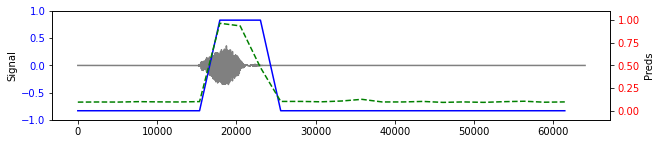


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0970, device='cuda:0')


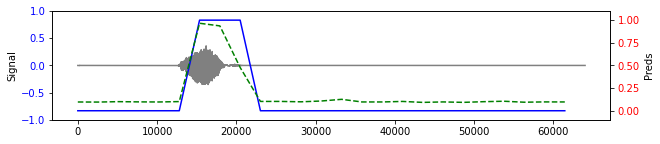


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1009, device='cuda:0')


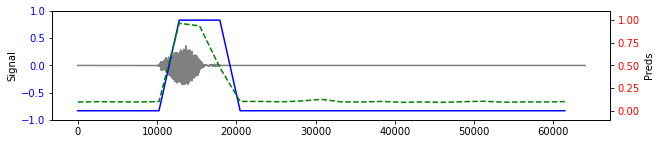


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0985, device='cuda:0')


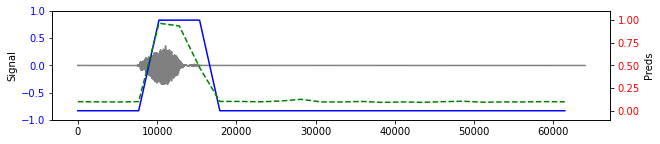


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0972, device='cuda:0')


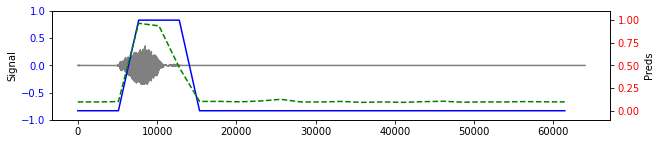


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1007, device='cuda:0')


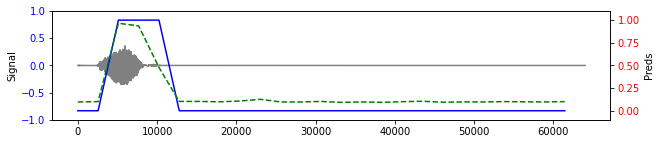


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0929, device='cuda:0')


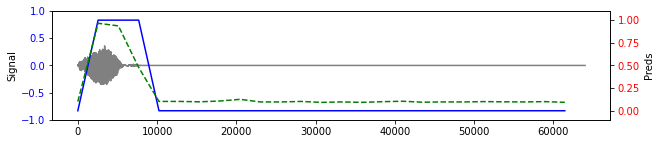


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1002, device='cuda:0')


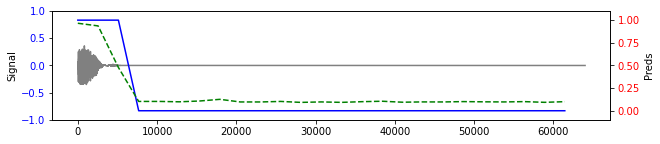


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0992, device='cuda:0')


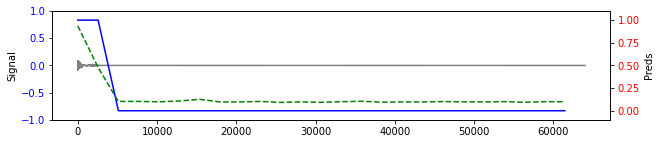


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0960, device='cuda:0')
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered

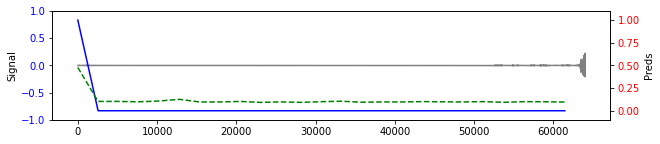


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.8853, device='cuda:0')


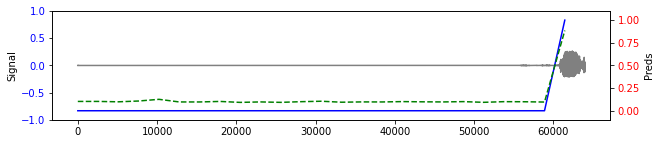


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9422, device='cuda:0')


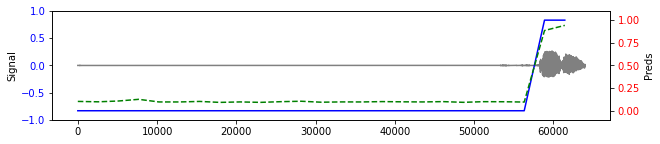


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9394, device='cuda:0')


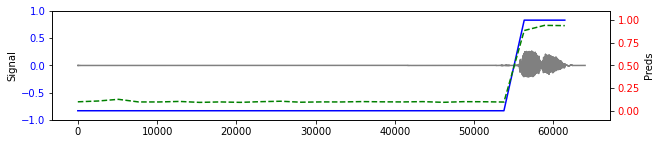


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1041, device='cuda:0')


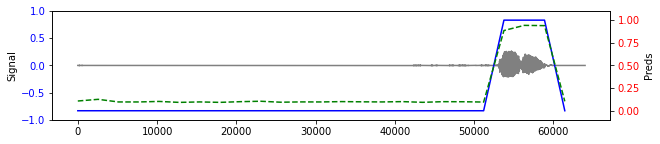


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0953, device='cuda:0')


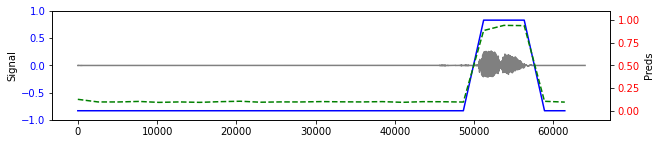


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0947, device='cuda:0')


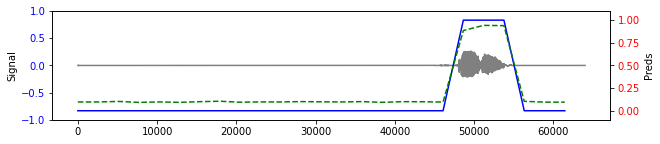


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0961, device='cuda:0')


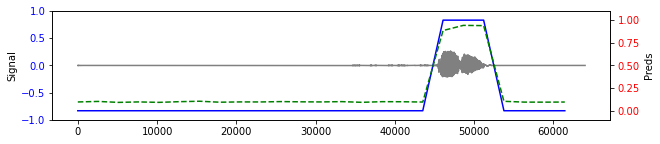


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1036, device='cuda:0')


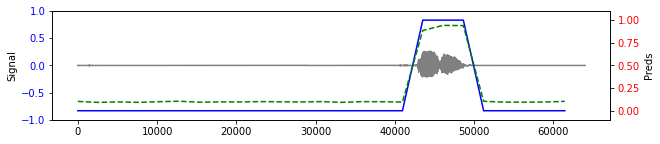


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1034, device='cuda:0')


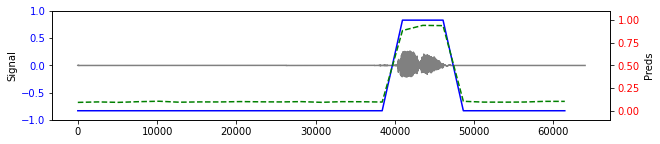


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0940, device='cuda:0')


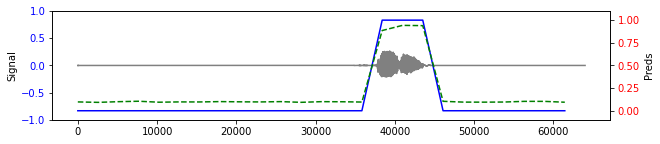


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1070, device='cuda:0')


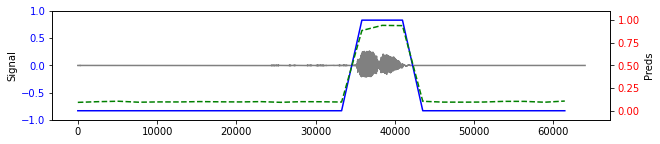


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0980, device='cuda:0')


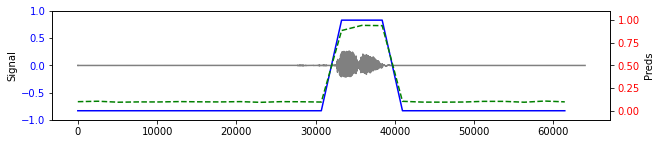


Greedy labels collected from this buffer
['_', '▁mhm']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1126, device='cuda:0')


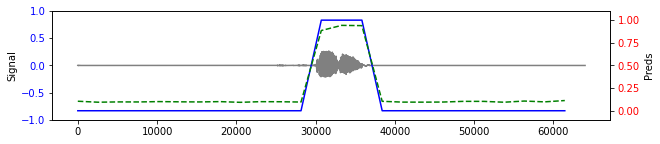


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1441, device='cuda:0')


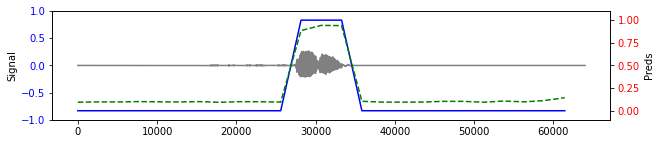


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1233, device='cuda:0')


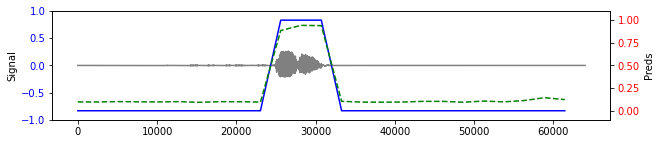


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1292, device='cuda:0')


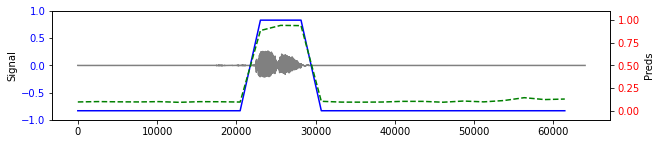


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1303, device='cuda:0')


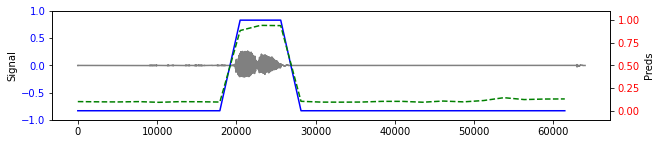


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1358, device='cuda:0')


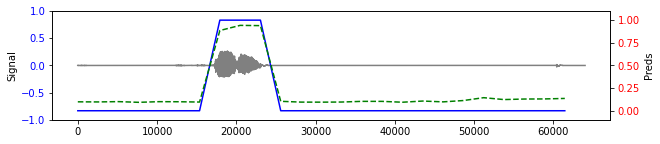


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0970, device='cuda:0')


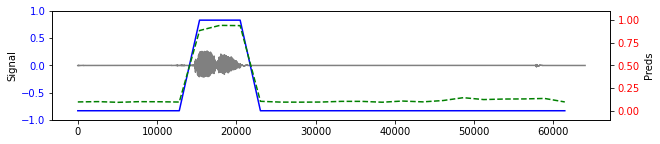


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1030, device='cuda:0')


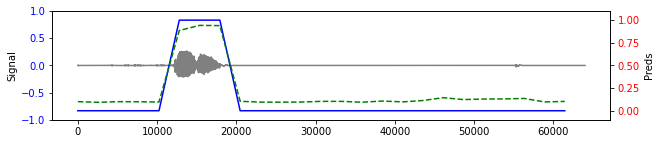


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1005, device='cuda:0')


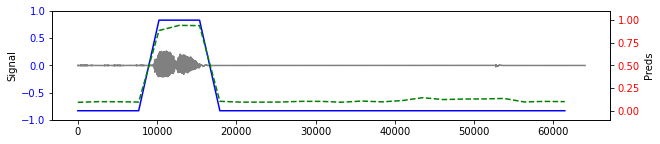


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0959, device='cuda:0')


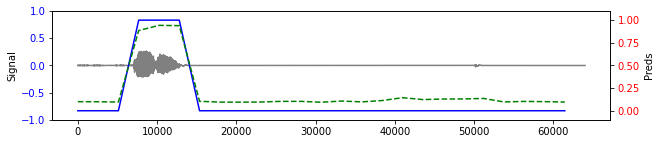


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1094, device='cuda:0')


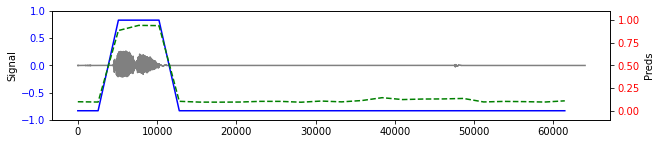


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1083, device='cuda:0')


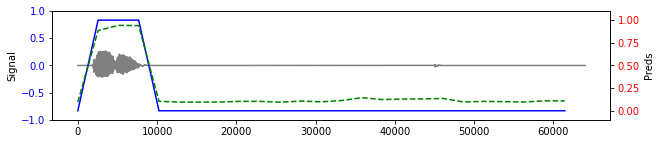


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0951, device='cuda:0')


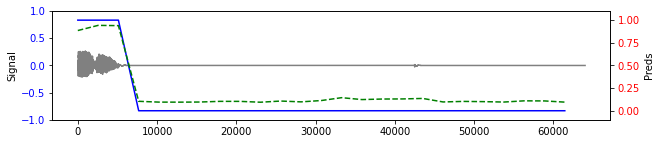


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0942, device='cuda:0')


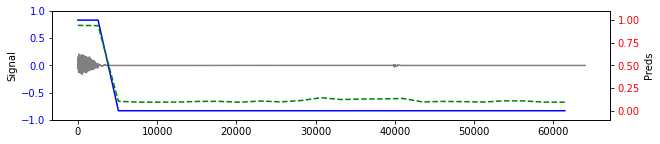


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0965, device='cuda:0')
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered_out ======
======= filtered

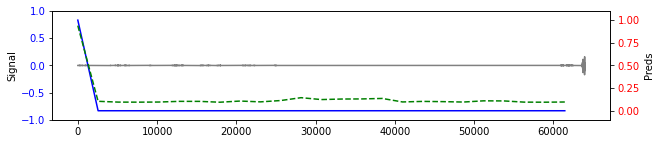


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.8513, device='cuda:0')


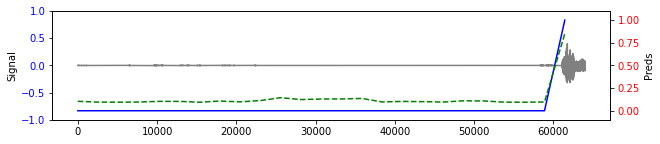


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9624, device='cuda:0')


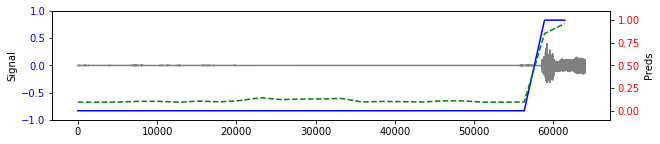


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.8618, device='cuda:0')


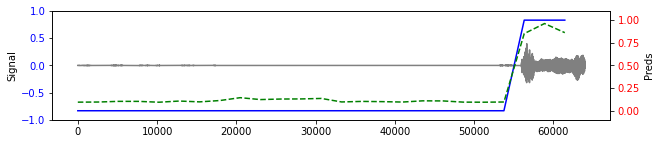


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9681, device='cuda:0')


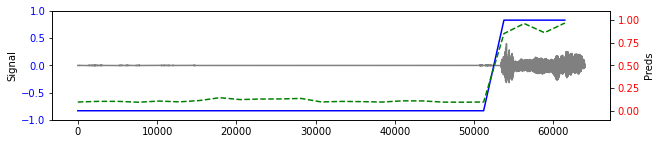


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9593, device='cuda:0')

Tokens collected from succesive buffers before CTC merge
['_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '▁mhm', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '▁right', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '▁mhm', '_',

In [25]:
stride = 8 # 8 for Citrinet | 4 for stt_en_conformer_ctc_large
# fine grained
asr_decoder = ChunkBufferDecoder(model, vad_model, stride=stride, chunk_len_in_secs=chunk_len_in_secs, buffer_len_in_secs=buffer_len_in_secs,
                                vad_context_window_len_in_secs=0.15)
transcription = asr_decoder.transcribe_buffers(buffer_list, vad_gate=True, plot=True, threshold=0.4)

length of decoded frame 200
Note the plot is based on collected all_toks


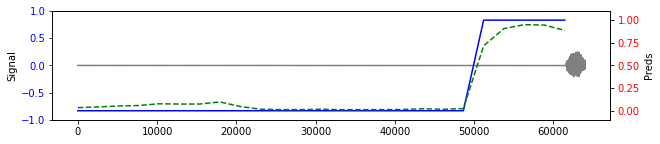


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.7387, device='cuda:0')


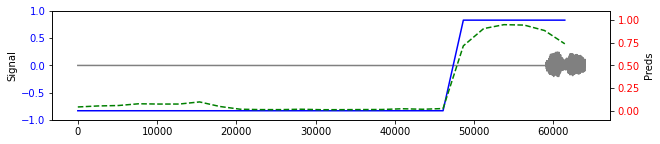


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.8999, device='cuda:0')


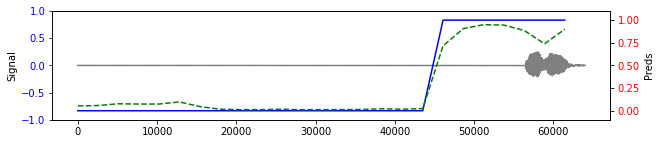


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.8946, device='cuda:0')


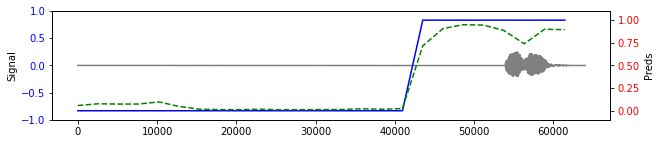


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.8929, device='cuda:0')


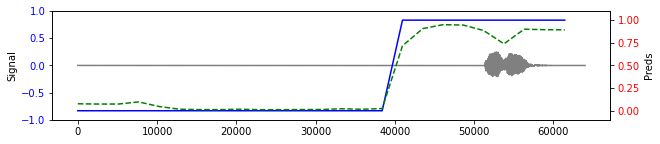


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.8172, device='cuda:0')


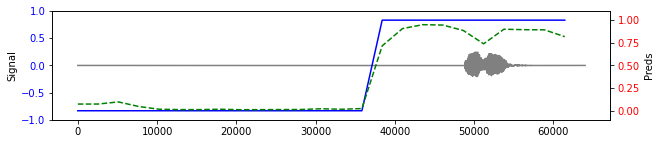


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.3110, device='cuda:0')


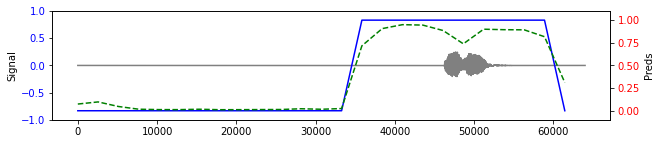


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0117, device='cuda:0')


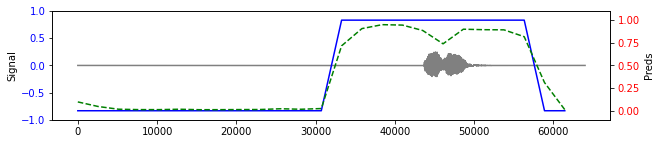


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0114, device='cuda:0')


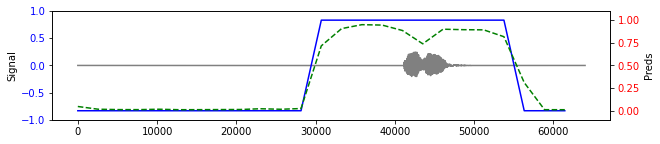


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0116, device='cuda:0')


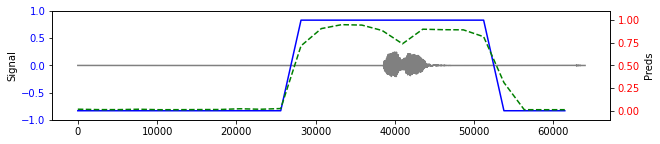


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0124, device='cuda:0')


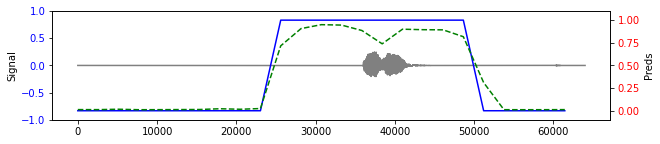


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0104, device='cuda:0')


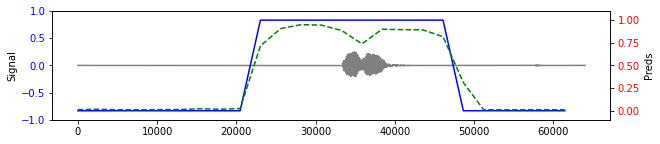


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0083, device='cuda:0')


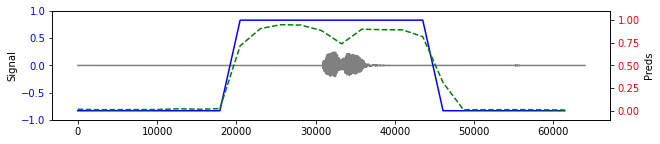


Greedy labels collected from this buffer
['▁mhm', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0160, device='cuda:0')


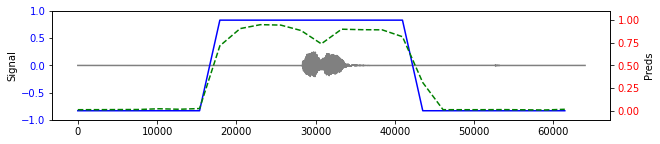


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0128, device='cuda:0')


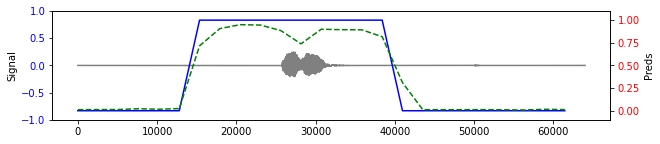


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0107, device='cuda:0')


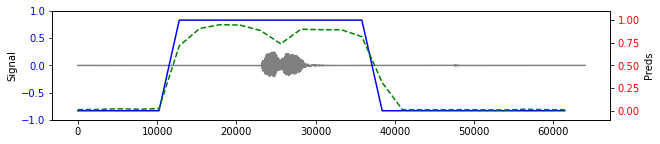


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0121, device='cuda:0')


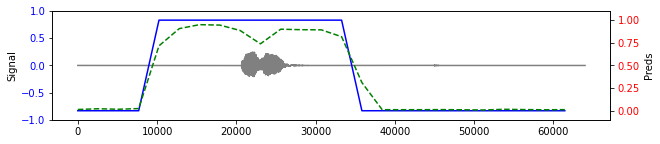


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0120, device='cuda:0')


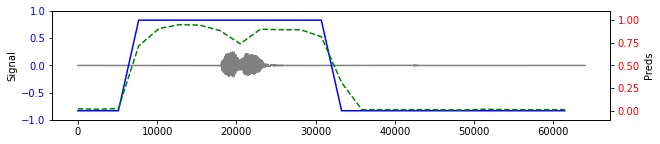


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0150, device='cuda:0')


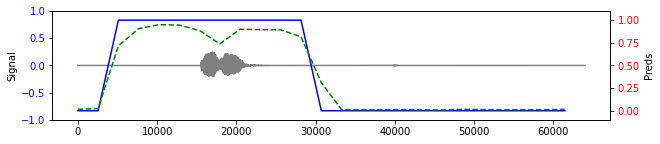


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0132, device='cuda:0')


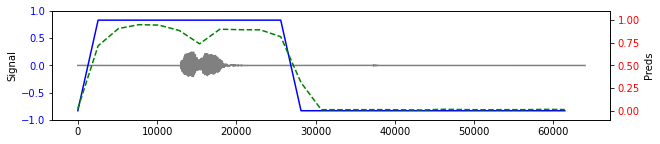


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0142, device='cuda:0')


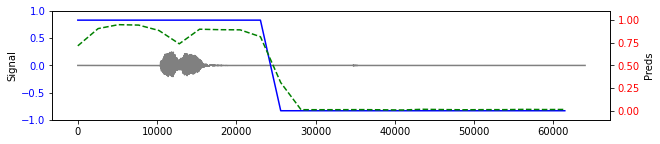


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0118, device='cuda:0')


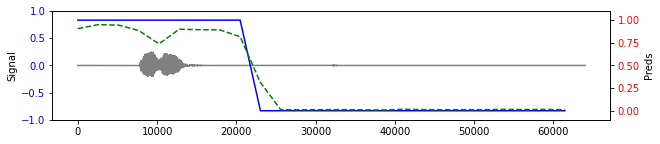


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0145, device='cuda:0')


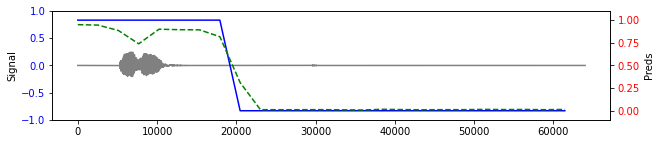


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0115, device='cuda:0')


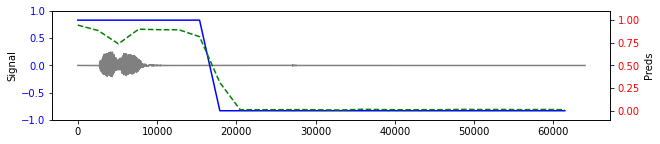


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0118, device='cuda:0')


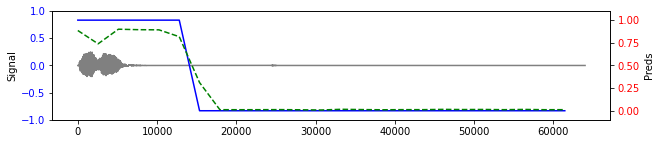


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0110, device='cuda:0')


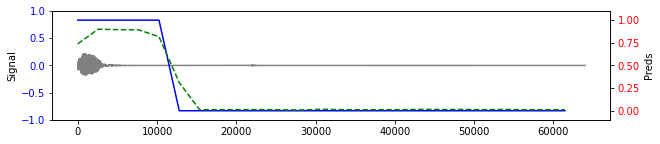


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0109, device='cuda:0')


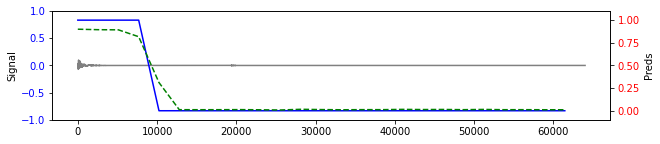


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0119, device='cuda:0')


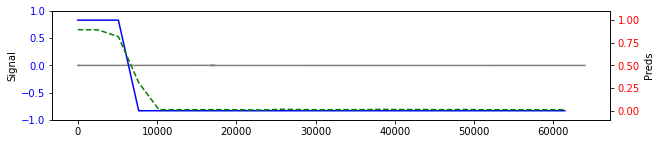


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0121, device='cuda:0')


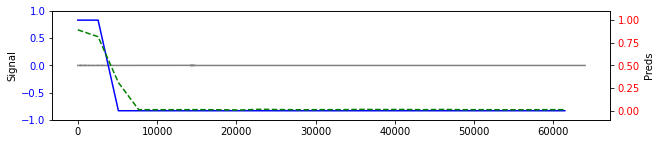


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0120, device='cuda:0')


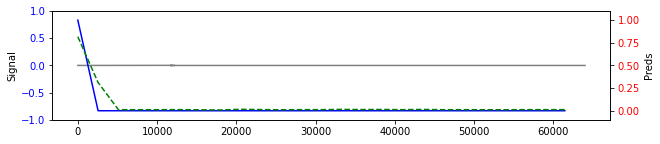


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0123, device='cuda:0')


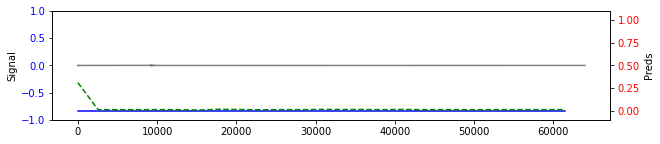


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0107, device='cuda:0')


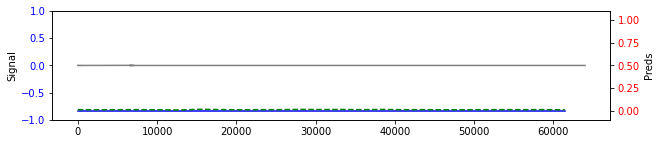


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0104, device='cuda:0')


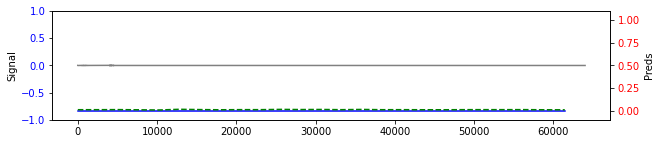


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0114, device='cuda:0')


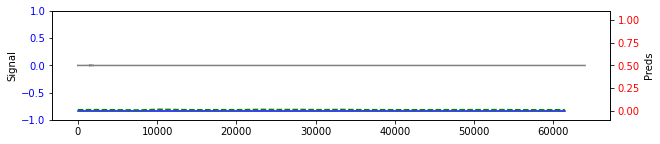


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0105, device='cuda:0')


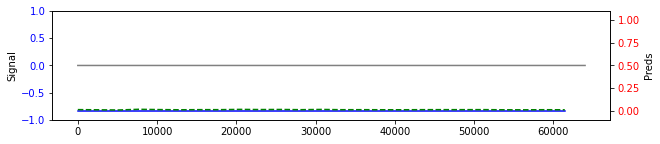


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0112, device='cuda:0')


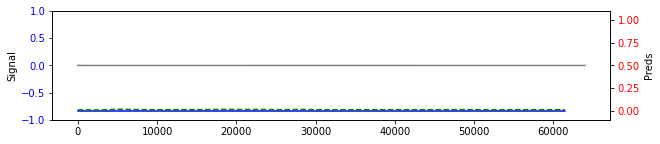


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0112, device='cuda:0')


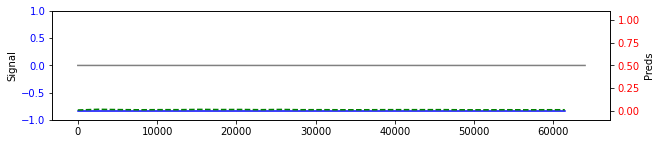


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0129, device='cuda:0')


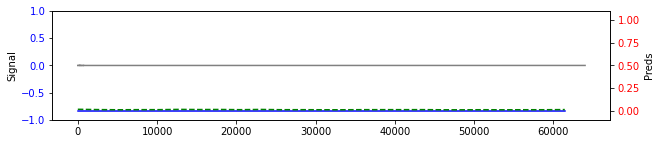


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0133, device='cuda:0')


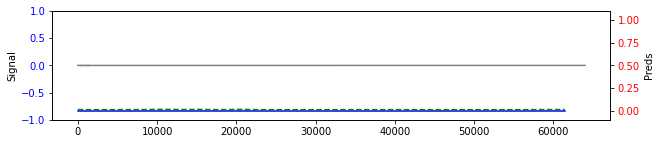


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0127, device='cuda:0')


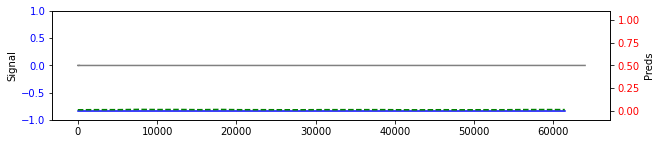


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0136, device='cuda:0')


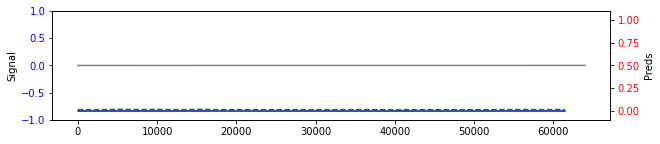


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0111, device='cuda:0')


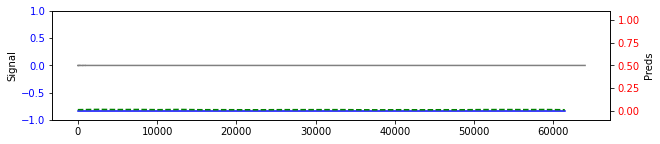


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0120, device='cuda:0')


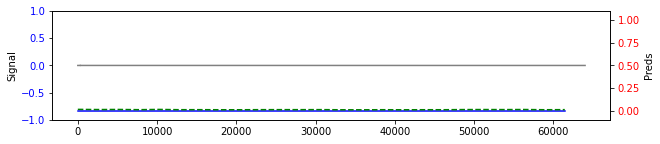


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0128, device='cuda:0')


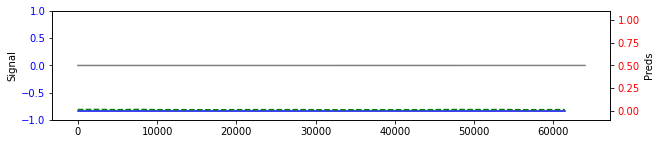


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0128, device='cuda:0')


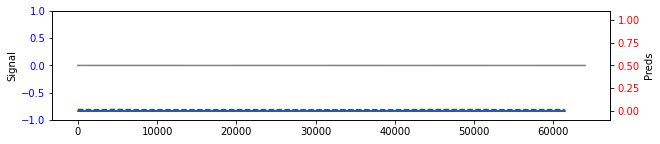


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0121, device='cuda:0')


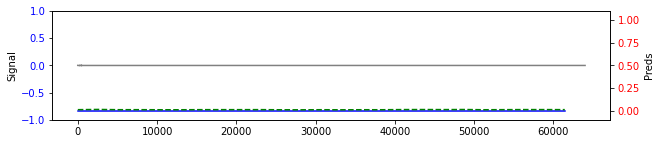


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0120, device='cuda:0')


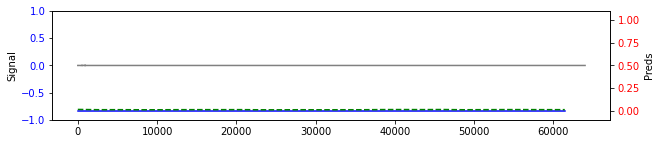


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0124, device='cuda:0')


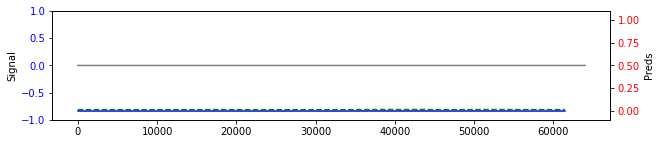


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0125, device='cuda:0')


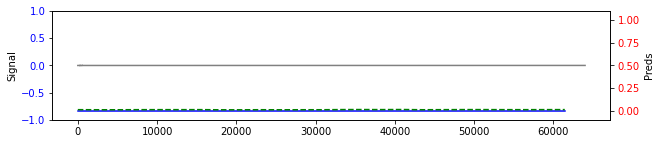


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0133, device='cuda:0')


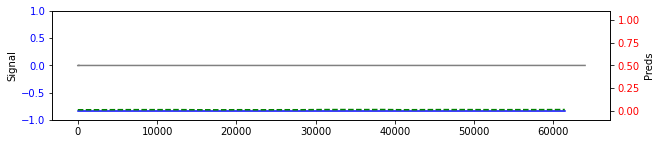


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0117, device='cuda:0')


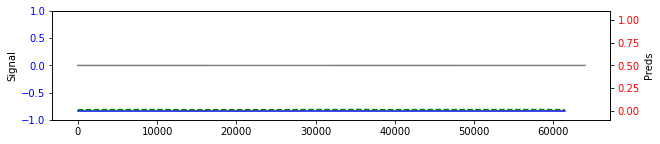


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0116, device='cuda:0')


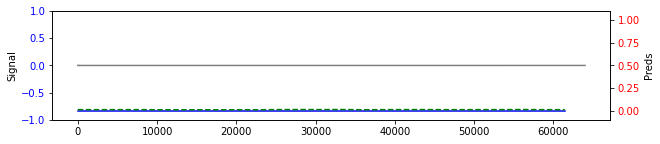


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0118, device='cuda:0')


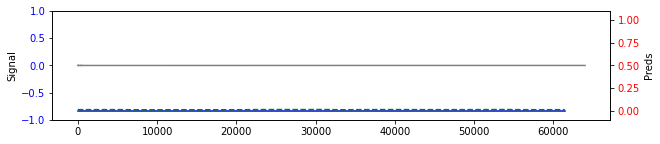


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0122, device='cuda:0')


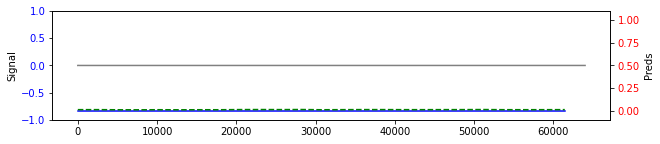


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0104, device='cuda:0')


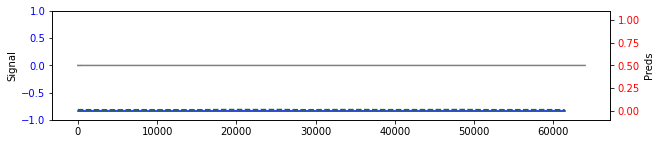


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0117, device='cuda:0')


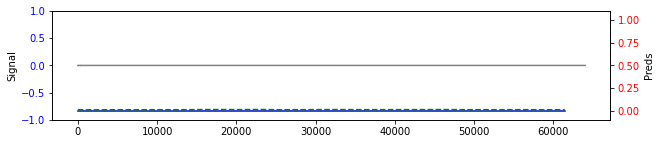


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0125, device='cuda:0')


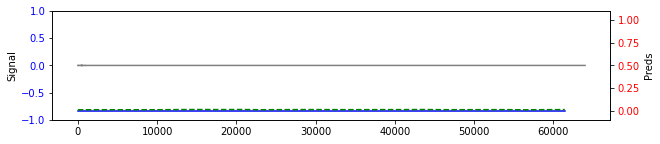


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0100, device='cuda:0')


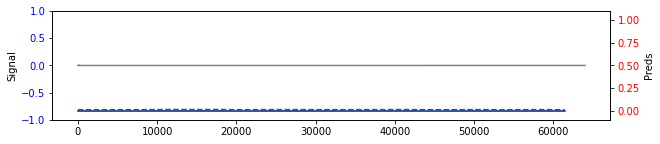


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0124, device='cuda:0')


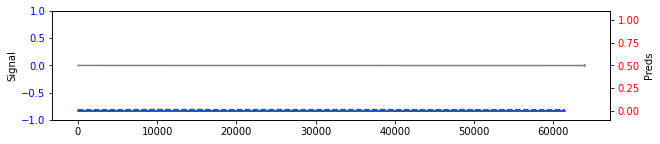


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0394, device='cuda:0')


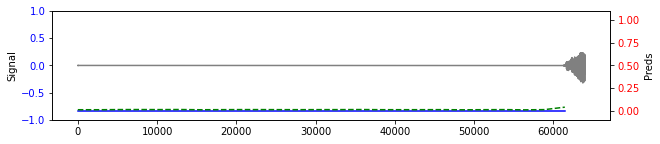


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.8485, device='cuda:0')


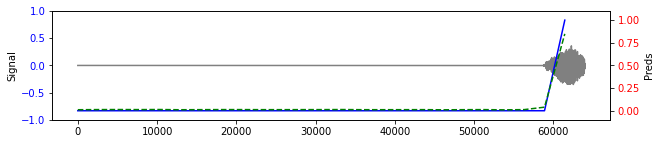


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9735, device='cuda:0')


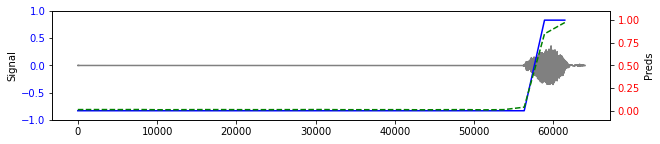


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9438, device='cuda:0')


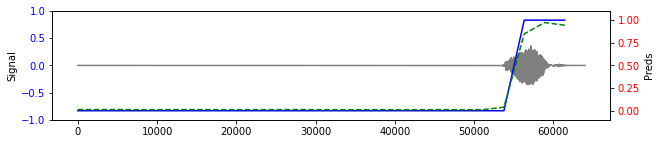


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9534, device='cuda:0')


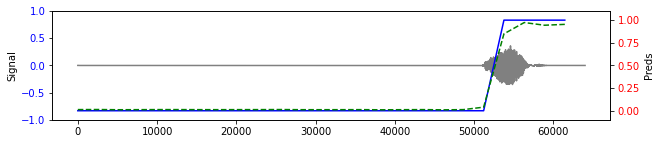


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.8914, device='cuda:0')


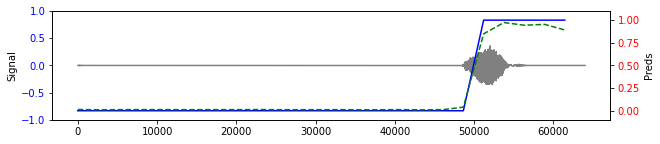


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1962, device='cuda:0')


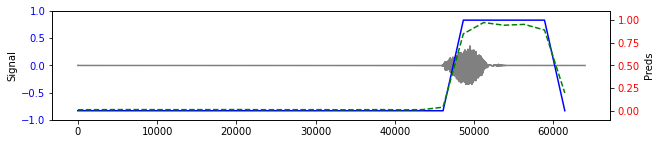


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0124, device='cuda:0')


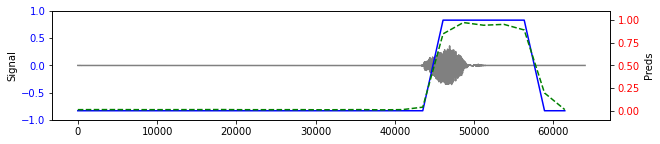


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0221, device='cuda:0')


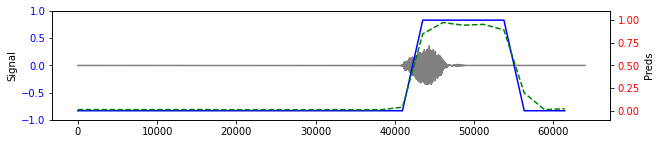


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0251, device='cuda:0')


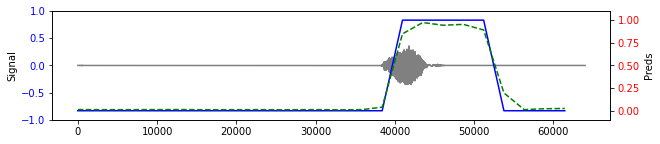


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0261, device='cuda:0')


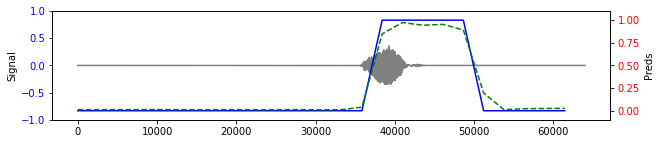


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0213, device='cuda:0')


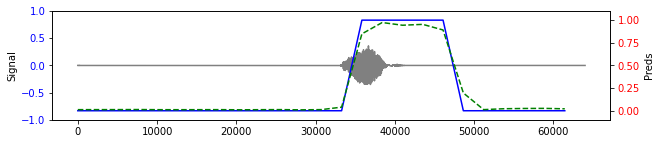


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0122, device='cuda:0')


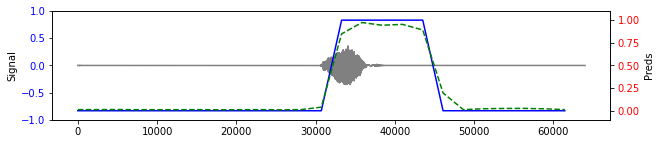


Greedy labels collected from this buffer
['▁right', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0121, device='cuda:0')


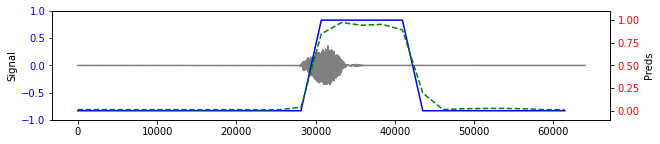


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0127, device='cuda:0')


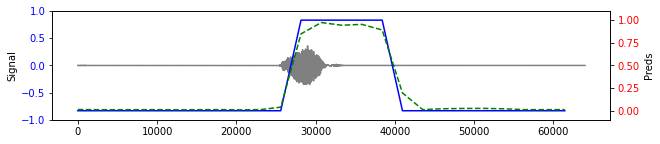


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0105, device='cuda:0')


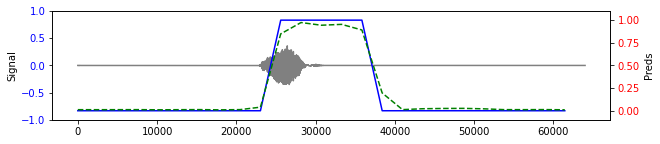


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0124, device='cuda:0')


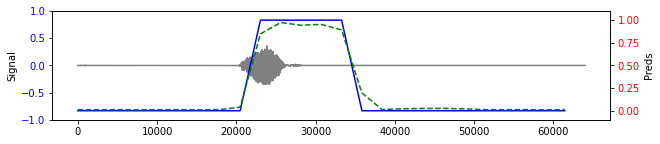


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0110, device='cuda:0')


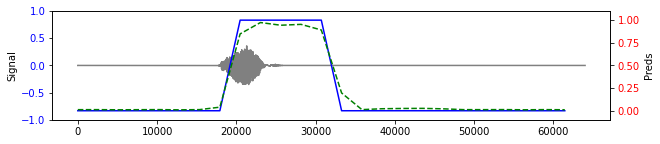


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0122, device='cuda:0')


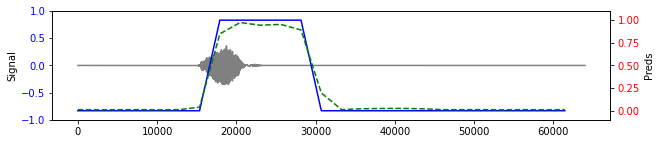


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0126, device='cuda:0')


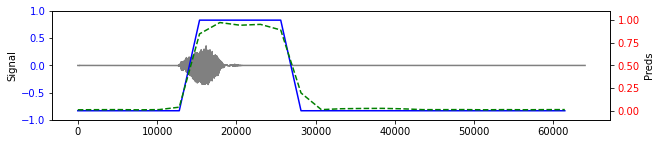


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0114, device='cuda:0')


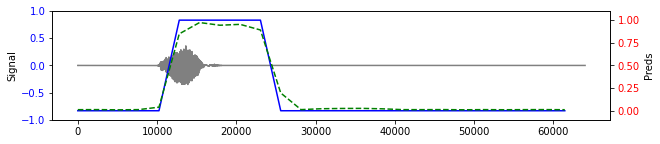


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0116, device='cuda:0')


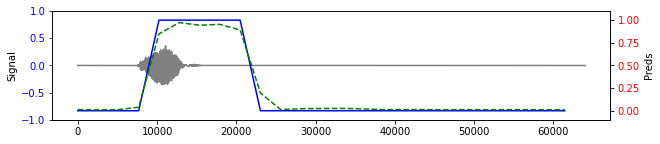


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0121, device='cuda:0')


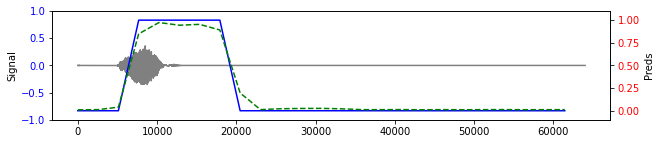


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0115, device='cuda:0')


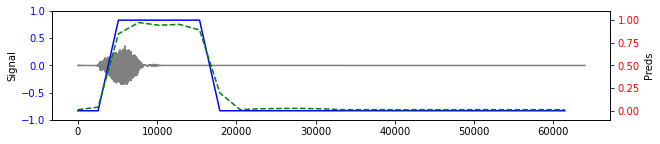


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0101, device='cuda:0')


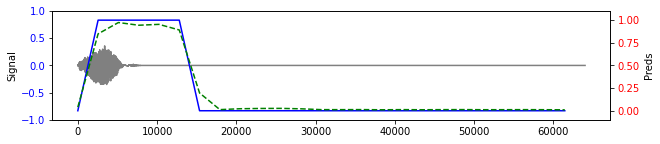


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0107, device='cuda:0')


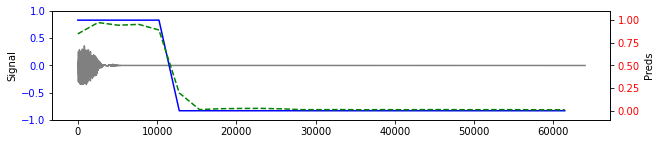


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0114, device='cuda:0')


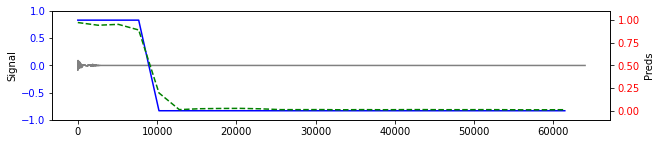


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0100, device='cuda:0')


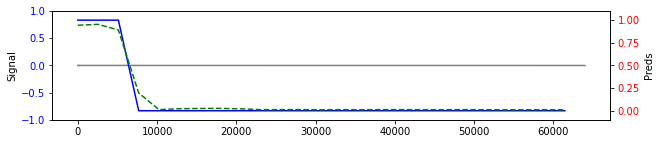


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0120, device='cuda:0')


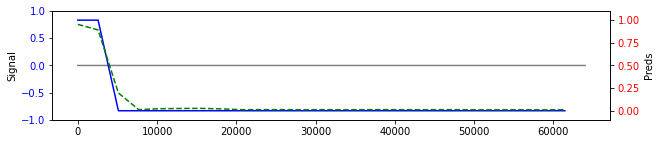


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0129, device='cuda:0')


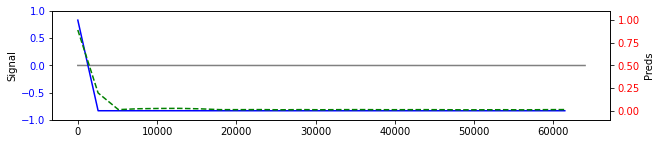


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0222, device='cuda:0')


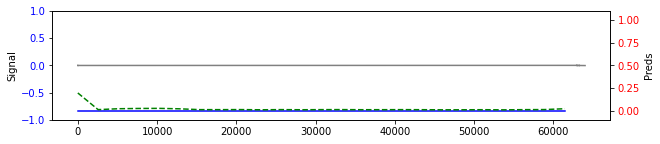


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0213, device='cuda:0')


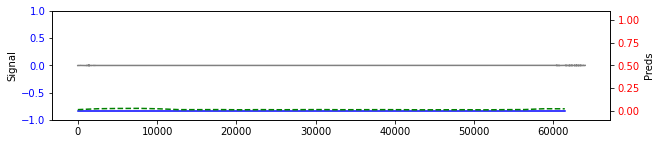


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0503, device='cuda:0')


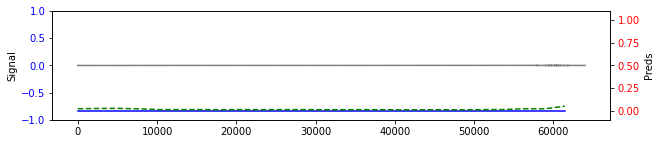


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0740, device='cuda:0')


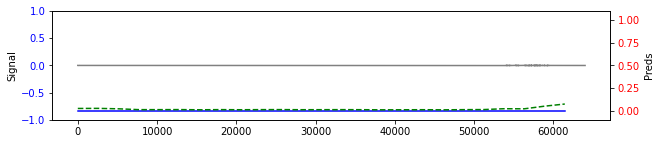


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0740, device='cuda:0')


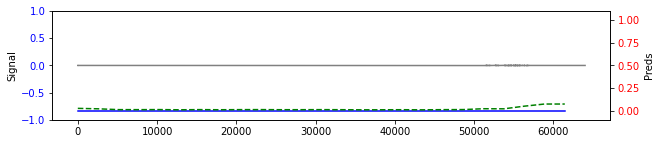


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0476, device='cuda:0')


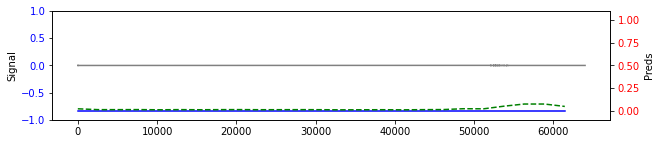


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0807, device='cuda:0')


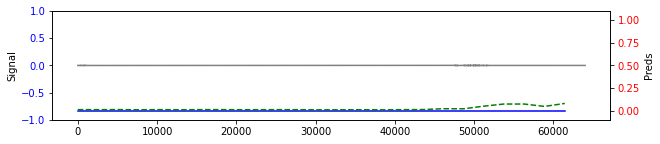


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0133, device='cuda:0')


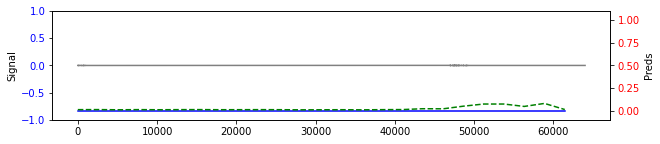


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0218, device='cuda:0')


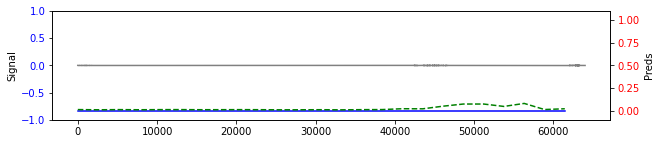


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0230, device='cuda:0')


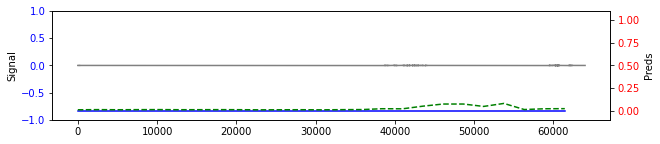


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0320, device='cuda:0')


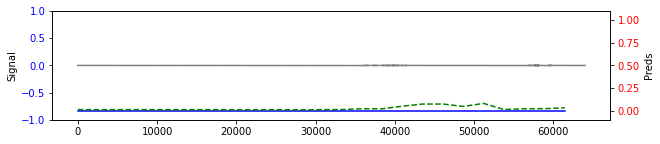


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0275, device='cuda:0')


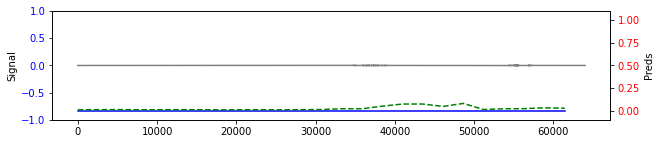


Greedy labels collected from this buffer
['_', '▁umhu']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0252, device='cuda:0')


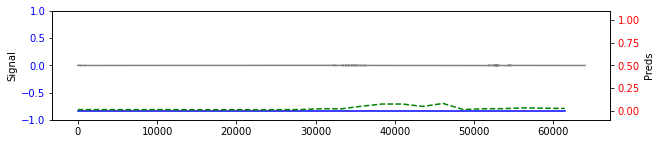


Greedy labels collected from this buffer
['_', 'm']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0183, device='cuda:0')


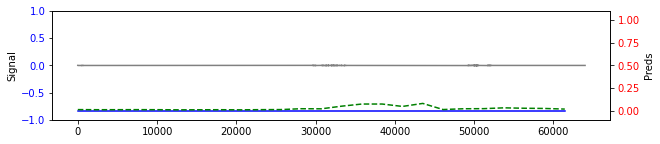


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0112, device='cuda:0')


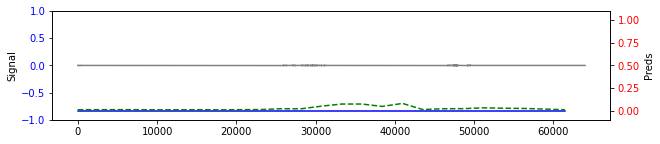


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0113, device='cuda:0')


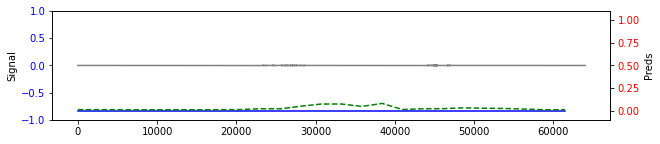


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0105, device='cuda:0')


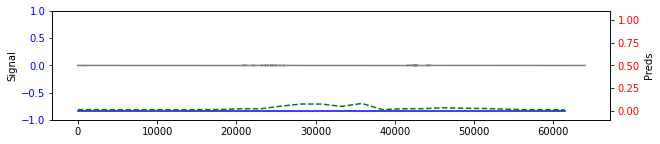


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0139, device='cuda:0')


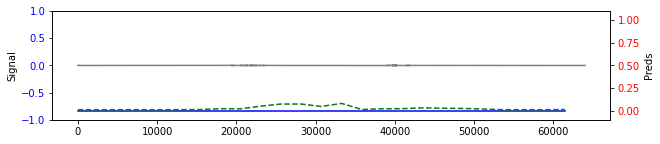


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0122, device='cuda:0')


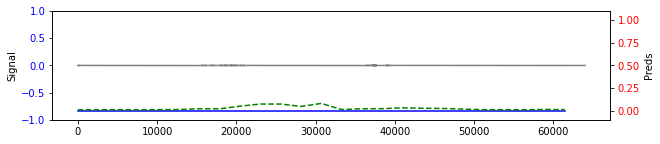


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0109, device='cuda:0')


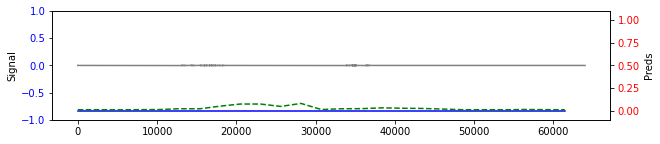


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0110, device='cuda:0')


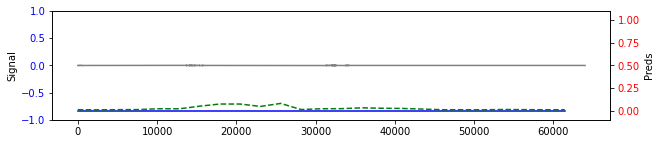


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0107, device='cuda:0')


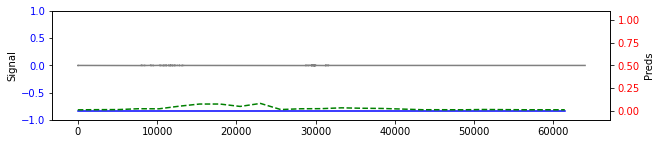


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0111, device='cuda:0')


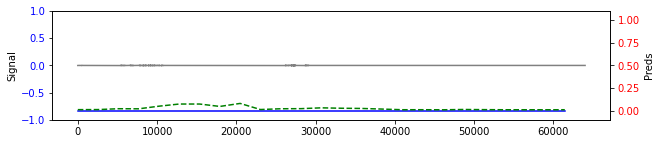


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0097, device='cuda:0')


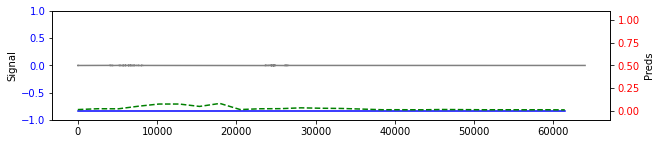


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0125, device='cuda:0')


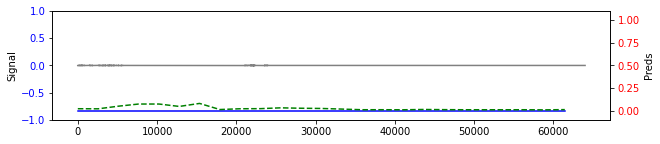


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0118, device='cuda:0')


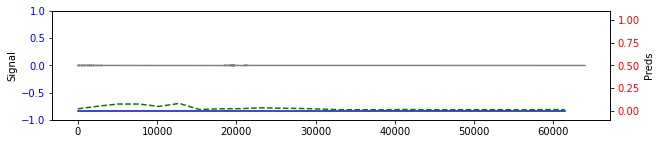


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0128, device='cuda:0')


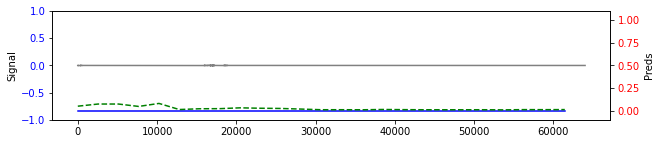


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0113, device='cuda:0')


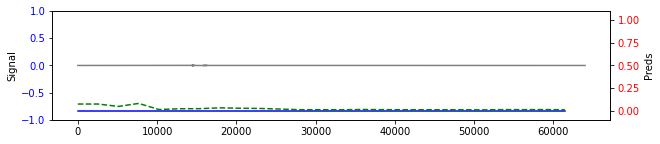


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0145, device='cuda:0')


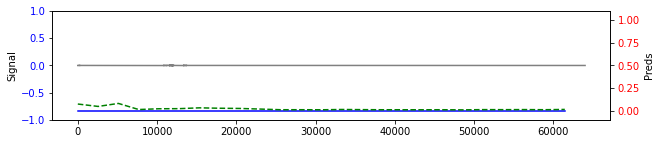


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0101, device='cuda:0')


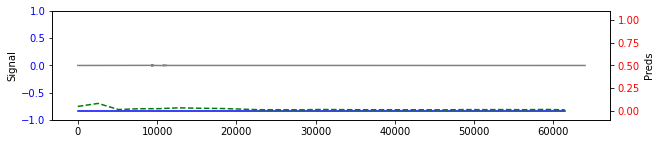


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0102, device='cuda:0')


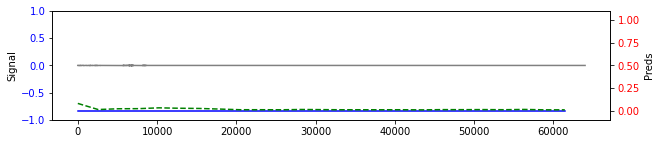


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0190, device='cuda:0')


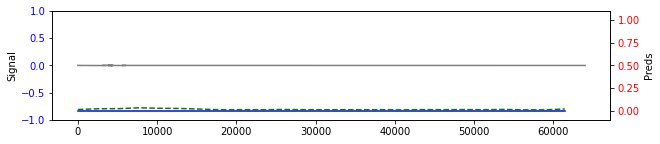


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0125, device='cuda:0')


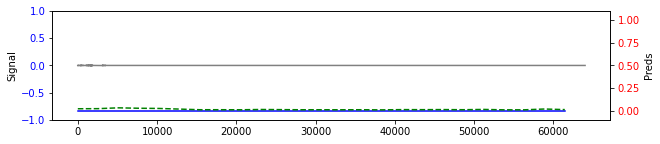


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0118, device='cuda:0')


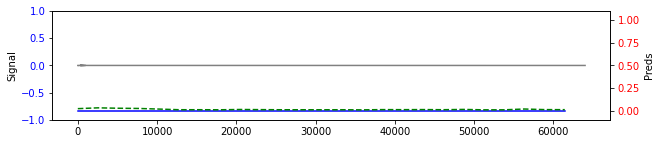


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0132, device='cuda:0')


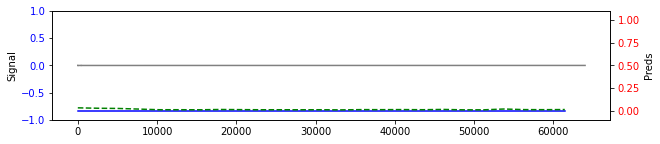


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0141, device='cuda:0')


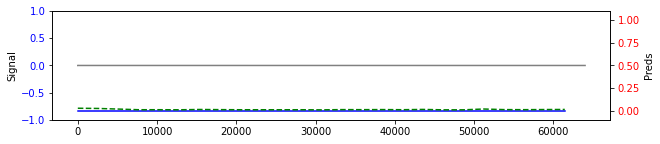


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0121, device='cuda:0')


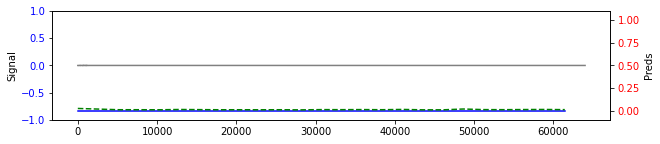


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0124, device='cuda:0')


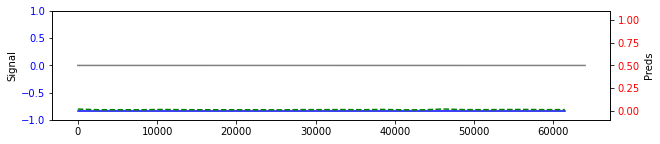


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0112, device='cuda:0')


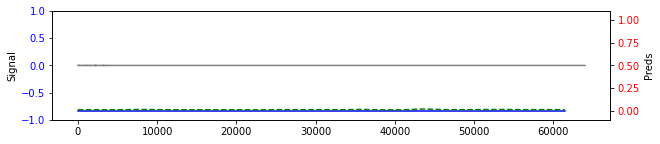


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0144, device='cuda:0')


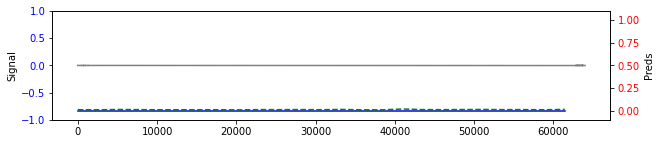


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0174, device='cuda:0')


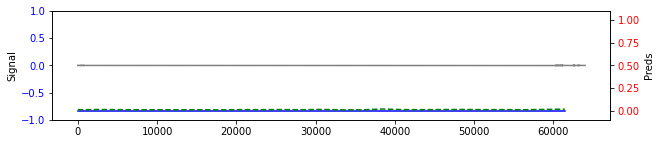


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0332, device='cuda:0')


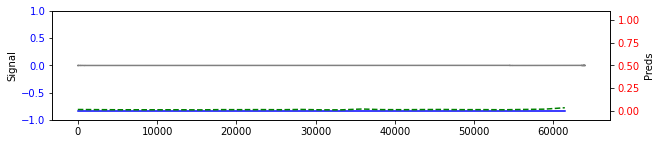


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0899, device='cuda:0')


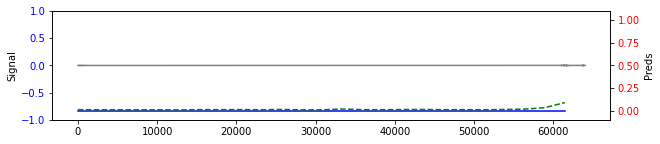


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0428, device='cuda:0')


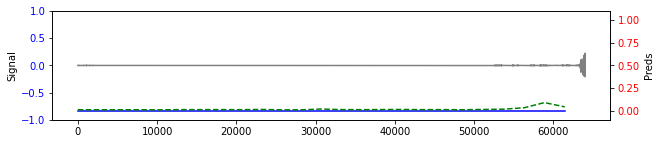


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.6663, device='cuda:0')


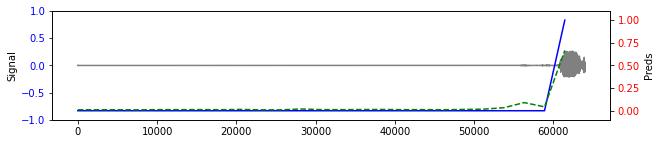


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.6837, device='cuda:0')


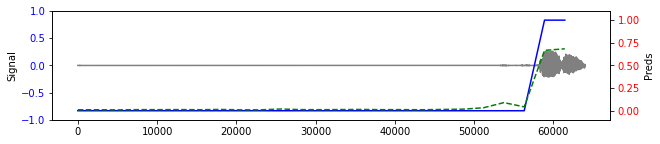


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.7366, device='cuda:0')


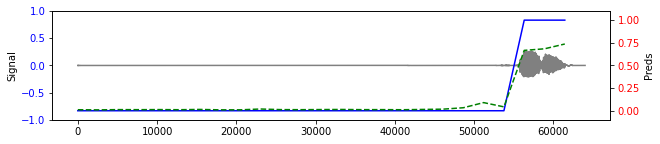


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.3806, device='cuda:0')


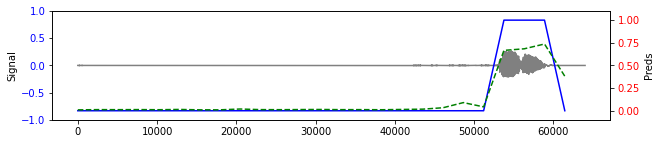


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.2212, device='cuda:0')


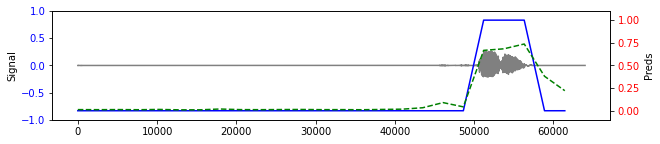


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.1045, device='cuda:0')


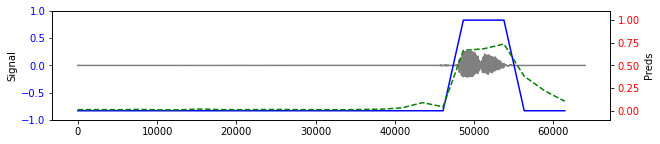


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0114, device='cuda:0')


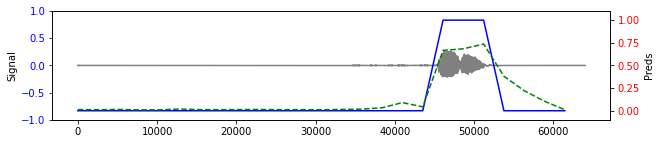


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0137, device='cuda:0')


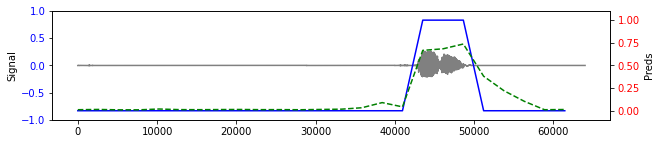


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0125, device='cuda:0')


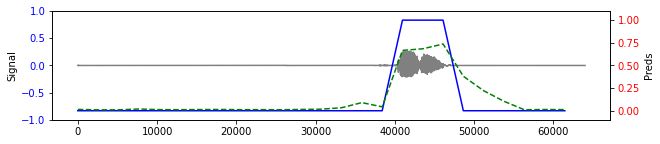


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0124, device='cuda:0')


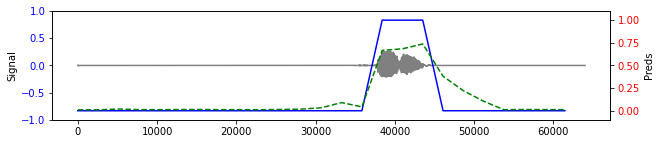


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0117, device='cuda:0')


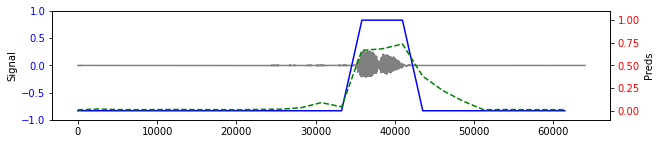


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0130, device='cuda:0')


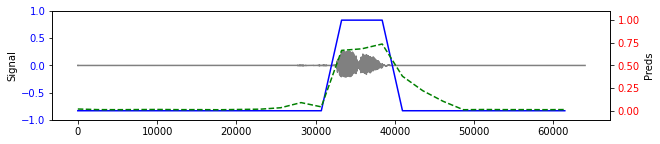


Greedy labels collected from this buffer
['_', '▁mhm']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0150, device='cuda:0')


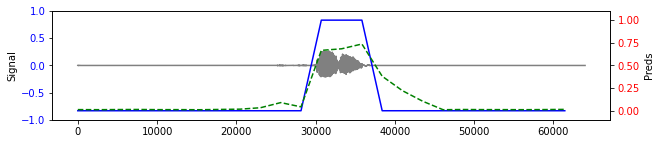


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0361, device='cuda:0')


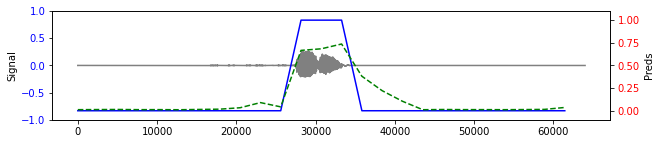


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0571, device='cuda:0')


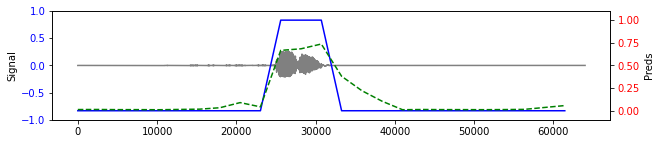


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0523, device='cuda:0')


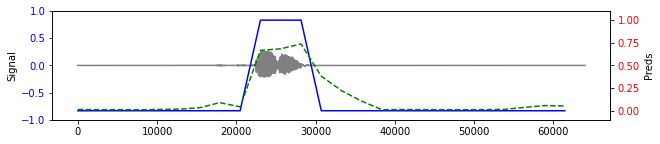


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0736, device='cuda:0')


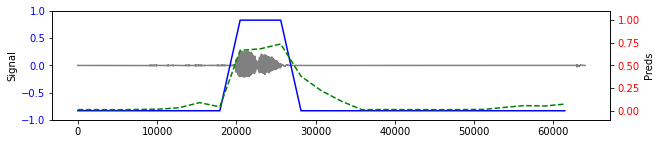


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0435, device='cuda:0')


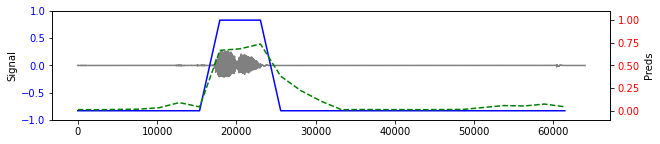


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0136, device='cuda:0')


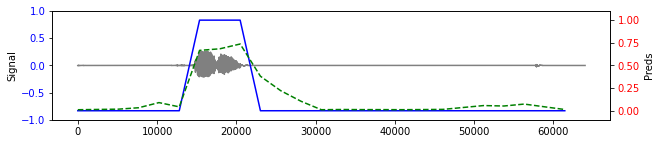


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0101, device='cuda:0')


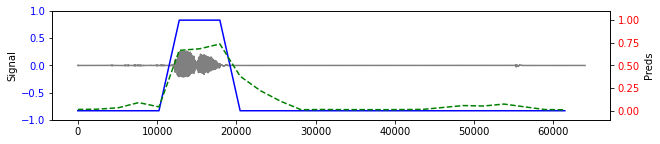


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0116, device='cuda:0')


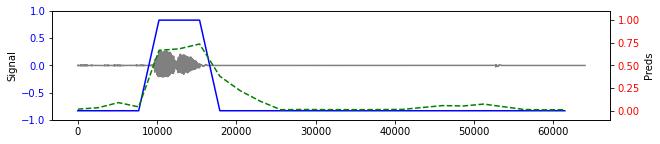


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0113, device='cuda:0')


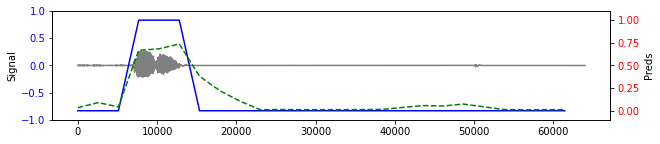


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0189, device='cuda:0')


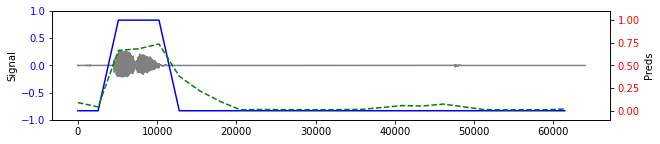


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0115, device='cuda:0')


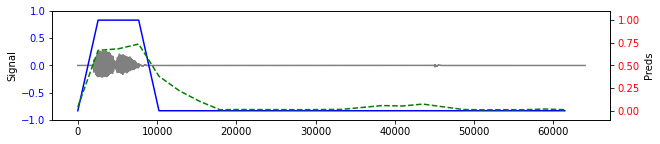


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0106, device='cuda:0')


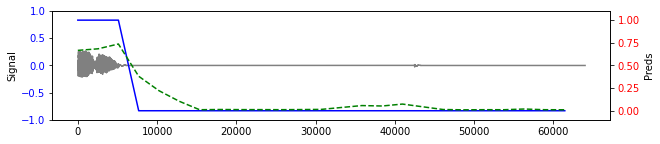


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0120, device='cuda:0')


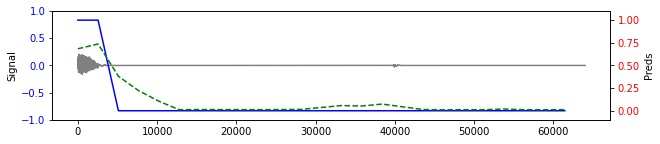


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.0117, device='cuda:0')


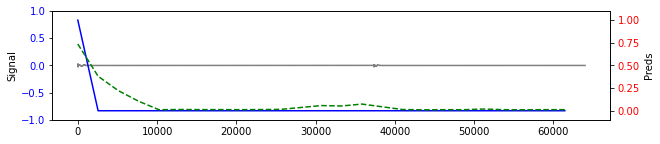


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0103, device='cuda:0')


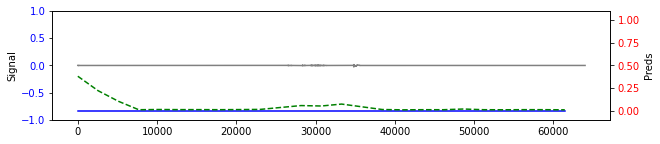


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0116, device='cuda:0')


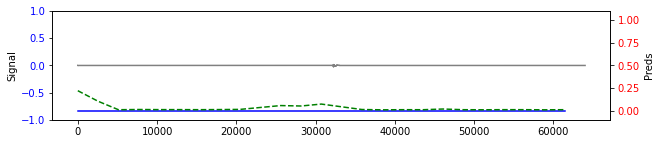


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0103, device='cuda:0')


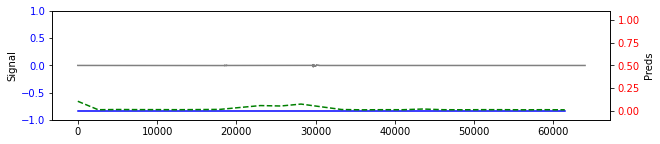


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0110, device='cuda:0')


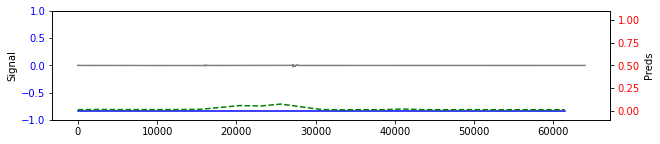


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0113, device='cuda:0')


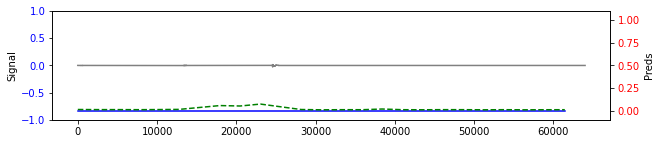


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0130, device='cuda:0')


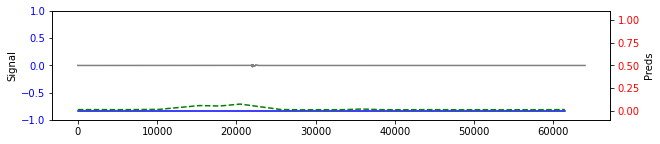


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0132, device='cuda:0')


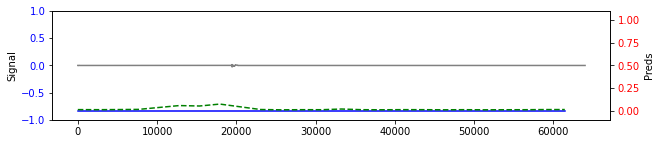


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0132, device='cuda:0')


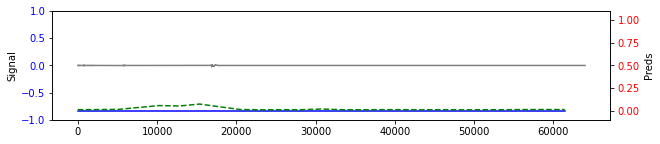


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0139, device='cuda:0')


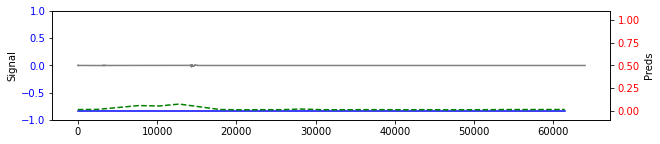


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0115, device='cuda:0')


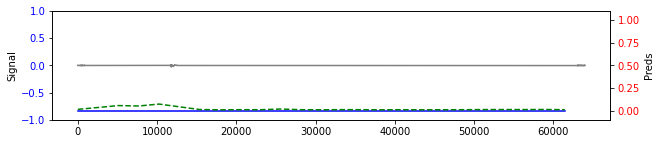


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0250, device='cuda:0')


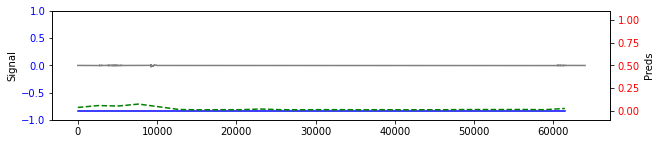


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0172, device='cuda:0')


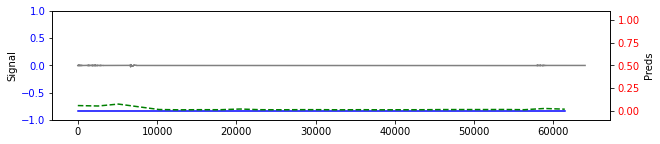


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0224, device='cuda:0')


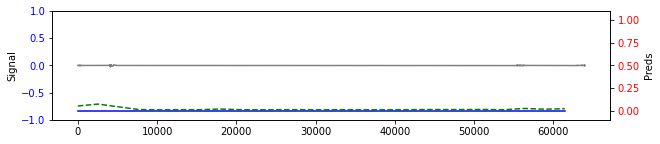


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0385, device='cuda:0')


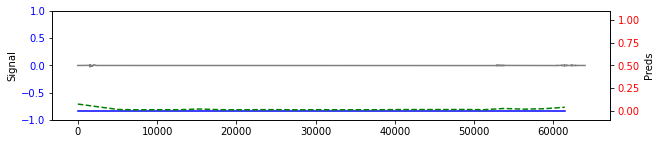


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0372, device='cuda:0')


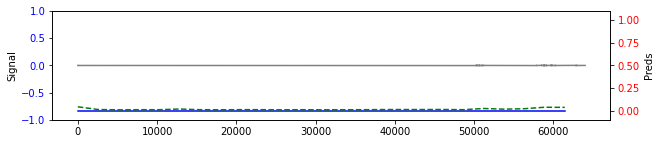


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0705, device='cuda:0')


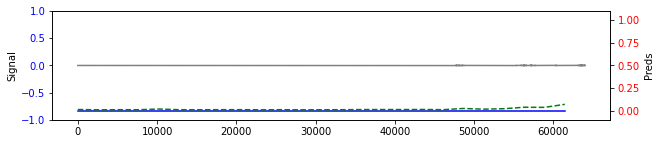


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0341, device='cuda:0')


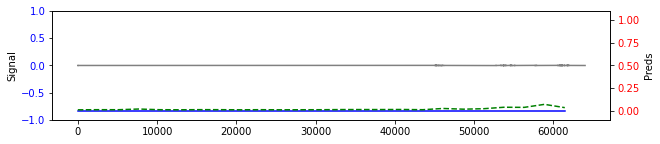


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0417, device='cuda:0')


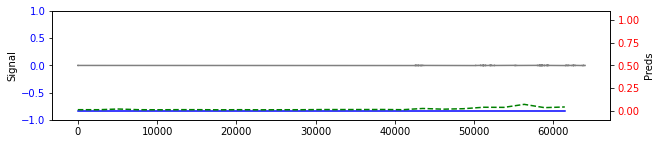


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0528, device='cuda:0')


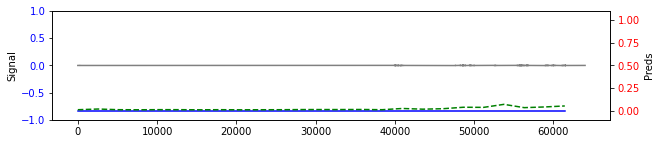


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0576, device='cuda:0')


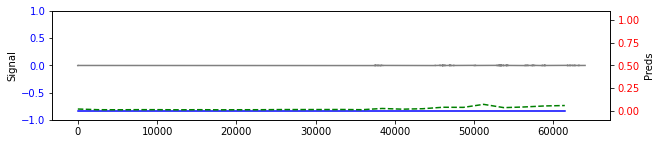


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0769, device='cuda:0')


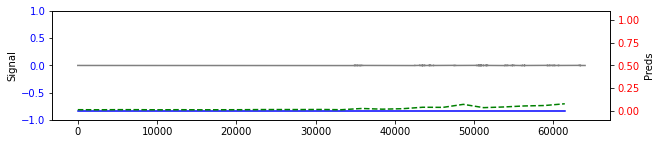


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0738, device='cuda:0')


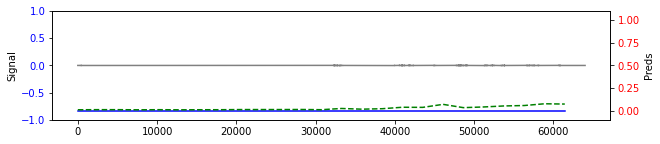


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0739, device='cuda:0')


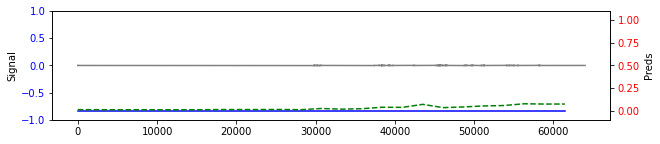


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0974, device='cuda:0')


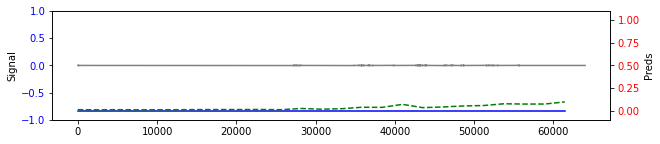


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0469, device='cuda:0')


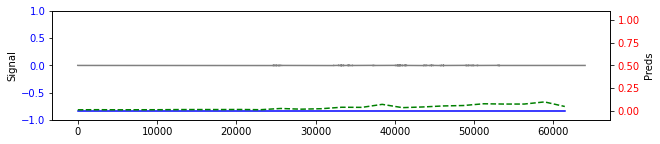


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0169, device='cuda:0')


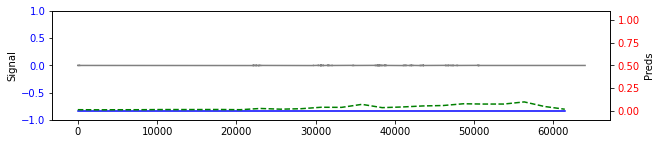


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0126, device='cuda:0')


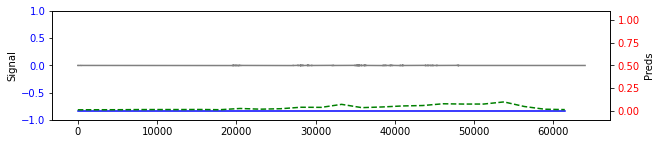


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0123, device='cuda:0')


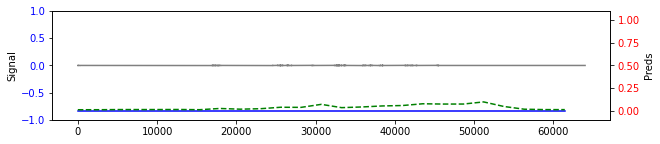


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0166, device='cuda:0')


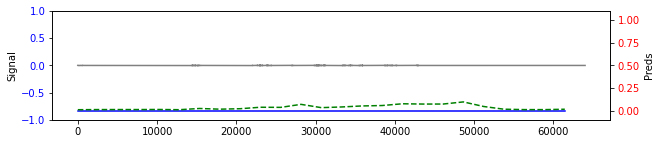


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0114, device='cuda:0')


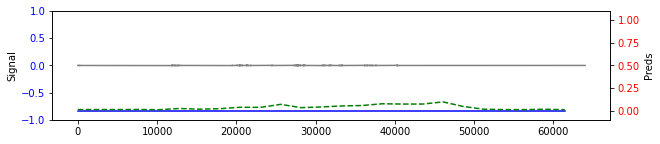


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0120, device='cuda:0')


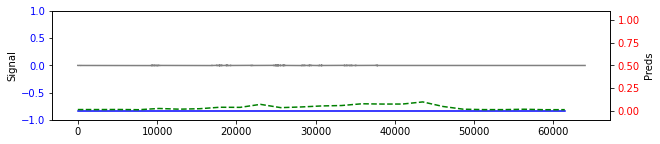


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0129, device='cuda:0')


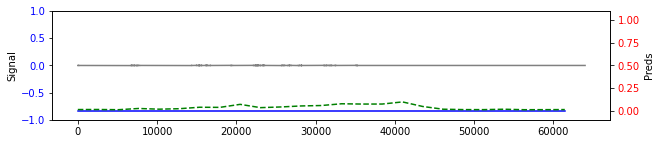


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0137, device='cuda:0')


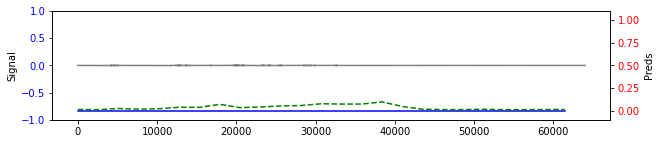


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0219, device='cuda:0')


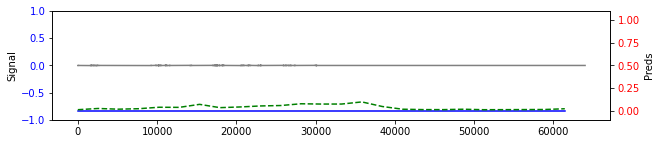


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0163, device='cuda:0')


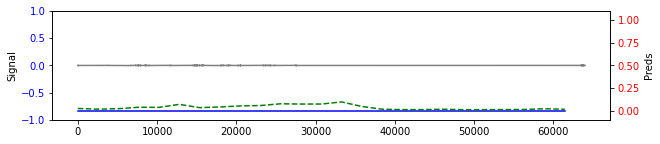


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

 VAD gate decision for this buffer 0

 VAD preds from this frame tensor(0.0242, device='cuda:0')


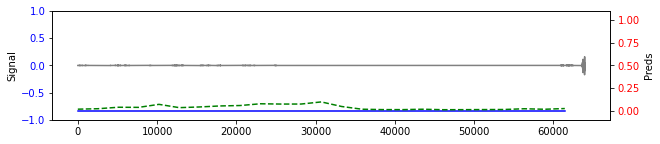


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.7164, device='cuda:0')


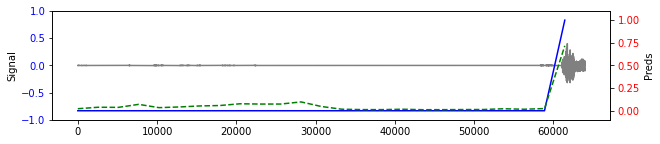


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9067, device='cuda:0')


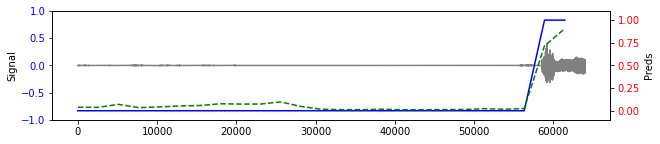


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9500, device='cuda:0')


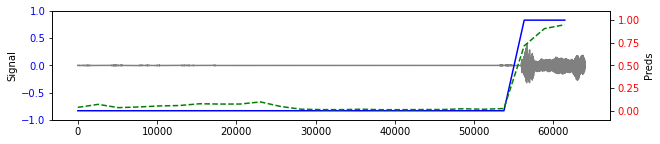


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.9454, device='cuda:0')


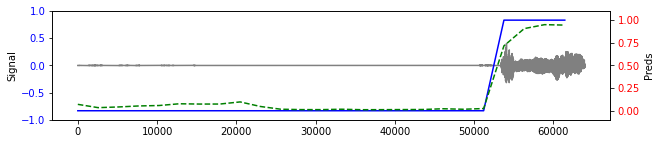


Greedy labels collected from this buffer
['_', '_']

 VAD output for this buffer [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1]

 VAD gate decision for this buffer 1

 VAD preds from this frame tensor(0.8855, device='cuda:0')

Tokens collected from succesive buffers before CTC merge
['_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '▁mhm', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_', '_

In [26]:
stride = 8 # 8 for Citrinet
asr_decoder = ChunkBufferDecoder(model, vad_model, stride=stride, chunk_len_in_secs=chunk_len_in_secs, buffer_len_in_secs=buffer_len_in_secs )
transcription = asr_decoder.transcribe_buffers(buffer_list, vad_gate=False, plot=True, threshold=0.4)

In [27]:
# Final transcription after CTC merge
print(transcription)

mhm right umhum mhm


In [28]:
import librosa
import IPython.display as ipd

Time to evaluate our streaming inference on the whole long file that we created.

In [29]:
audio, sample_rate = librosa.load(concat_audio_path,
                                  sr =16000)
ipd.Audio(audio, rate=16000)

In [30]:
librosa.get_duration(y=audio, sr=16000,)

280.14

### Original Streaming ASR

In [31]:
del chunk_reader

In [32]:
# WER calculation
# from nemo.collections.asr.metrics.wer import word_error_rate
# Collect all buffers from the audio file
sampbuffer = np.zeros([buffer_len], dtype=np.float32)

chunk_reader = AudioChunkIterator(samples, chunk_len_in_secs, sample_rate)
buffer_list = []
for chunk in chunk_reader:
    sampbuffer[:-chunk_len] = sampbuffer[chunk_len:]
    sampbuffer[-chunk_len:] = chunk
    buffer_list.append(np.array(sampbuffer))

asr_decoder = ChunkBufferDecoder(model, vad_model, stride=stride, chunk_len_in_secs=chunk_len_in_secs, buffer_len_in_secs=buffer_len_in_secs )
streaming_asr_transcription = asr_decoder.transcribe_buffers(buffer_list, plot=False)
wer = word_error_rate(hypotheses=[streaming_asr_transcription], references=[ref_transcript])

print(f"WER: {round(wer*100,2)}%")

length of decoded frame 1751
WER: 43.3%


In [33]:
streaming_asr_transcription

"mhm right umhum mhm oh and mhmm right hm hmm it's an interesting observationhuh mhm okay h h h mhm uhm uhhuh right umhum mhm oh mhm umhum mhmm umhu mhm yeah oh yes yeah hm yeahhuh umhum yeah umhu hm right yeah and uh well now where you check out the thermos staff first umhum and uh soly that will be all it all it needs i oh did i bring my tors and rnch up to you okay ohm hm mm oh umhum maybe you can trade off for it then trae to trade the one i brought up uh into the dial one yeah and uh yeah mhm so mhm"

### Streaming VAD+ASR

#### last_k=7 Use all 

last_k=25

In [34]:
# # WER calculation
# from nemo.collections.asr.metrics.wer import word_error_rate
# Collect all buffers from the audio file
sampbuffer = np.zeros([buffer_len], dtype=np.float32)

chunk_reader = AudioChunkIterator(samples, chunk_len_in_secs, sample_rate)
buffer_list = []
for chunk in chunk_reader:
    sampbuffer[:-chunk_len] = sampbuffer[chunk_len:]
    sampbuffer[-chunk_len:] = chunk
    buffer_list.append(np.array(sampbuffer))

asr_decoder = ChunkBufferDecoder(model, vad_model, stride=stride, chunk_len_in_secs=chunk_len_in_secs, buffer_len_in_secs=buffer_len_in_secs )
transcription = asr_decoder.transcribe_buffers(buffer_list, vad_gate=True, last_k=25, plot=False)
wer = word_error_rate(hypotheses=[transcription], references=[ref_transcript])

print(f"WER: {round(wer*100,2)}%")

length of decoded frame 1026
WER: 27.84%


In [35]:
# Streaming VAD+ASR
transcription

"mhm right mhm oh rightm it's an interesting observationhuh mhm mhm uhhuh right umhum oh mhm mhm yeah oh yes yeah hm yeahhuh umhum yeah umhu hm right yeah and uh well now where you check out the thermos staff first umhum and uh soly that will be all it all it needs oh did i bring my tors and rnch up to you okay oh oh umhum maybe you can trade off for it then trae to trade the one i brought up uh into the dial one yeah and uh yeah mhm so mhm"

#### last_k=4
last_k = 12

In [36]:
# WER calculation
from nemo.collections.asr.metrics.wer import word_error_rate
# Collect all buffers from the audio file
sampbuffer = np.zeros([buffer_len], dtype=np.float32)

chunk_reader = AudioChunkIterator(samples, chunk_len_in_secs, sample_rate)
buffer_list = []
for chunk in chunk_reader:
    sampbuffer[:-chunk_len] = sampbuffer[chunk_len:]
    sampbuffer[-chunk_len:] = chunk
    buffer_list.append(np.array(sampbuffer))

asr_decoder = ChunkBufferDecoder(model, vad_model, stride=stride, chunk_len_in_secs=chunk_len_in_secs, buffer_len_in_secs=buffer_len_in_secs )
transcription = asr_decoder.transcribe_buffers(buffer_list, vad_gate=True, last_k=12, plot=False)
wer = word_error_rate(hypotheses=[transcription], references=[ref_transcript])

print(f"WER: {round(wer*100,2)}%")

length of decoded frame 723
WER: 25.77%


In [37]:
transcription

"mhm right mhm oh rightm it's an interesting observationhuh mhm mhm uhhuh right oh mhm mhm yeah oh yes yeah hm yeahhuh umhum yeah hm right yeah and uh well now where you check out the thermos staff first umhum and uh soly that will be all it all it needs oh did i bring my tors and rnch up to you okay oh oh umhum maybe you can trade off for it then trae to trade the one i brought up uh into the dial one yeah and uh yeah mhm so mhm"

In [38]:
ref_transcript

'mhm right mhm uh mhm right mhm an interesting observation uh uh mhm mhm uhhuh right oh mhm mhm yeah oh yes yeah uh yeah mhm yeah uh right yeah and uh well now will you check out the thermostat first mhm and uh so preferably that will be all it all it needs alright did i bring my torsion wrench up to you okay oh oh mhm maybe you can trade off for it then trade uh trade the one i brought up uh into the dial one yeah and uh yeah mhm so mhm right'

### VAD plot

In [39]:
import matplotlib.pyplot as plt
def plot(
    path2audio_file,
    path2_vad_pred,
    path2ground_truth_label=None,
    offset=0,
    duration=None,
    threshold=None,
    per_args=None,
    shift_len=0.16
):
    """
    Plot VAD outputs for demonstration in tutorial
    Args:
        path2audio_file (str):  path to audio file.
        path2_vad_pred (str): path to vad prediction file,
        path2ground_truth_label(str): path to groundtruth label file.
        threshold (float): threshold for prediction score (from 0 to 1).
    """
    plt.figure(figsize=[20, 2])
    FRAME_LEN = shift_len #0.02 #0.63 #0.01

    audio, sample_rate = librosa.load(path=path2audio_file, sr=16000, mono=True, offset=offset, duration=duration)
    dur = librosa.get_duration(audio, sr=sample_rate)

    time = np.arange(offset, offset + dur, FRAME_LEN)
    frame = np.loadtxt(path2_vad_pred)
    frame = frame[int(offset / FRAME_LEN) : int((offset + dur) / FRAME_LEN)]

    len_pred = len(frame)
    ax1 = plt.subplot()
    ax1.plot(np.arange(audio.size) / sample_rate, audio, 'gray')
    ax1.set_xlim([0, int(dur) + 1])
    ax1.tick_params(axis='y', labelcolor='b')
    ax1.set_ylabel('Signal')
    ax1.set_ylim([-1, 1])
    ax2 = ax1.twinx()

    prob = frame
    if threshold and per_args:
        raise ValueError("threshold and per_args cannot be used at same time!")
    if not threshold and not per_args:
        raise ValueError("One and only one of threshold and per_args must have been used!")

    if threshold:
        pred = np.where(prob >= threshold, 1, 0)
    if per_args:
        speech_segments = binarization(prob, per_args)
        speech_segments = filtering(speech_segments, per_args)
        pred = gen_pred_from_speech_segments(speech_segments, prob)

    if path2ground_truth_label:
        label = extract_labels(path2ground_truth_label, time)
        ax2.plot(np.arange(len_pred) * FRAME_LEN, label, 'r', label='label')

    ax2.plot(np.arange(len_pred) * FRAME_LEN, pred, 'b', label='pred')
    ax2.plot(np.arange(len_pred) * FRAME_LEN, prob, 'g--', label='speech prob')
    ax2.tick_params(axis='y', labelcolor='r')
    ax2.legend(loc='lower right', shadow=True)
    ax2.set_ylabel('Preds and Probas')
    ax2.set_ylim([-0.1, 1.1])
#     return None

    return ipd.Audio(audio, rate=16000)

Go to examples/asr

!python vad_infer.py  --vad_model="vad_marblenet" --dataset="/home/fjia/code/NeMo-fei/examples/asr/chris.json" --out_dir='chris_s16' --time_length=0.63 --shift_length=0.16 --split_duration=1000

In [40]:
path2audio_file = concat_audio_path
# path2_vad_pred = "../../examples/asr/chris_s16/concatenated_audio.frame"

## Simple example using t=0.4